In [1]:
import sys
sys.path.append("../") # adding the path to read the utils file
from sklearnex import patch_sklearn
patch_sklearn(global_patch=True)
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, StratifiedKFold
from catboost import CatBoostClassifier
from sklearn import metrics, tree
from shap import TreeExplainer
import fasttreeshap
from shap import plots, Explanation
import graphviz 
from yellowbrick.model_selection import LearningCurve
import time
import shap
from utils import *
import pickle
import glob
from yellowbrick.classifier import ROCAUC
from yellowbrick.contrib.wrapper import wrap

pd.set_option('display.max_columns', None)

Scikit-learn was successfully globally patched by Intel(R) Extension for Scikit-learn


Intel(R) Extension for Scikit-learn* enabled (https://github.com/intel/scikit-learn-intelex)
IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html


In [2]:
ds = pd.concat([pd.read_csv(csv_file, engine='pyarrow', index_col='id') for csv_file in glob.glob('../datasets/NFS-2023-nTE/*.csv')], ignore_index=True)
ds.head()

,expiration_id,src_ip,src_mac,src_oui,src_port,dst_ip,dst_mac,dst_oui,dst_port,protocol,ip_version,vlan_id,bidirectional_first_seen_ms,bidirectional_last_seen_ms,bidirectional_duration_ms,bidirectional_packets,bidirectional_bytes,src2dst_first_seen_ms,src2dst_last_seen_ms,src2dst_duration_ms,src2dst_packets,src2dst_bytes,dst2src_first_seen_ms,dst2src_last_seen_ms,dst2src_duration_ms,dst2src_packets,dst2src_bytes,bidirectional_min_ps,bidirectional_mean_ps,bidirectional_stddev_ps,bidirectional_max_ps,src2dst_min_ps,src2dst_mean_ps,src2dst_stddev_ps,src2dst_max_ps,dst2src_min_ps,dst2src_mean_ps,dst2src_stddev_ps,dst2src_max_ps,bidirectional_min_piat_ms,bidirectional_mean_piat_ms,bidirectional_stddev_piat_ms,bidirectional_max_piat_ms,src2dst_min_piat_ms,src2dst_mean_piat_ms,src2dst_stddev_piat_ms,src2dst_max_piat_ms,dst2src_min_piat_ms,dst2src_mean_piat_ms,dst2src_stddev_piat_ms,dst2src_max_piat_ms,bidirectional_syn_packets,bidirectional_cwr_packets,bidirectional_ece_packets,bidirectional_urg_packets,bidirectional_ack_packets,bidirectional_psh_packets,bidirectional_rst_packets,bidirectional_fin_packets,src2dst_syn_packets,src2dst_cwr_packets,src2dst_ece_packets,src2dst_urg_packets,src2dst_ack_packets,src2dst_psh_packets,src2dst_rst_packets,src2dst_fin_packets,dst2src_syn_packets,dst2src_cwr_packets,dst2src_ece_packets,dst2src_urg_packets,dst2src_ack_packets,dst2src_psh_packets,dst2src_rst_packets,dst2src_fin_packets,label
0,1,192.168.10.50,00:19:b9:0a:69:f1,00:19:b9,33898,192.168.10.3,18:66:da:9b:e3:7d,18:66:da,389,6,4,0,1499342340490,1499342453585,113095,36,12216,1499342340490,1499342453585,113095,24,6418,1499342340490,1499342453585,113095,12,5798,66,339.333333,236.650194,989,66,267.416667,205.748880,469,382,483.166667,236.274430,989,0,3231.285714,6169.592586,16483,0,4917.173913,7082.328024,16483,3,10281.363636,7053.298154,16483,0,0,0,0,36,24,0,0,0,0,0,0,24,12,0,0,0,0,0,0,12,12,0,0,BENIGN
1,1,192.168.10.50,00:19:b9:0a:69:f1,00:19:b9,33904,192.168.10.3,18:66:da:9b:e3:7d,18:66:da,389,6,4,0,1499342340491,1499342453964,113473,54,15605,1499342340491,1499342453964,113473,34,7926,1499342340491,1499342453918,113427,20,7679,66,288.981481,200.112750,1205,66,233.117647,173.216936,469,192,383.950000,210.983780,1205,0,2141.000000,5223.952902,16483,0,3438.575758,6304.323294,16483,0,5969.842105,7399.526406,16483,0,0,0,0,54,40,0,0,0,0,0,0,34,20,0,0,0,0,0,0,20,20,0,0,BENIGN
2,0,192.168.10.14,b8:ac:6f:36:07:ee,b8:ac:6f,59555,192.168.10.3,18:66:da:9b:e3:7d,18:66:da,53,17,4,0,1499342357298,1499342357299,1,2,296,1499342357298,1499342357298,0,1,93,1499342357299,1499342357299,0,1,203,93,148.000000,77.781746,203,93,93.000000,0.000000,93,203,203.000000,0.000000,203,1,1.000000,0.000000,1,0,0.000000,0.000000,0,0,0.000000,0.000000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,BENIGN
3,0,192.168.10.14,b8:ac:6f:36:07:ee,b8:ac:6f,59135,65.55.44.109,00:c1:b1:14:eb:31,00:c1:b1,443,6,4,0,1499342357299,1499342417611,60312,18,7559,1499342357299,1499342417611,60312,10,2888,1499342357349,1499342417610,60261,8,4671,60,419.944444,522.680700,1514,60,288.800000,393.690177,1147,60,583.875000,639.465723,1514,0,3547.764706,14539.437969,59969,0,6701.333333,19975.413926,59969,0,8608.714286,22683.047882,60049,2,0,0,0,17,7,0,2,1,0,0,0,9,4,0,1,1,0,0,0,8,3,0,1,BENIGN
4,0,192.168.10.50,00:19:b9:0a:69:f1,00:19:b9,123,129.6.15.29,00:c1:b1:14:eb:31,00:c1:b1,123,17,4,0,1499342395411,1499342395442,31,2,180,1499342395411,1499342395411,0,1,90,1499342395442,1499342395442,0,1,90,90,90.000000,0.000000,90,90,90.000000,0.000000,90,90,90.000000,0.000000,90,31,31.000000,0.000000,31,0,0.000000,0.000000,0,0,0.000000,0.000000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,BENIGN


In [3]:
ds['protocol'] = ds['protocol'].astype('category')

In [4]:
ds.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2111131 entries, 0 to 2111130
Data columns (total 76 columns):
 #   Column                        Dtype   
---  ------                        -----   
 0   expiration_id                 int64   
 1   src_ip                        object  
 2   src_mac                       object  
 3   src_oui                       object  
 4   src_port                      int64   
 5   dst_ip                        object  
 6   dst_mac                       object  
 7   dst_oui                       object  
 8   dst_port                      int64   
 9   protocol                      category
 10  ip_version                    int64   
 11  vlan_id                       int64   
 12  bidirectional_first_seen_ms   int64   
 13  bidirectional_last_seen_ms    int64   
 14  bidirectional_duration_ms     int64   
 15  bidirectional_packets         int64   
 16  bidirectional_bytes           int64   
 17  src2dst_first_seen_ms         int64   
 18  sr

In [5]:
compute_ratio(ds,'label')

                            Ratio
label                            
BENIGN                      76.37
PortScan                    10.61
DoS Hulk                     7.49
DDoS                         4.41
DoS GoldenEye                0.37
DoS slowloris                0.25
FTP-Patator                  0.19
SSH-Patator                  0.14
DoS Slowhttptest             0.13
Bot                          0.03
Web Attack - Brute Force     0.01
Web Attack - XSS             0.00
Infiltration                 0.00
Web Attack - Sql Injection   0.00
Heartbleed                   0.00


In [6]:
ds.label.value_counts()

label
BENIGN                        1612267
PortScan                       223886
DoS Hulk                       158027
DDoS                            93178
DoS GoldenEye                    7916
DoS slowloris                    5192
FTP-Patator                      3992
SSH-Patator                      2980
DoS Slowhttptest                 2727
Bot                               738
Web Attack - Brute Force          151
Web Attack - XSS                   27
Infiltration                       27
Web Attack - Sql Injection         12
Heartbleed                         11
Name: count, dtype: int64

In [7]:
ds = ds.drop(columns=feature_to_remove_NFS)

In [8]:
sample_weights = ds.label.value_counts().to_dict()

In [9]:
sample_weights['BENIGN'] = 738
sample_weights['PortScan'] = 738
sample_weights['DoS Hulk'] = 738
sample_weights['DDoS'] = 738
sample_weights['FTP-Patator'] = 738
sample_weights['DoS GoldenEye'] = 738
sample_weights['DoS slowloris'] = 738
sample_weights['SSH-Patator'] = 738
sample_weights['DoS Slowhttptest'] = 738

In [10]:
params = {
    'iterations': 40, # 40
    'depth': 9, # 9
    'learning_rate': 0.7, # 0.01
    'loss_function': 'MultiClass',
    'verbose': True
}

cat = CatBoostClassifier(**params)

rus = RandomUnderSampler(random_state=42, sampling_strategy=sample_weights)
X_res, y_res = rus.fit_resample(ds.drop(columns=['label']), ds['label'])

In [11]:
X_train, X_test, y_train, y_test = train_test_split(X_res, y_res, test_size = 0.2, random_state=12, shuffle=True, stratify=y_res)

In [12]:
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
skf.get_n_splits(X_res, y_res)

5

In [13]:
avg_train_f1 = []
avg_test_f1 = []

for i, (train_index, test_index) in enumerate(skf.split(X_res, y_res)):
    print(f"Fold {i}:")
    cat.fit(X_res.iloc[train_index], y_res.iloc[train_index])
    y_predicted_train = cat.predict(X_res.iloc[train_index])
    y_predicted_test = cat.predict(X_res.iloc[test_index])
    train_f1 = metrics.f1_score(y_res.iloc[train_index], y_predicted_train, average='macro')
    test_f1 = metrics.f1_score(y_res.iloc[test_index], y_predicted_test, average='macro')
    print(f"Train F1: {train_f1:.4f}")
    print(f"Test F1: {test_f1:.4f}")
    avg_train_f1.append(train_f1)
    avg_test_f1.append(test_f1)

print(f"Average Train F1: {np.mean(avg_train_f1):.4f}")
print(f"Average Test F1: {np.mean(avg_test_f1):.4f}")

Fold 0:


CatBoostError: features data: pandas.DataFrame column 'protocol' has dtype 'category' but is not in  cat_features list

In [ ]:
%time cat.fit(X_train, y_train)

0:	learn: 0.3730055	total: 227ms	remaining: 8.86s
1:	learn: 0.2296553	total: 470ms	remaining: 8.93s
2:	learn: 0.1523810	total: 689ms	remaining: 8.49s
3:	learn: 0.1230673	total: 915ms	remaining: 8.23s
4:	learn: 0.1049330	total: 1.12s	remaining: 7.87s
5:	learn: 0.0899141	total: 1.33s	remaining: 7.57s
6:	learn: 0.0768983	total: 1.54s	remaining: 7.28s
7:	learn: 0.0684736	total: 1.75s	remaining: 7s
8:	learn: 0.0608482	total: 1.97s	remaining: 6.79s
9:	learn: 0.0552759	total: 2.21s	remaining: 6.62s
10:	learn: 0.0511539	total: 2.42s	remaining: 6.37s
11:	learn: 0.0476522	total: 2.62s	remaining: 6.12s
12:	learn: 0.0457185	total: 2.83s	remaining: 5.88s
13:	learn: 0.0445607	total: 3.04s	remaining: 5.65s
14:	learn: 0.0434263	total: 3.25s	remaining: 5.42s
15:	learn: 0.0402609	total: 3.46s	remaining: 5.19s
16:	learn: 0.0381673	total: 3.67s	remaining: 4.96s
17:	learn: 0.0356928	total: 3.89s	remaining: 4.75s
18:	learn: 0.0340707	total: 4.1s	remaining: 4.53s
19:	learn: 0.0333819	total: 4.31s	remaining: 

In [ ]:
with open('models/cat.pickle', 'wb') as handle:
    pickle.dump(cat, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [ ]:
%time y_predicted_train = cat.predict(X_train)
%timeit cat.predict(X_test)
y_predicted_test = cat.predict(X_test)

CPU times: user 8.77 ms, sys: 1.01 ms, total: 9.78 ms
Wall time: 3.4 ms
The slowest run took 4.01 times longer than the fastest. This could mean that an intermediate result is being cached.
3.4 ms ± 1.81 ms per loop (mean ± std. dev. of 7 runs, 1,000 loops each)


In [ ]:
performanceMetricsDFWeighted(metrics, y_train, y_predicted_train, y_test, y_predicted_test, 'macro')

,Measure,Train,Test
0,ACCURACY,0.995892,0.987516
1,PRECISION,0.993145,0.955316
2,RECALL,0.990187,0.894135
3,F1 SCORE,0.991430,0.912733


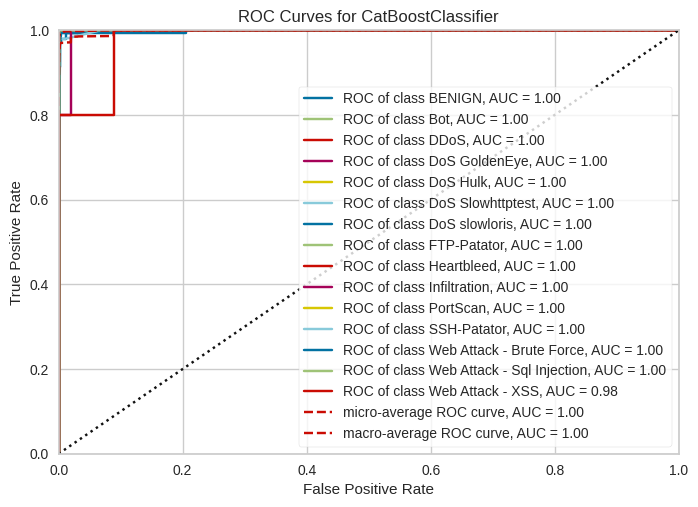

<Axes: title={'center': 'ROC Curves for CatBoostClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [ ]:
model = wrap(cat)
visualizer = ROCAUC(model)
visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test)
visualizer.show()

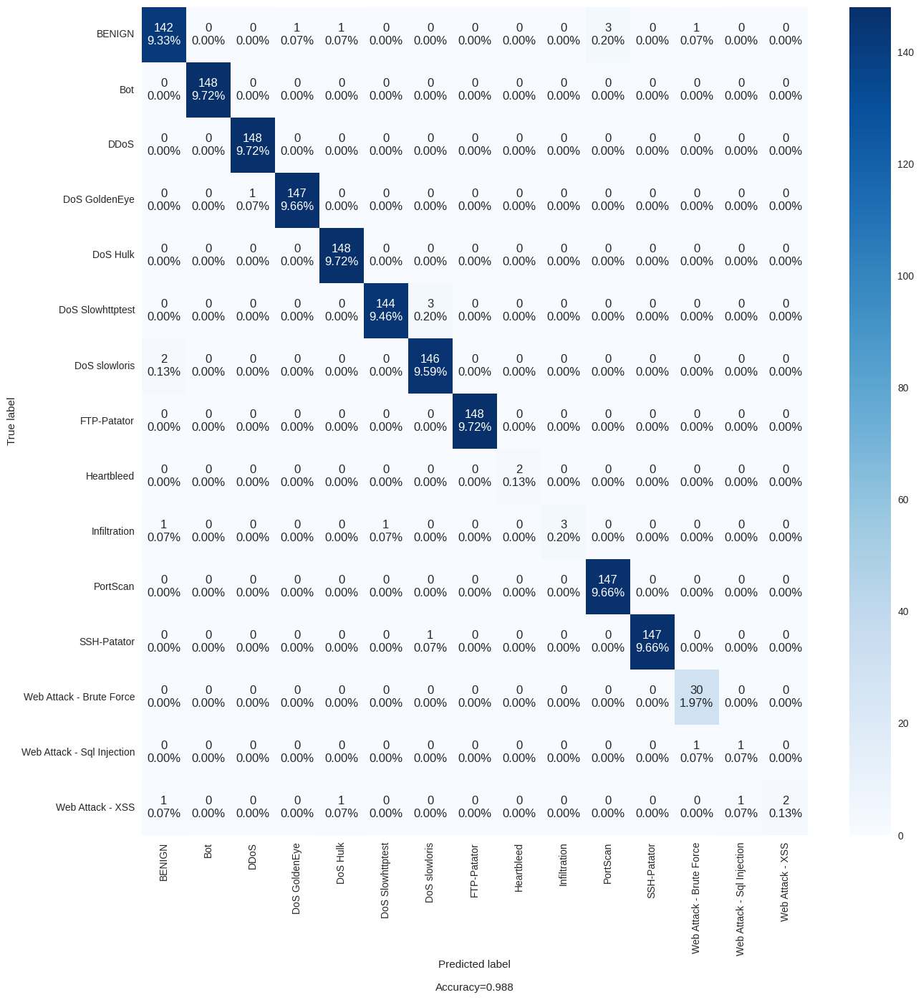

In [ ]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(cat.classes_)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

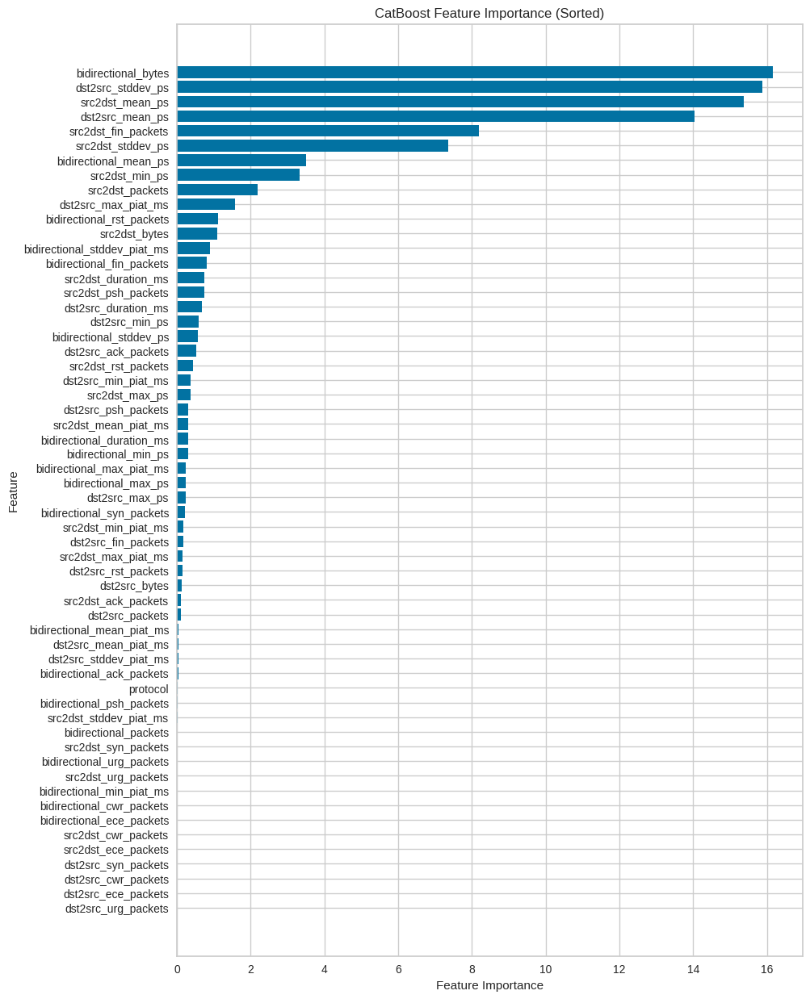

In [ ]:
# Retrieve feature importance
feature_importance = model.get_feature_importance(type="FeatureImportance")
feature_names = X_train.columns

# Sort the features and feature importance scores
sorted_indices = np.argsort(feature_importance)
sorted_feature_importance = feature_importance[sorted_indices]
sorted_feature_names = feature_names[sorted_indices]

# Plot the sorted feature importance
plt.figure(figsize=(10, 15))
plt.barh(sorted_feature_names, sorted_feature_importance)
plt.xlabel('Feature Importance')
plt.ylabel('Feature')
plt.title('CatBoost Feature Importance (Sorted)')
plt.show()

Using interventional to stay "true to the model" since we will use this data to do feature reduction and we want also to understand how things work

In [ ]:
%%time

explainer = fasttreeshap.TreeExplainer(cat, algorithm='auto', n_jobs=-1) 
sv = explainer(X_train)

CPU times: user 46.9 s, sys: 441 ms, total: 47.4 s
Wall time: 5.75 s


In [ ]:
cat.classes_

array(['BENIGN', 'Bot', 'DDoS', 'DoS GoldenEye', 'DoS Hulk',
       'DoS Slowhttptest', 'DoS slowloris', 'FTP-Patator', 'Heartbleed',
       'Infiltration', 'PortScan', 'SSH-Patator',
       'Web Attack - Brute Force', 'Web Attack - Sql Injection',
       'Web Attack - XSS'], dtype=object)

In [ ]:
def make_plot(i):
    exp = Explanation(sv.values[:,:,i], 
                  sv.base_values[:,i], 
                  data=X_train, 
                  feature_names=X_res.columns)

    plots.bar(exp, max_display=20, show=False)
    # plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
    plt.show()
    plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)
    plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)
    plots.bar(exp.abs.cohorts(2).mean(0))
    plots.heatmap(exp, instance_order=exp.sum(1))

## Benign shap

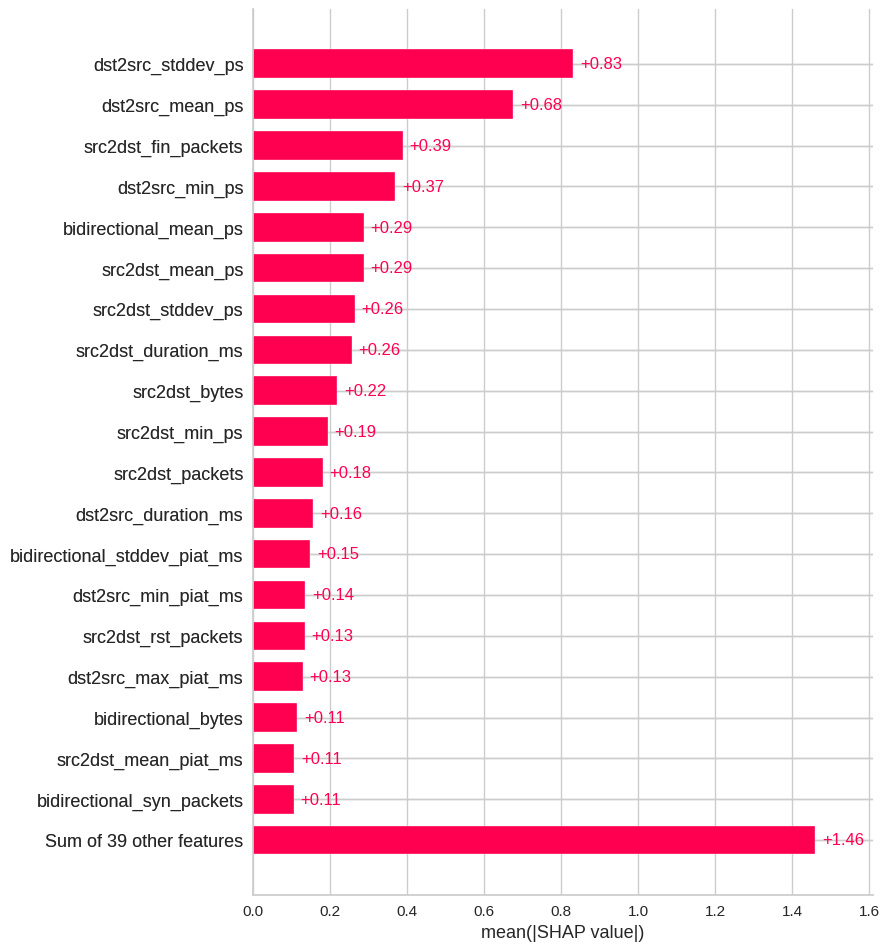

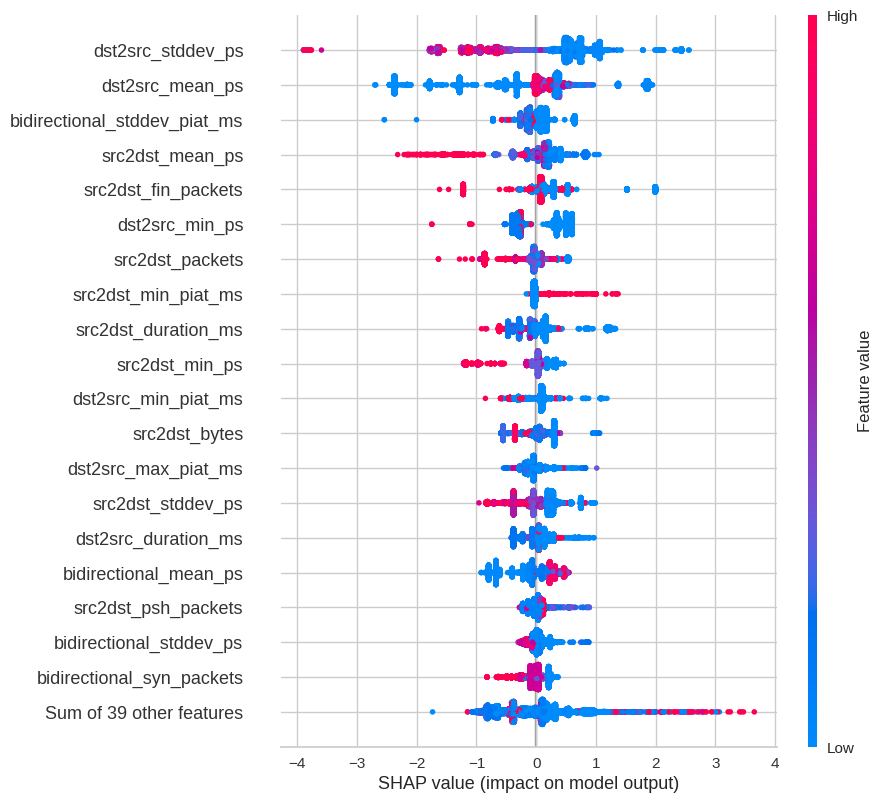

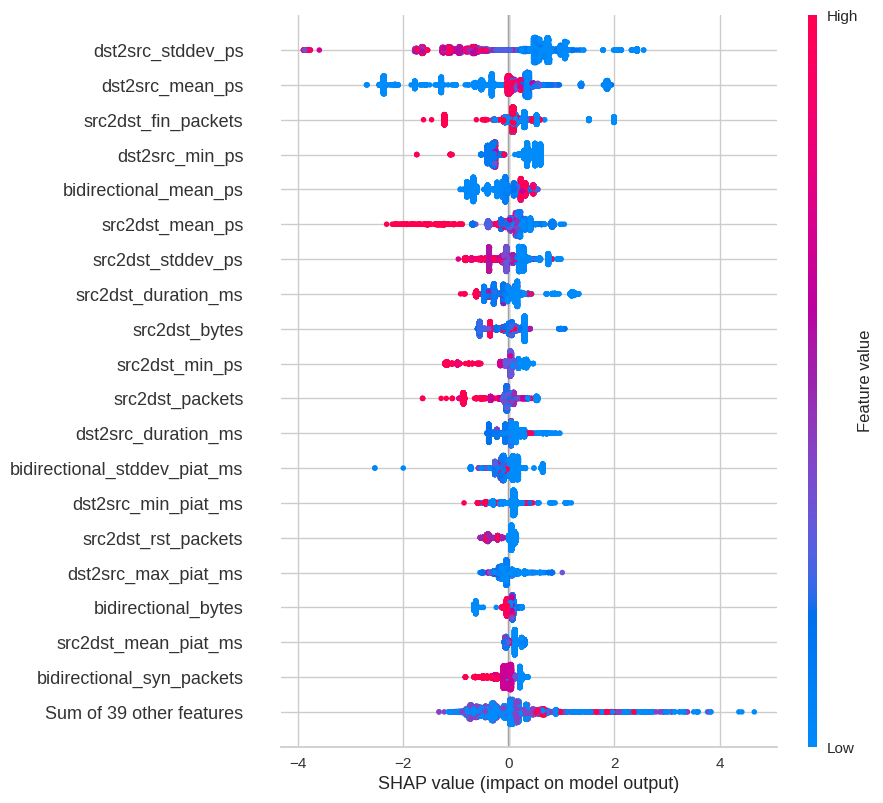

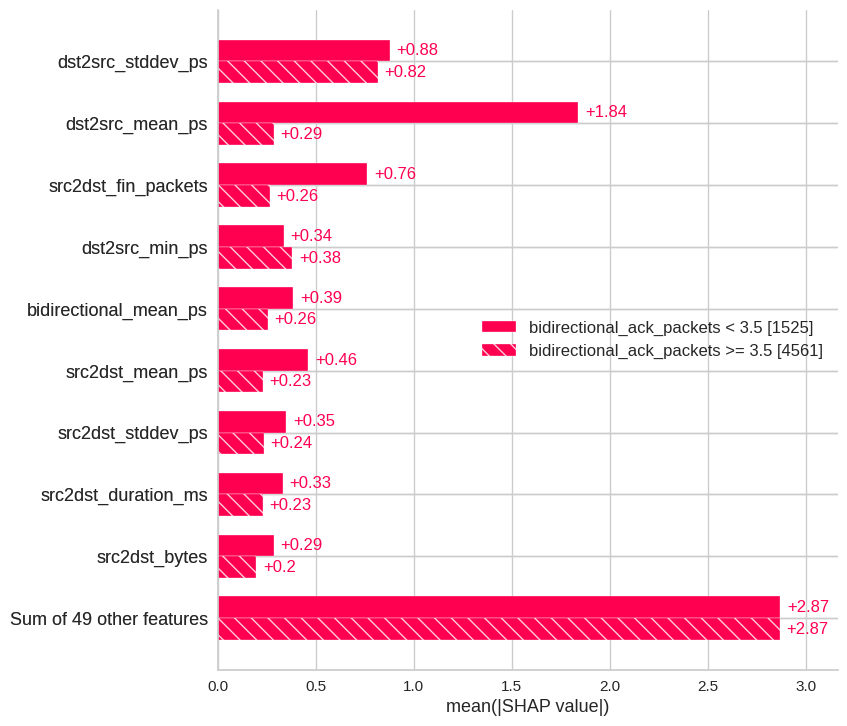

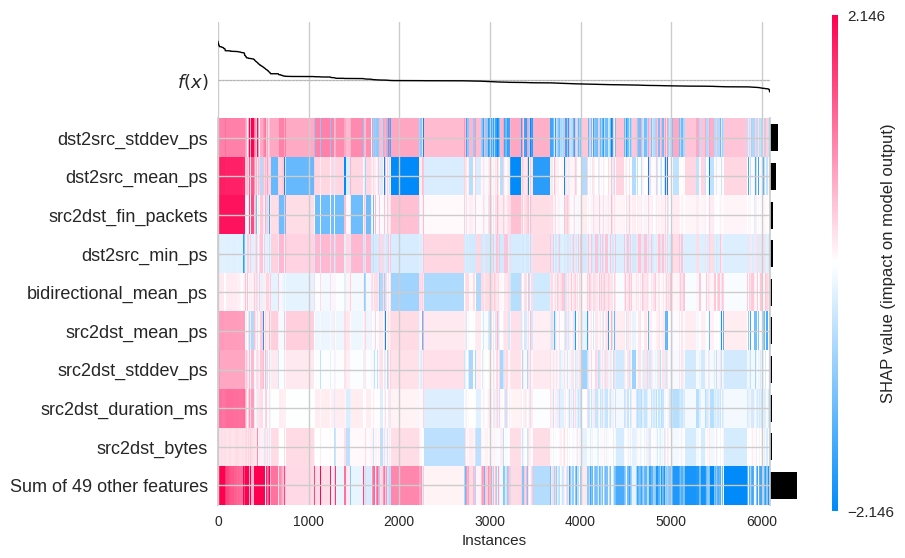

In [ ]:
make_plot(0)

## Bot shap

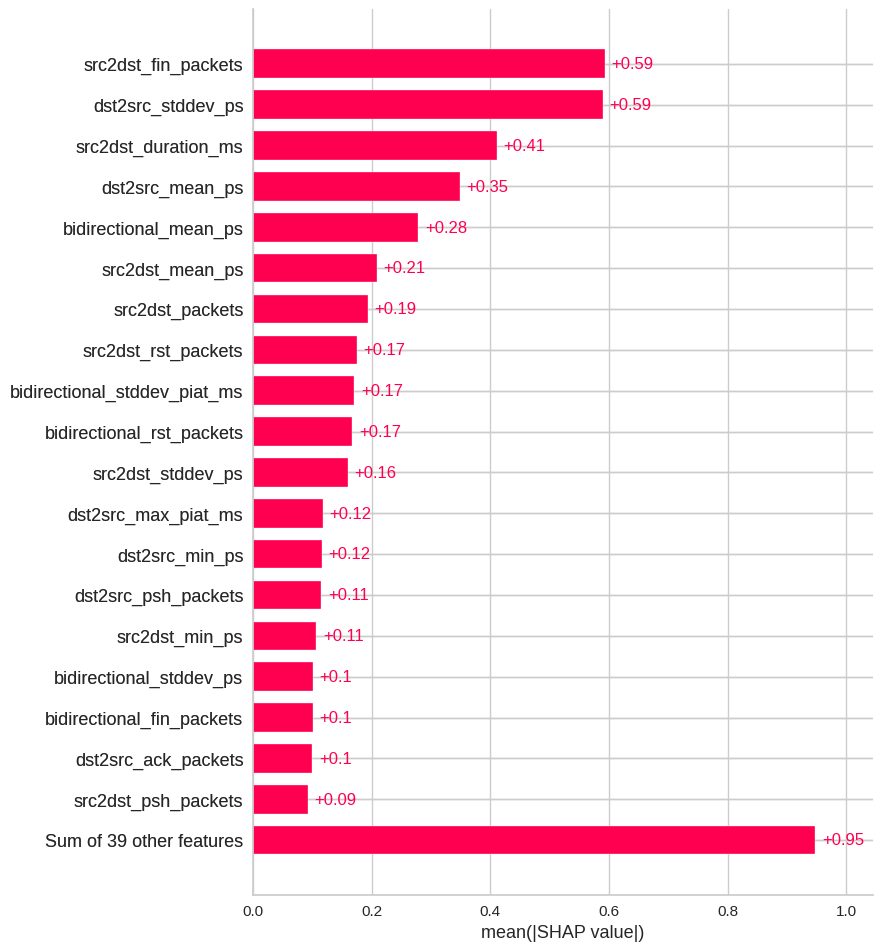

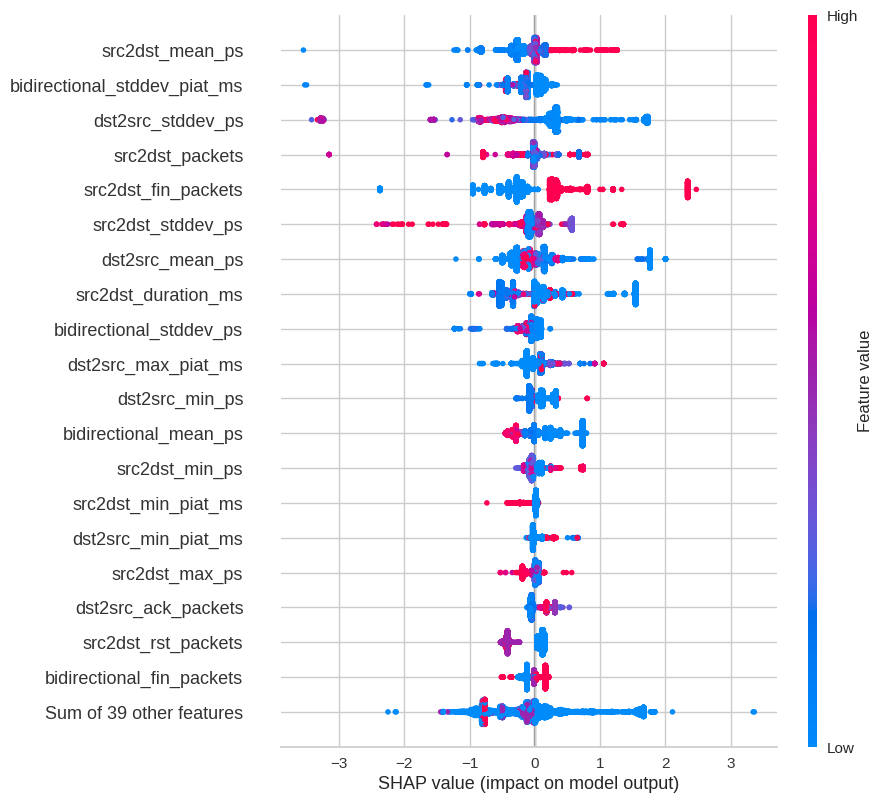

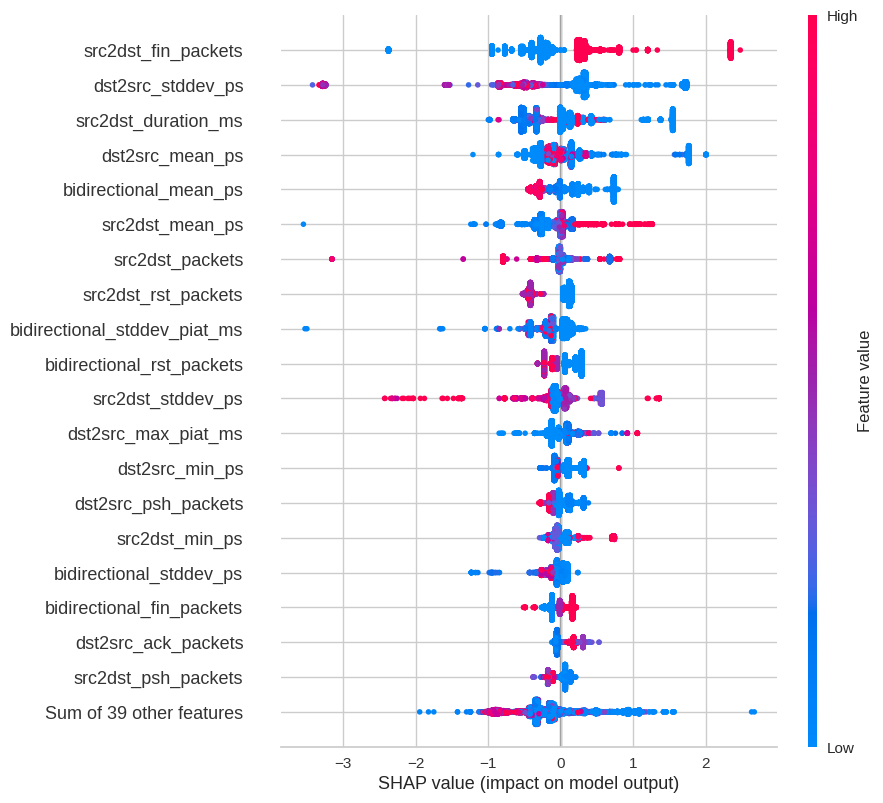

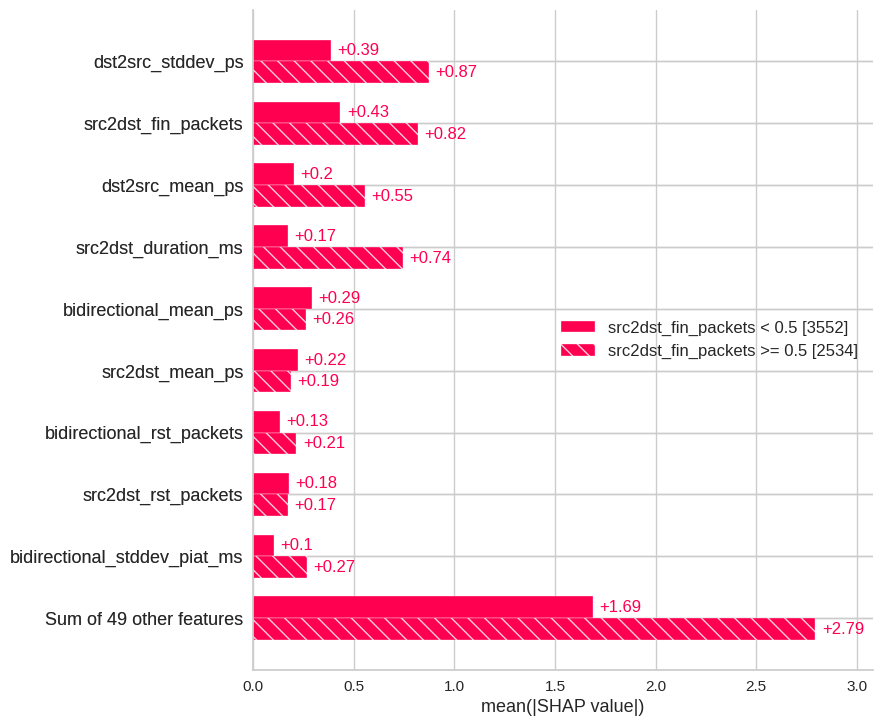

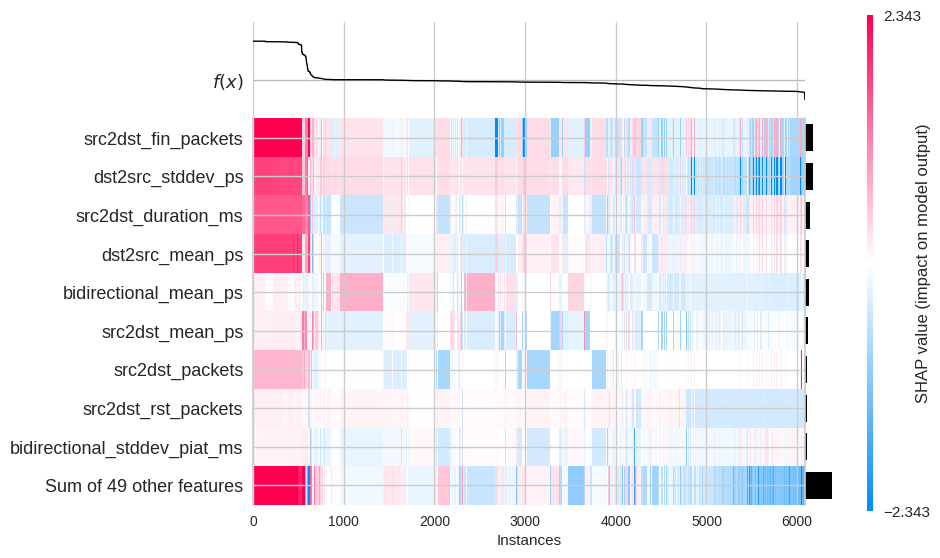

In [ ]:
make_plot(1)

## DDoS shap

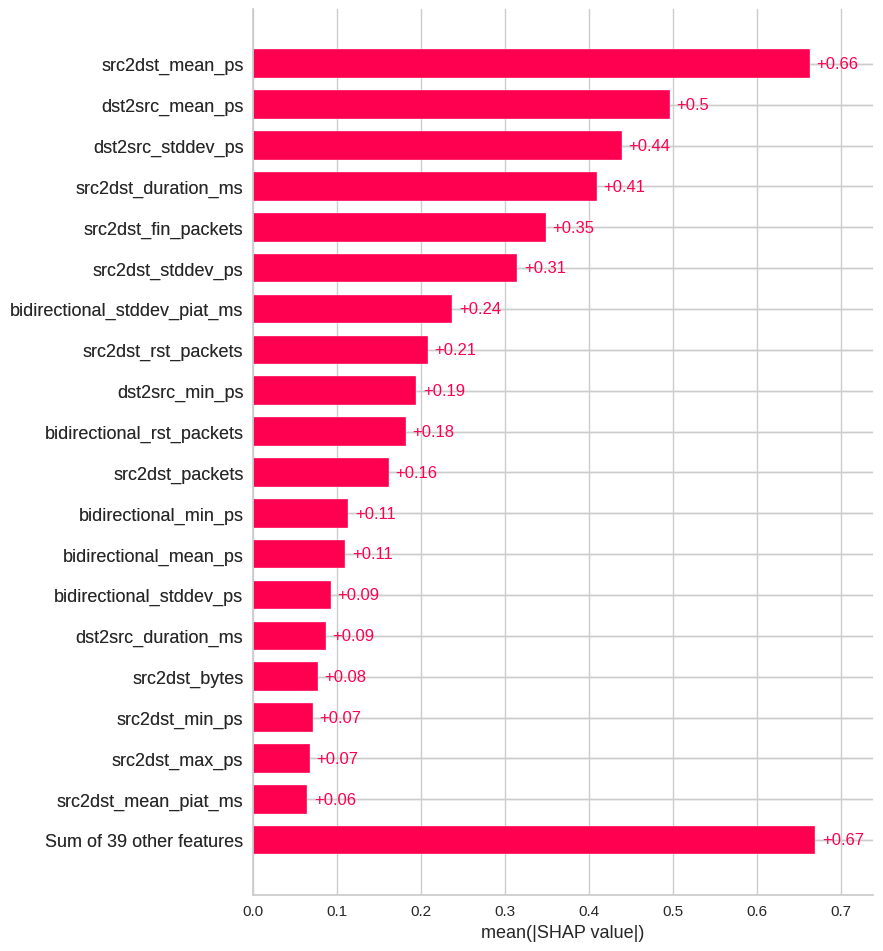

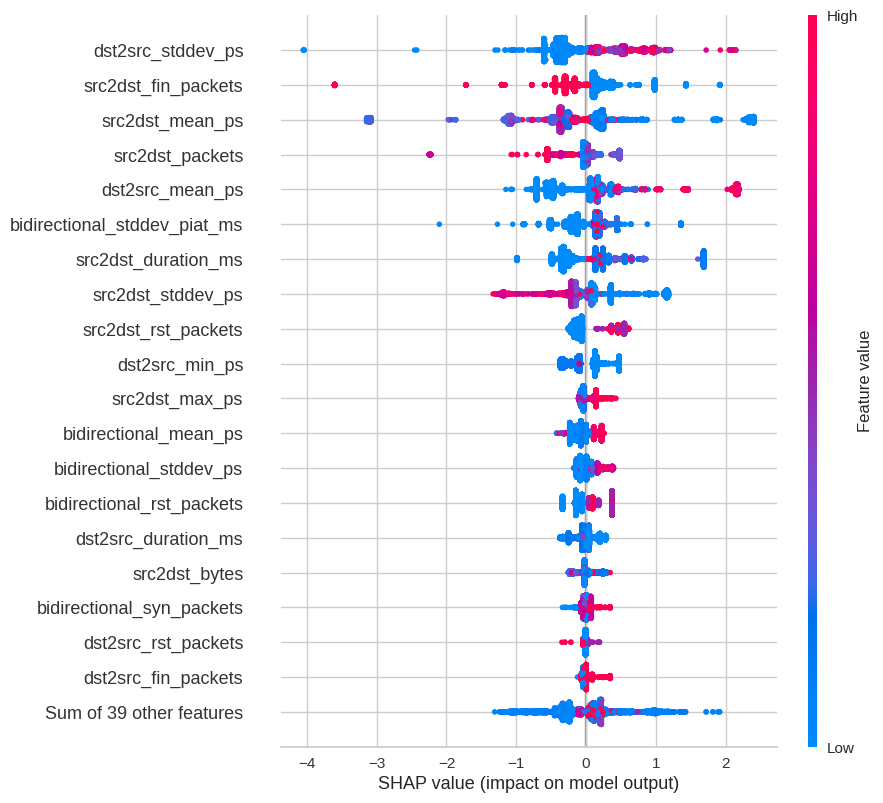

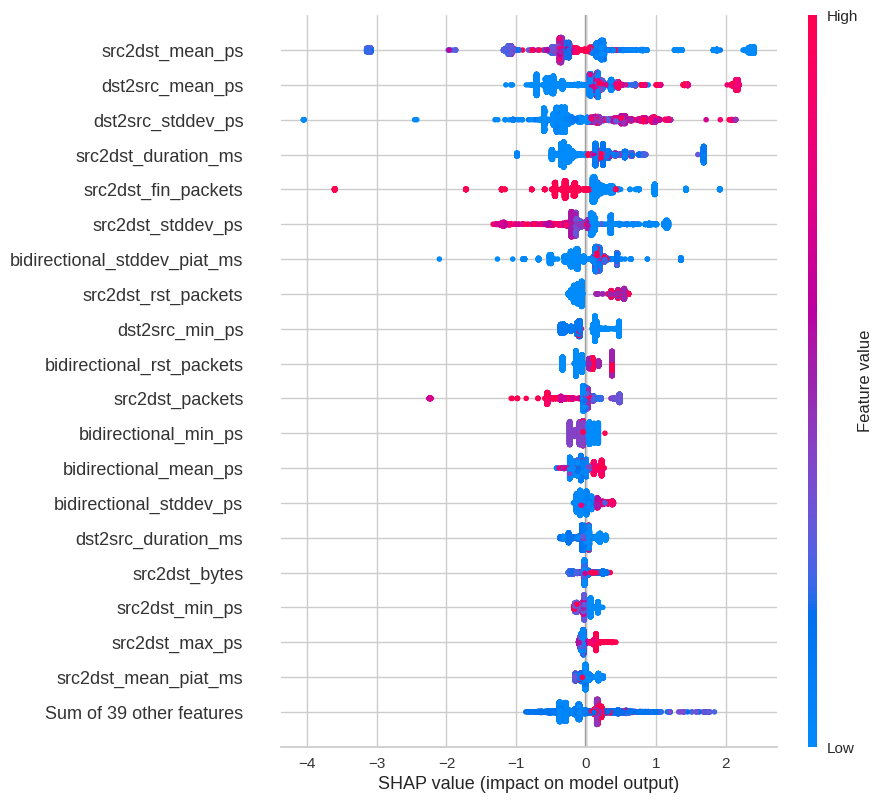

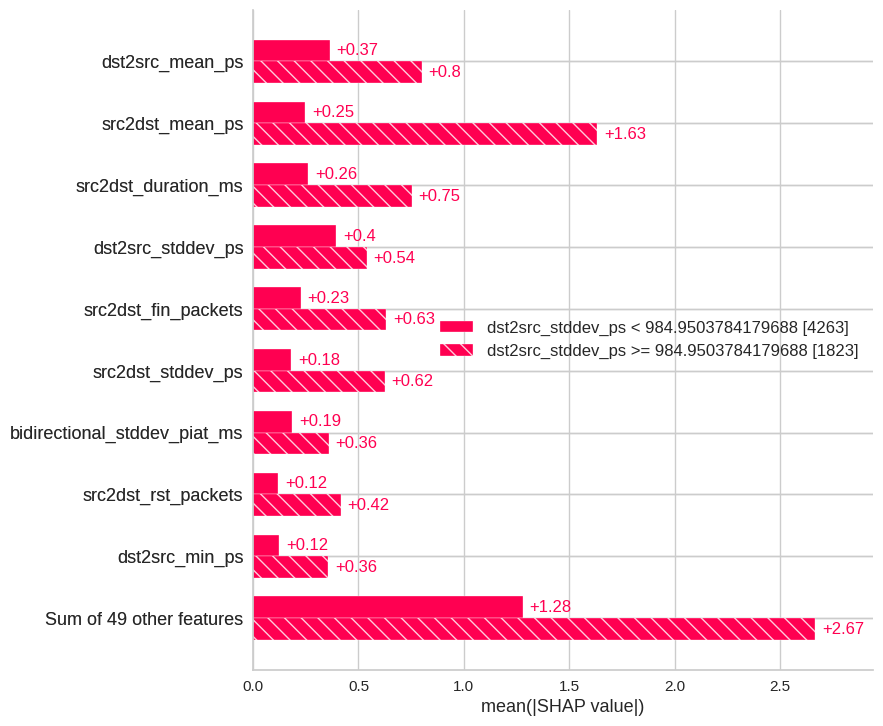

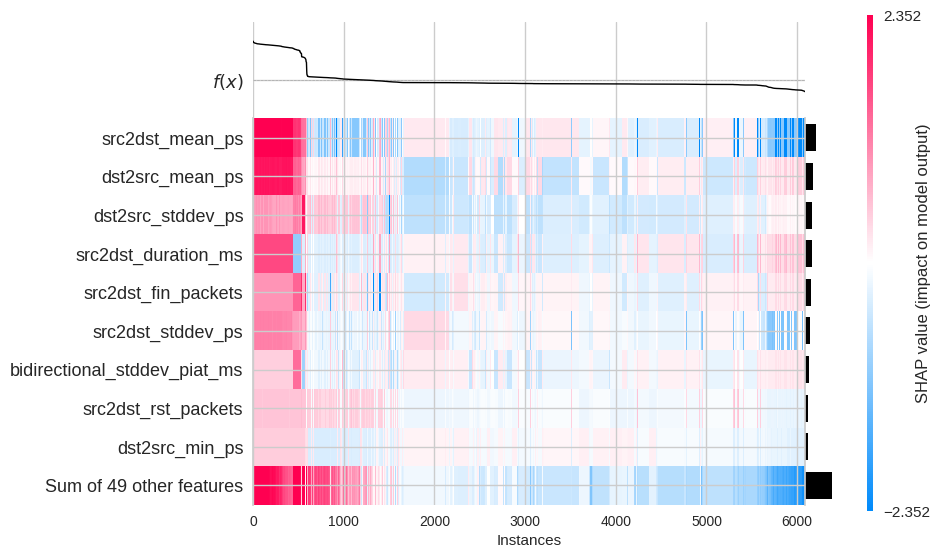

In [ ]:
make_plot(2)

## DoS GoldenEye shap

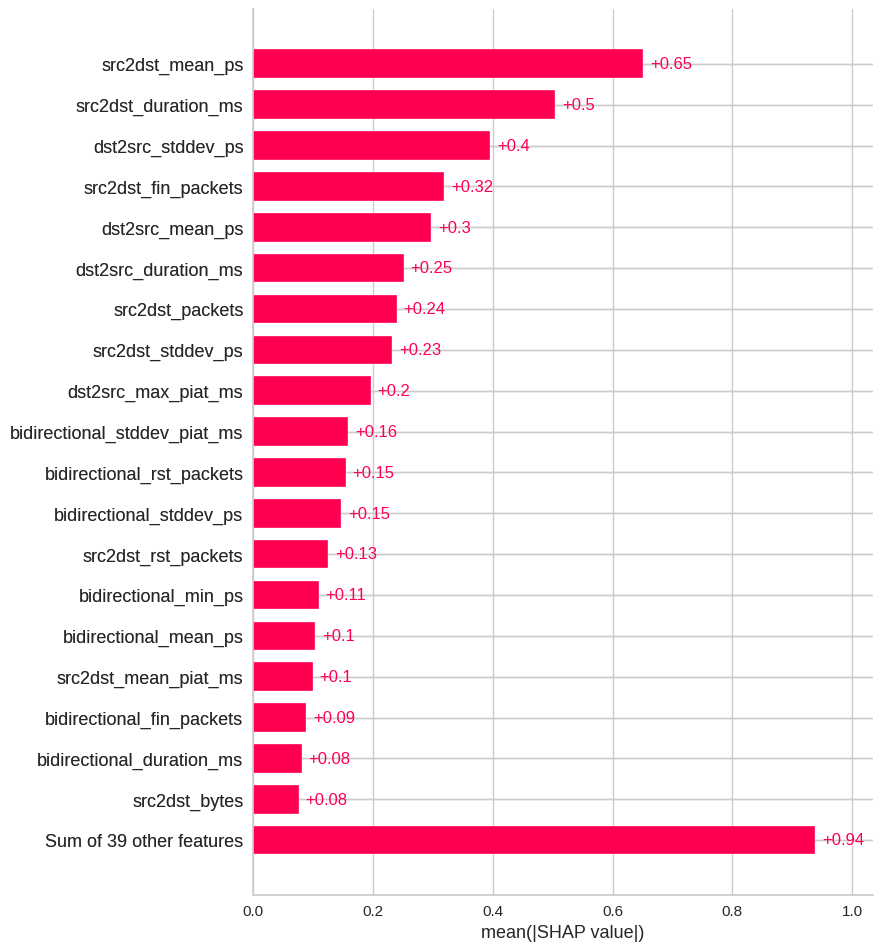

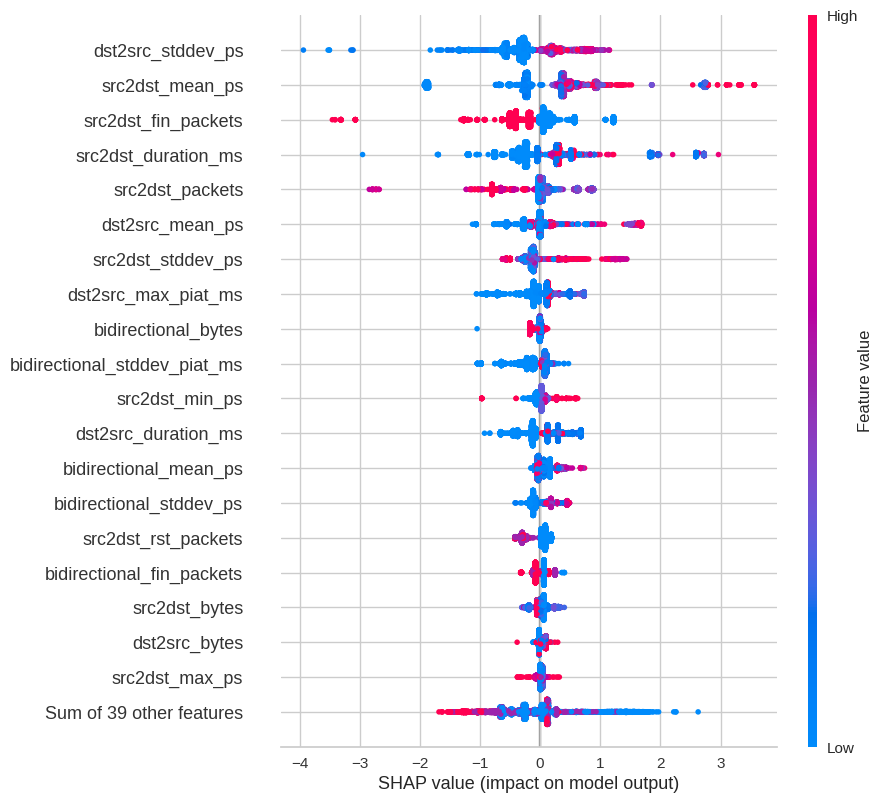

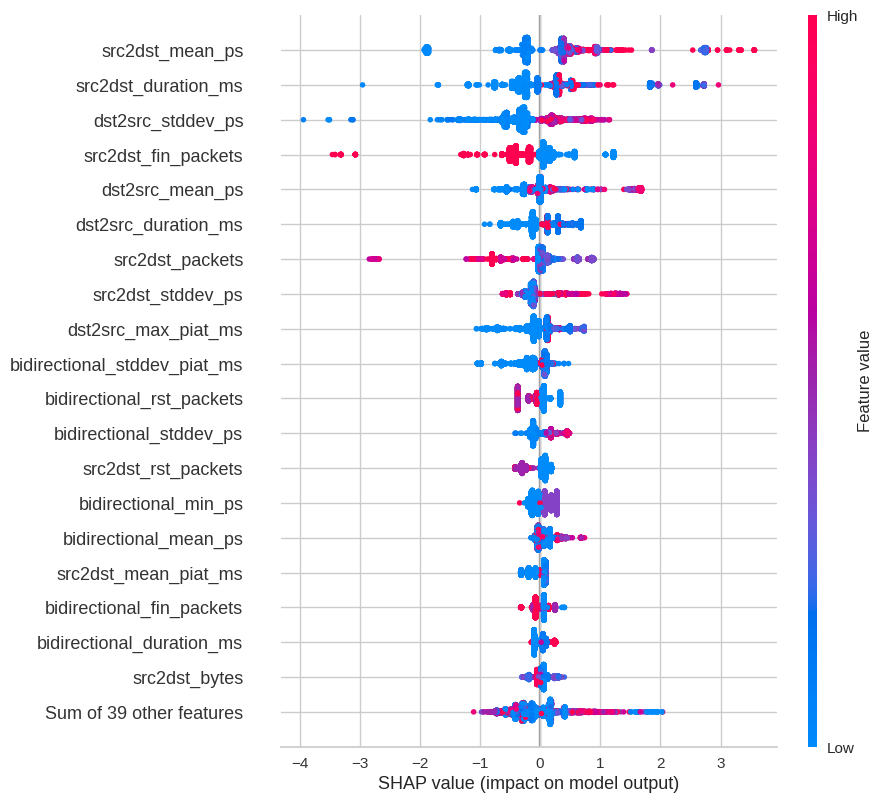

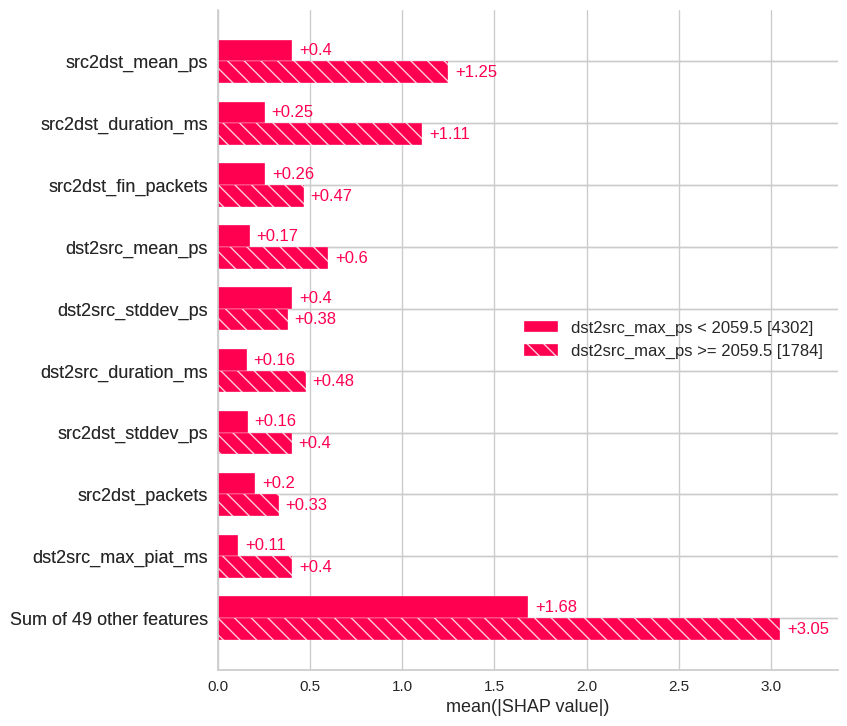

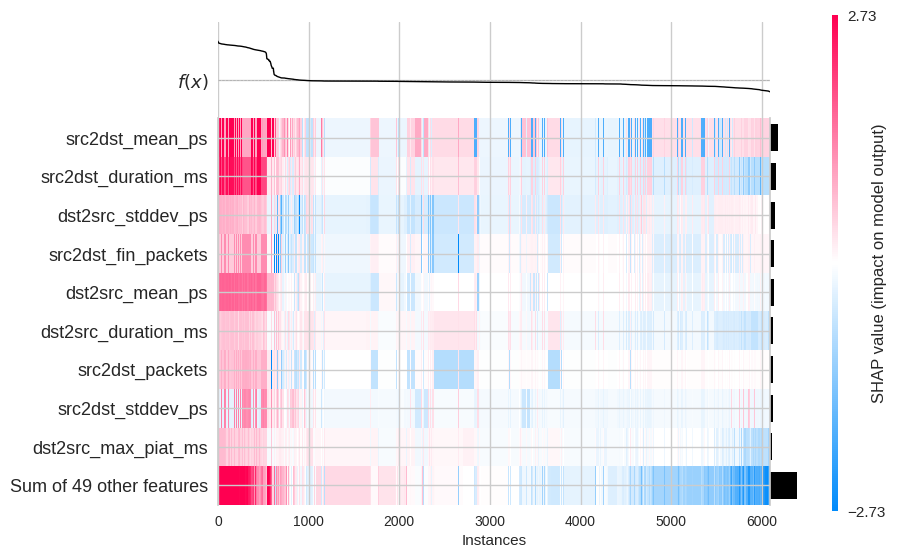

In [ ]:
make_plot(3)

## DoS Hulk shap

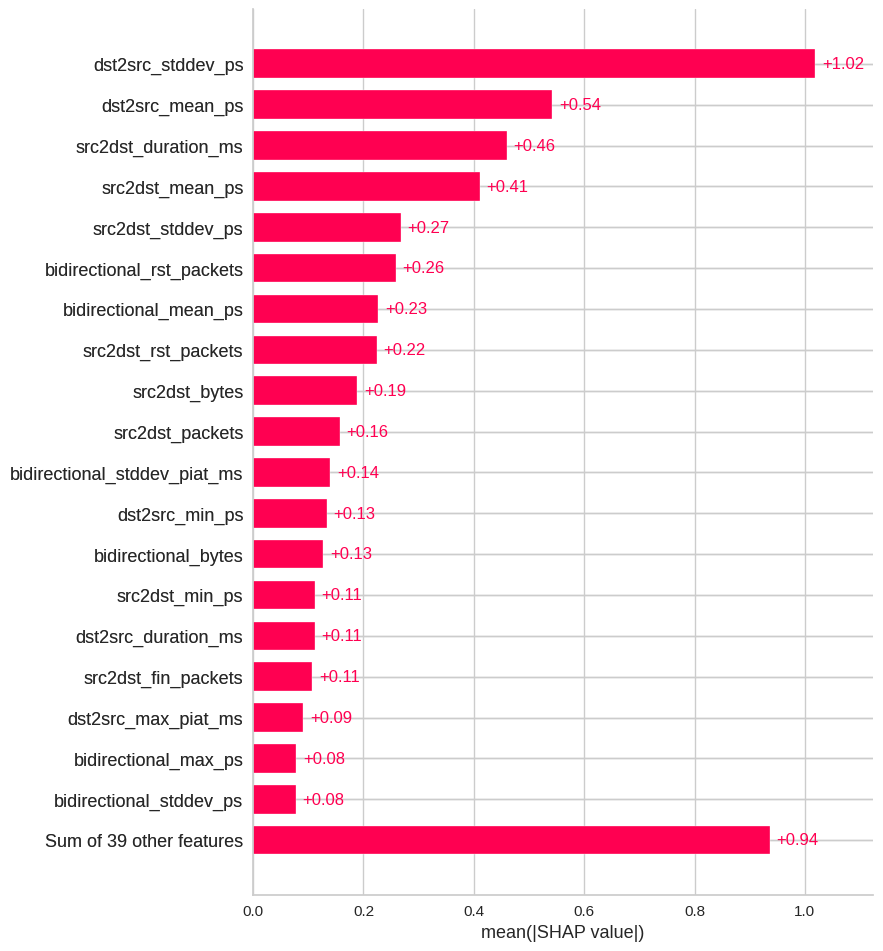

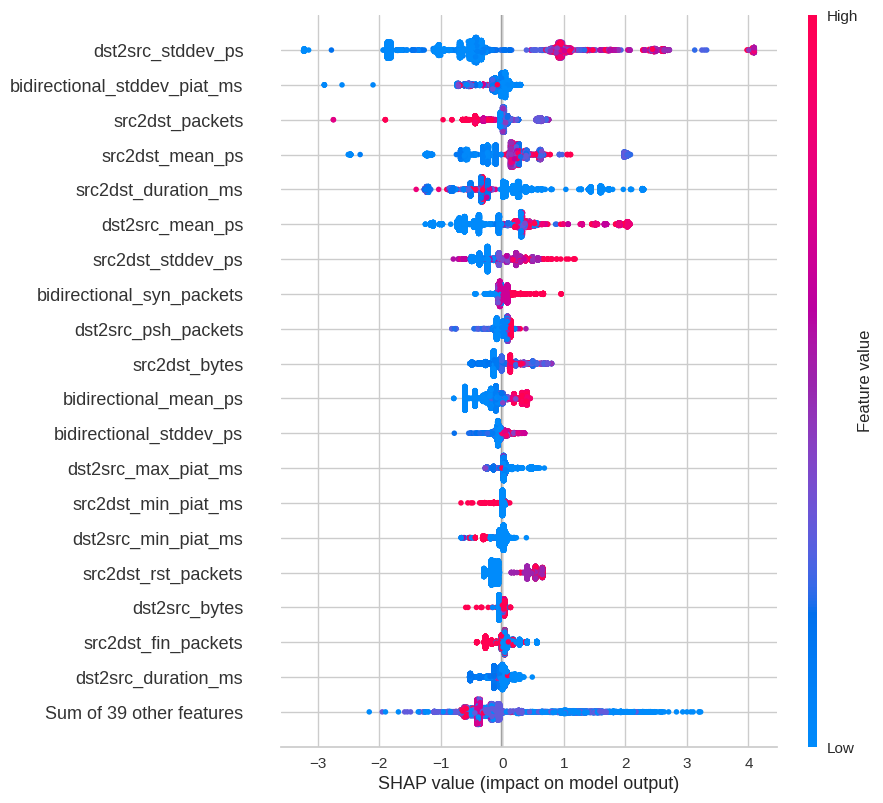

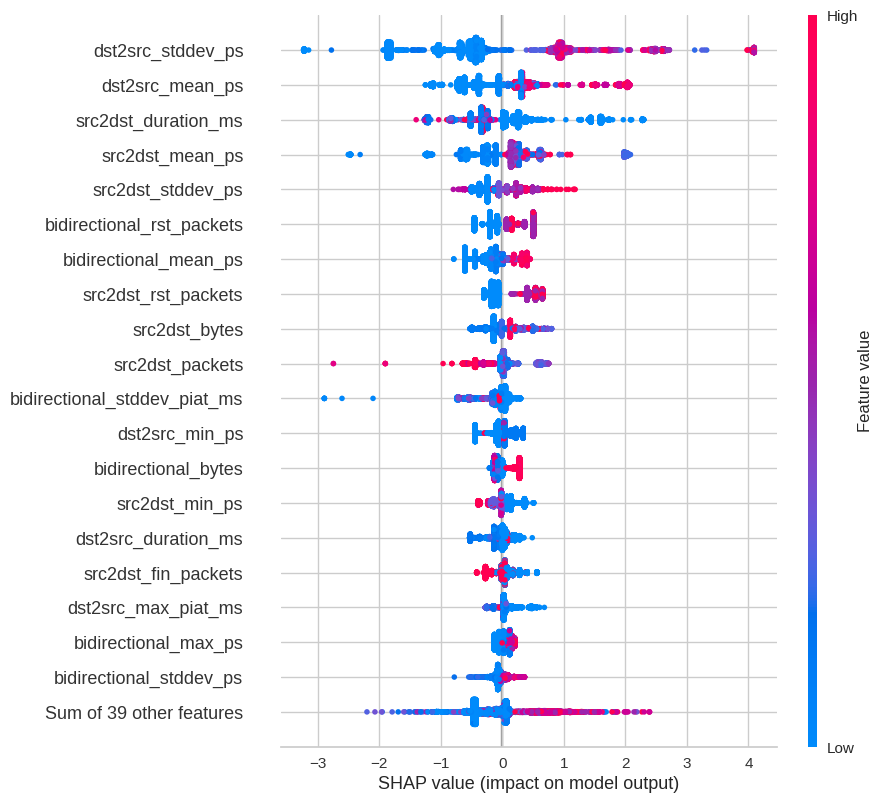

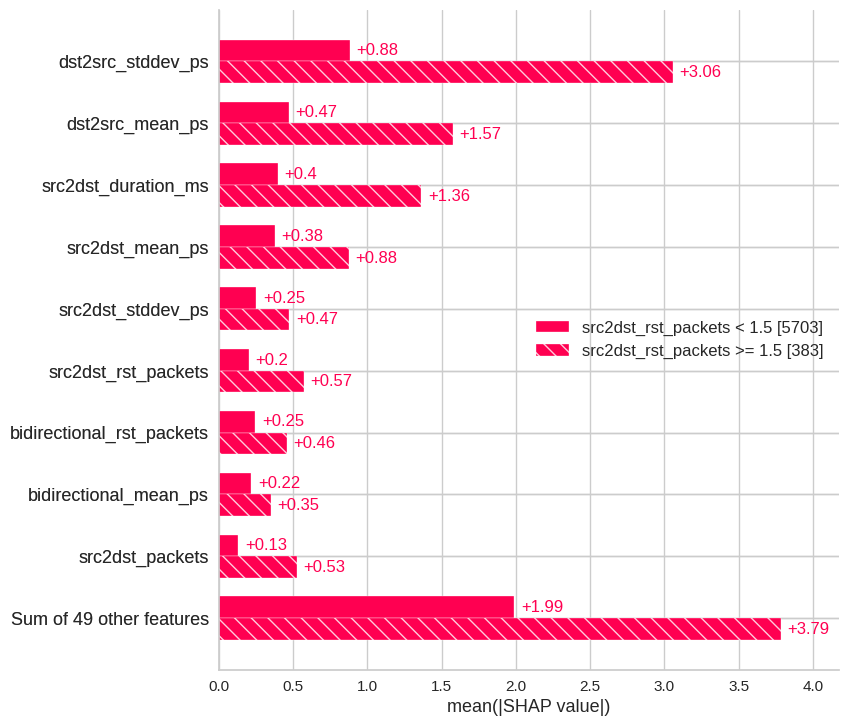

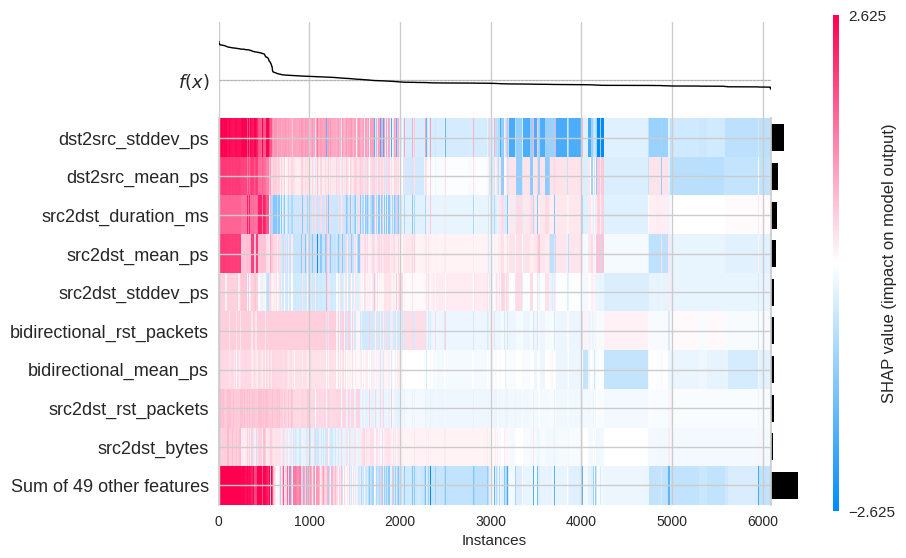

In [ ]:
make_plot(4)

## DoS Slowhttptest shap

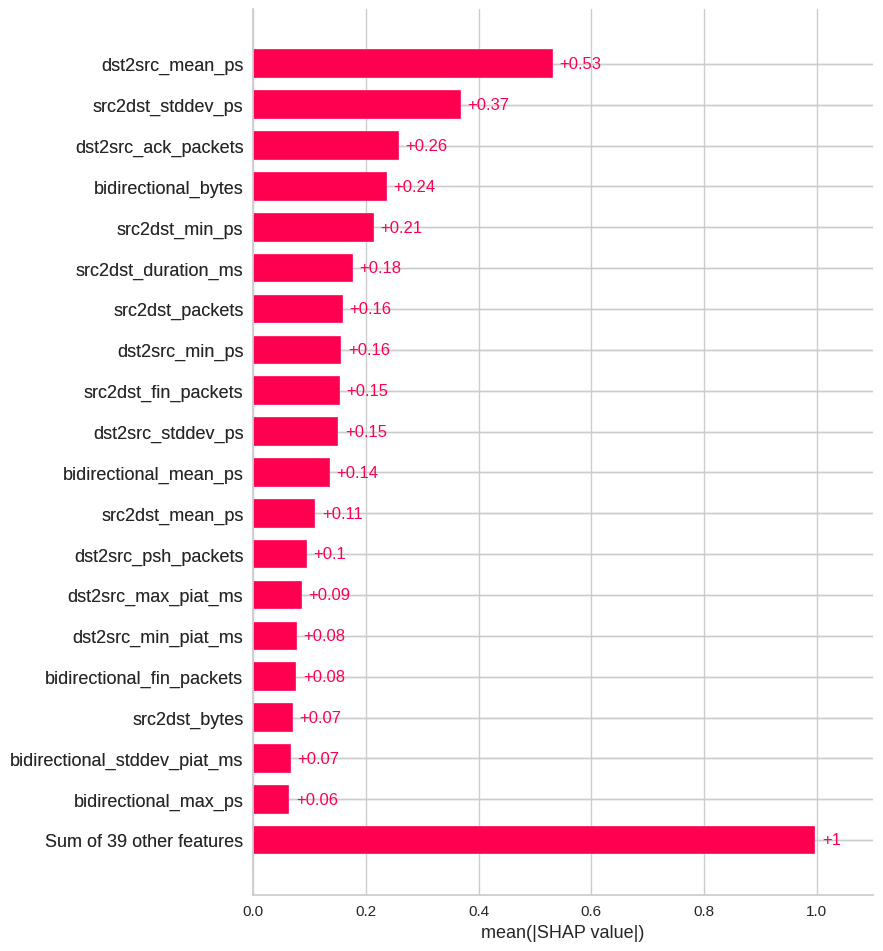

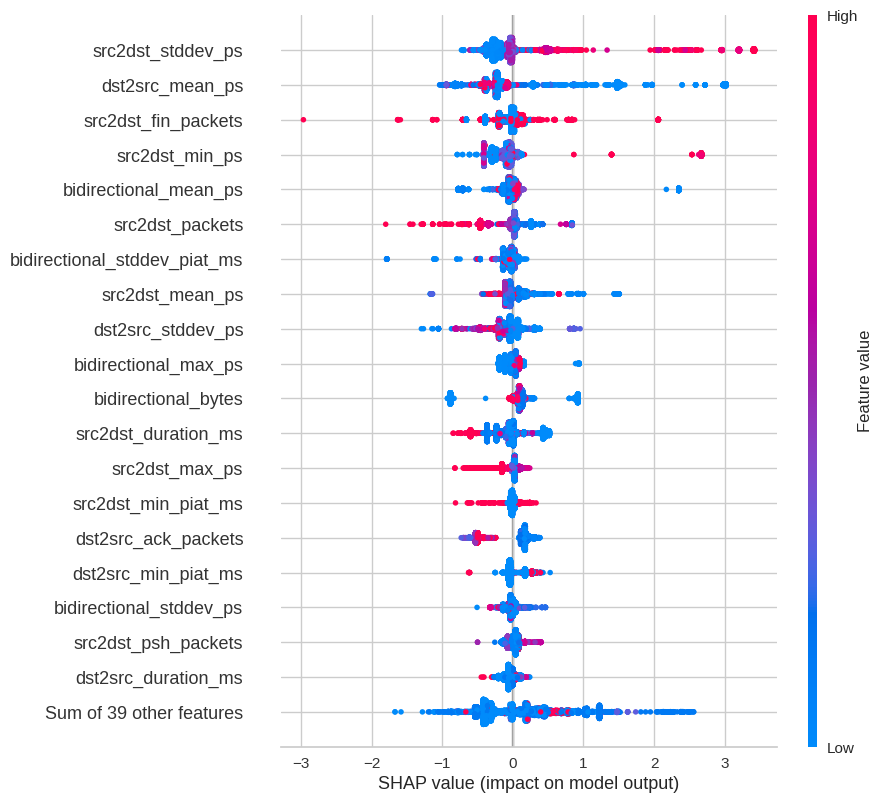

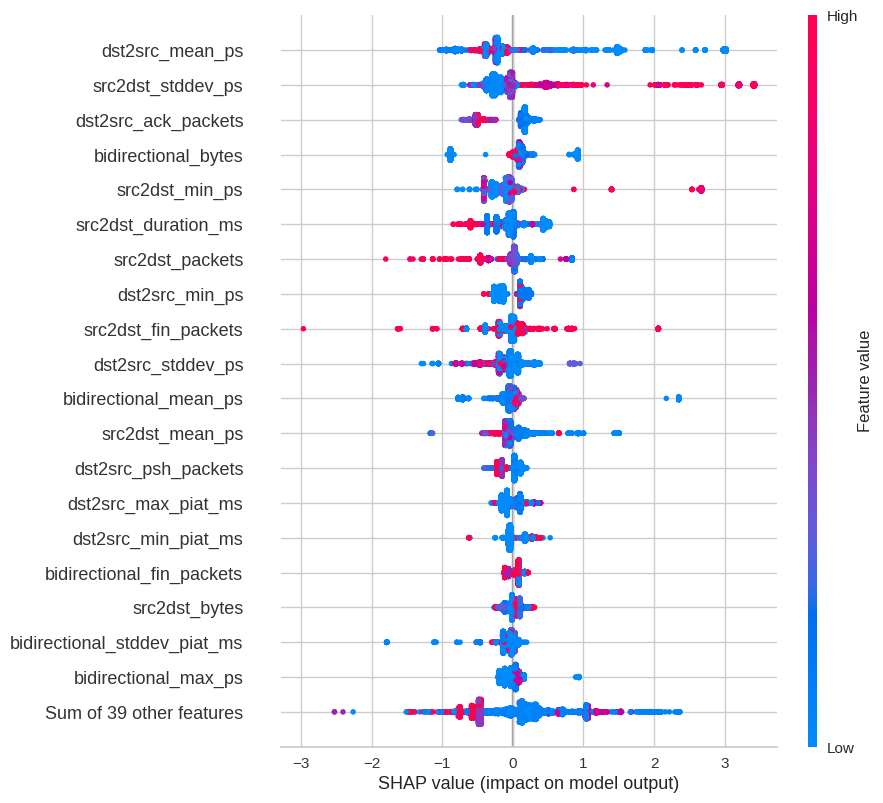

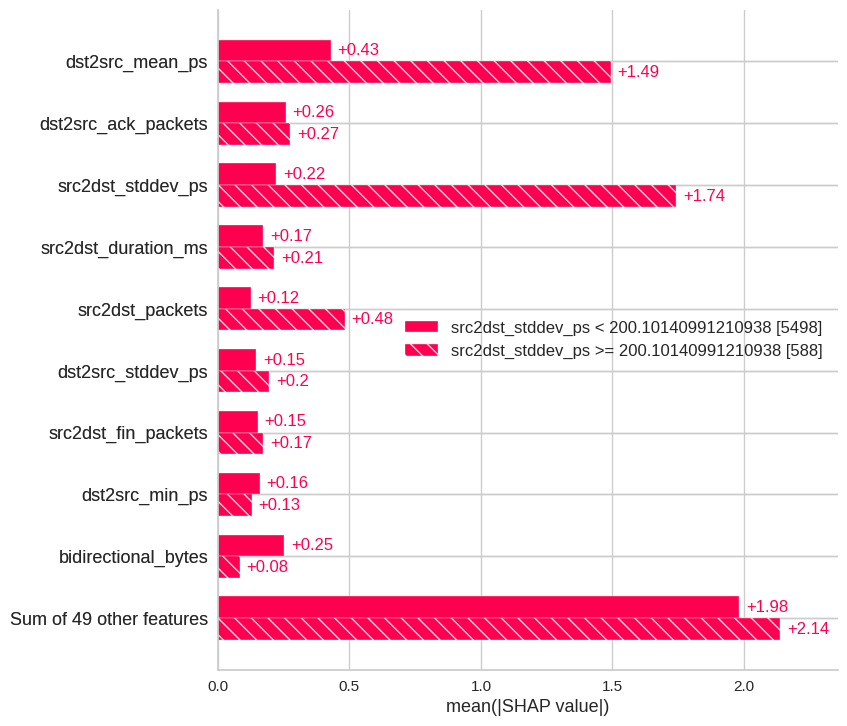

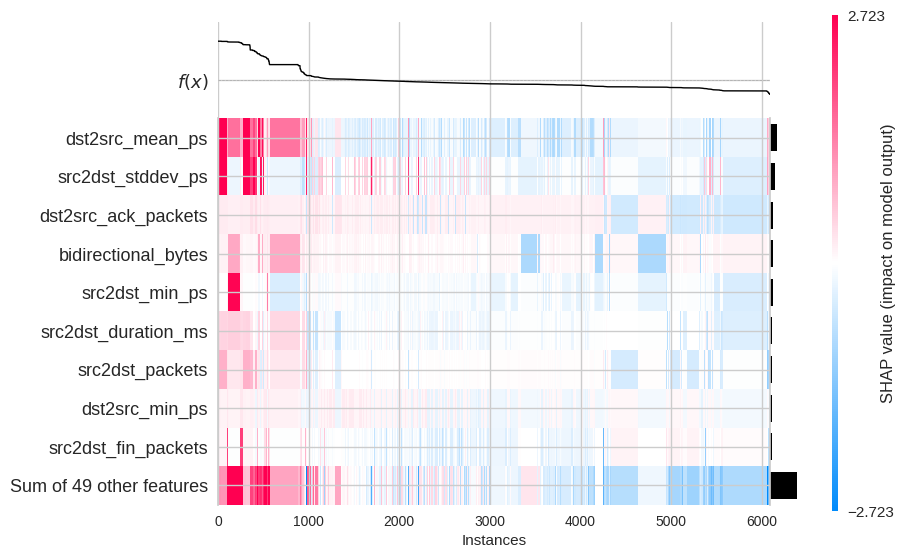

In [ ]:
make_plot(5)

## DoS slowloris shap

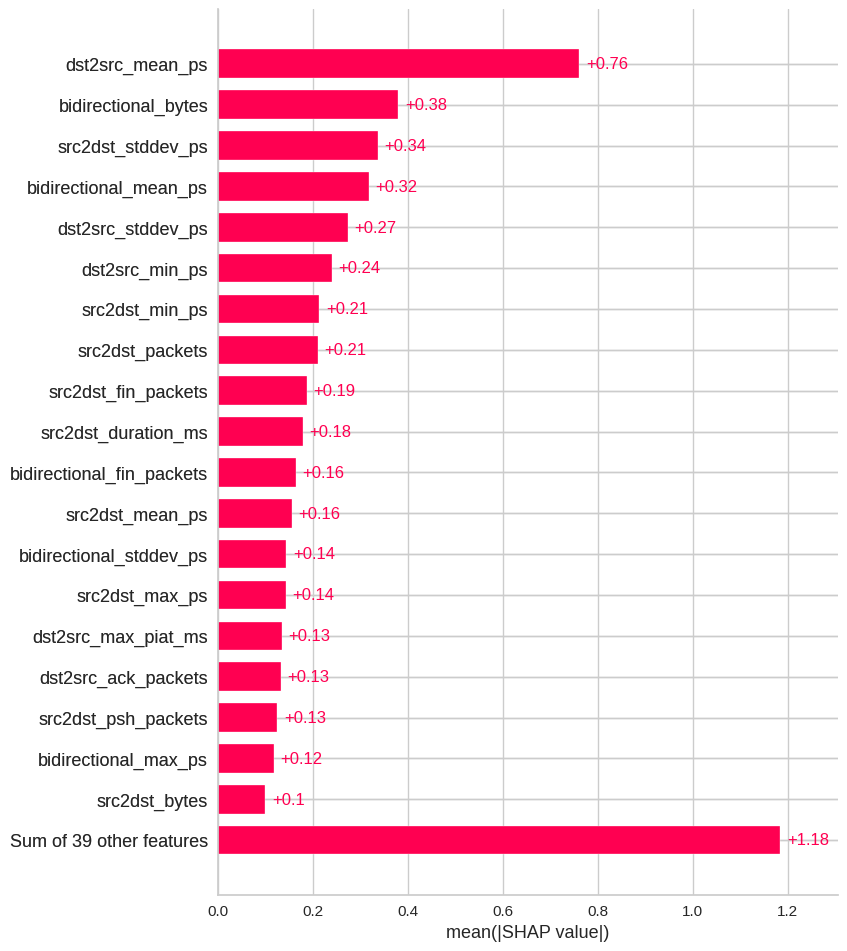

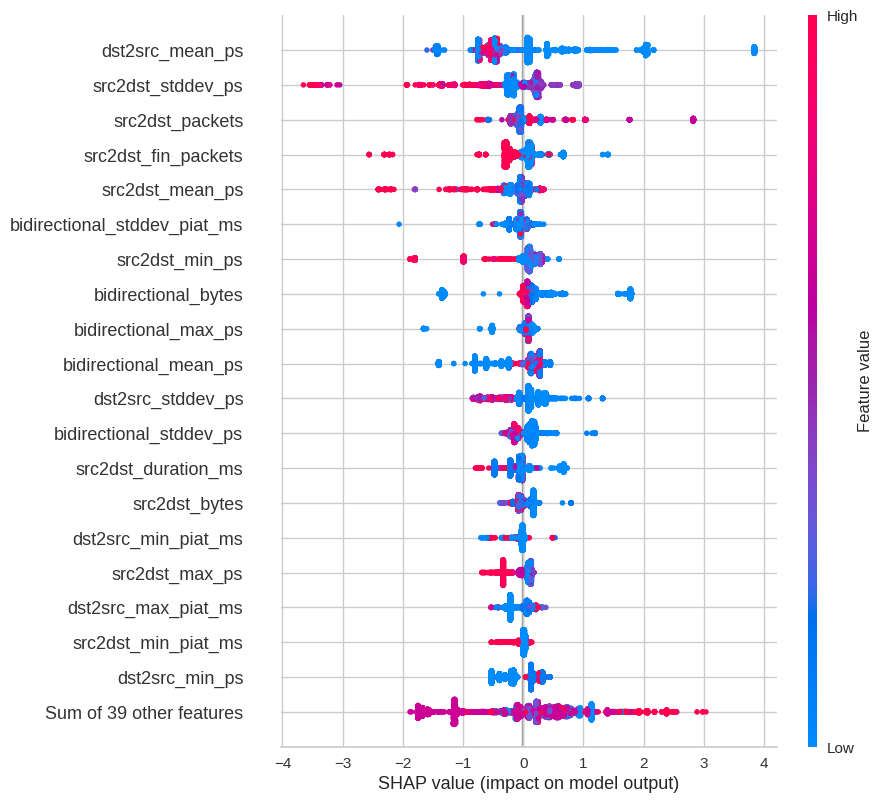

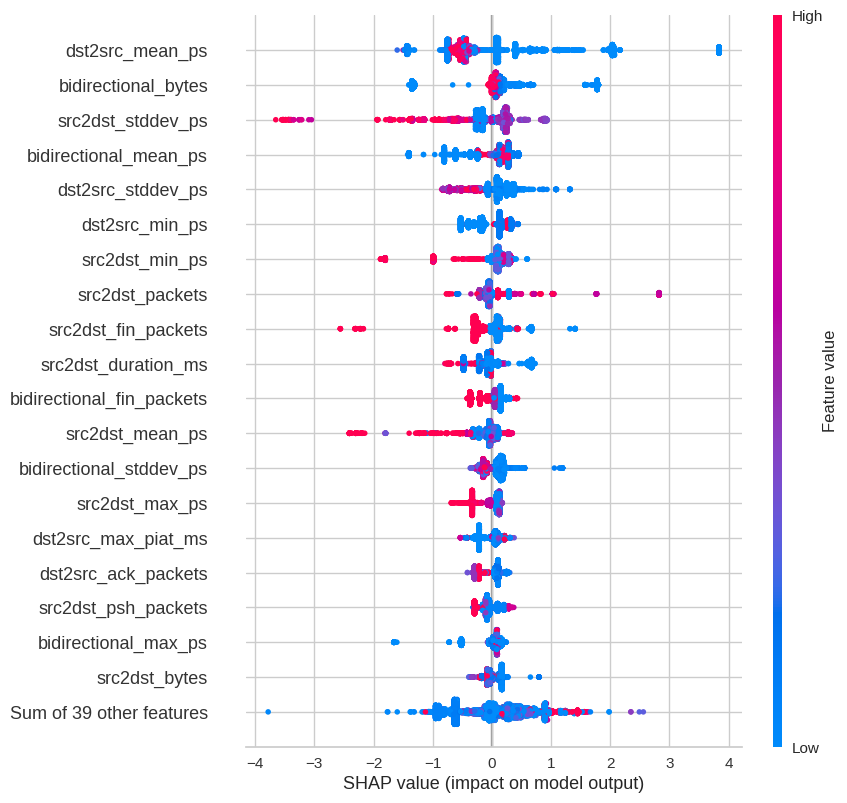

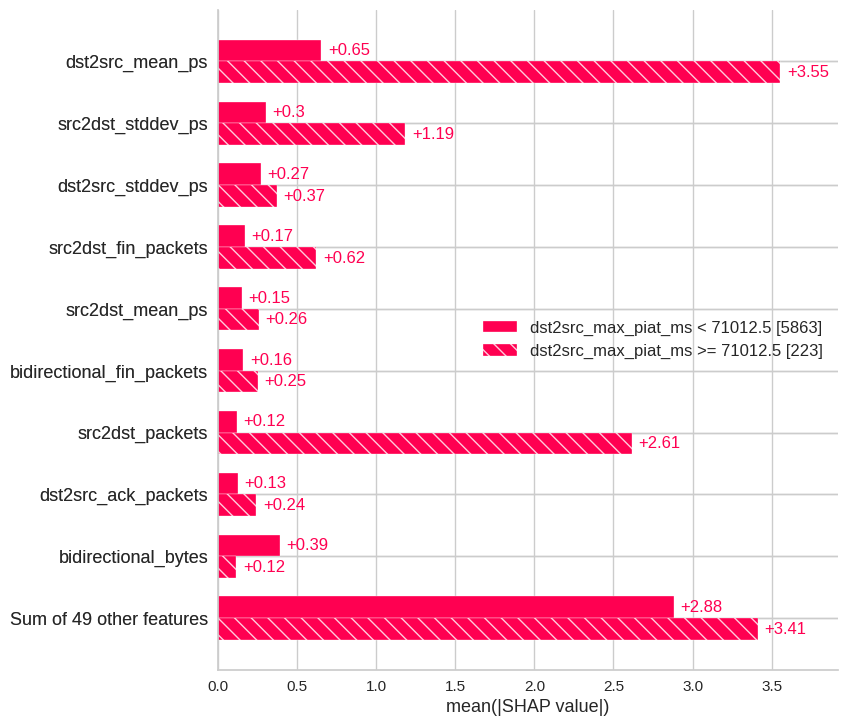

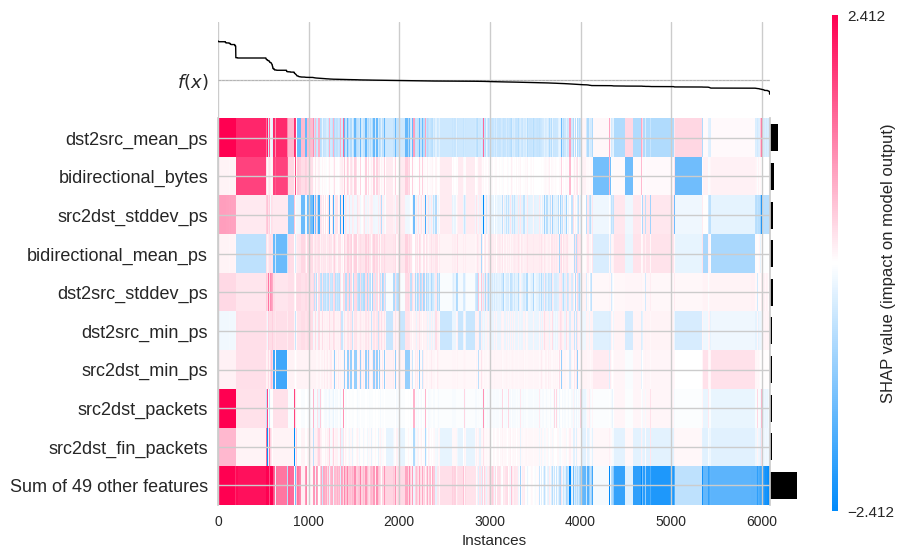

In [ ]:
make_plot(6)

## FTP-Patator shap

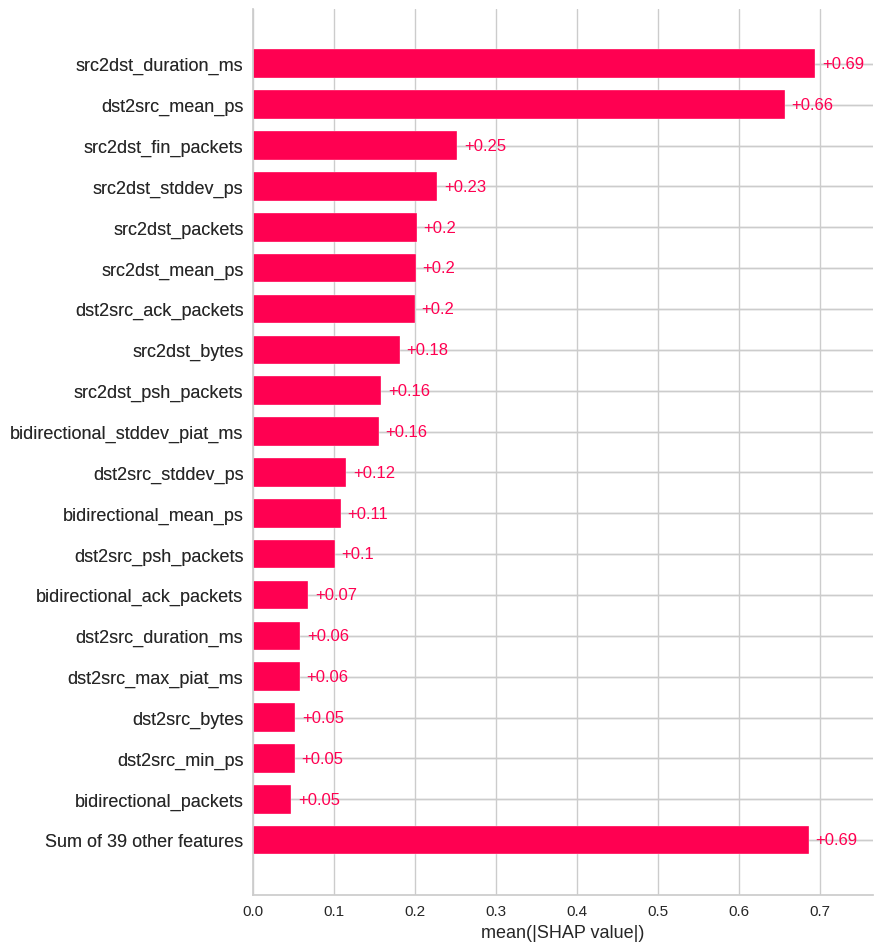

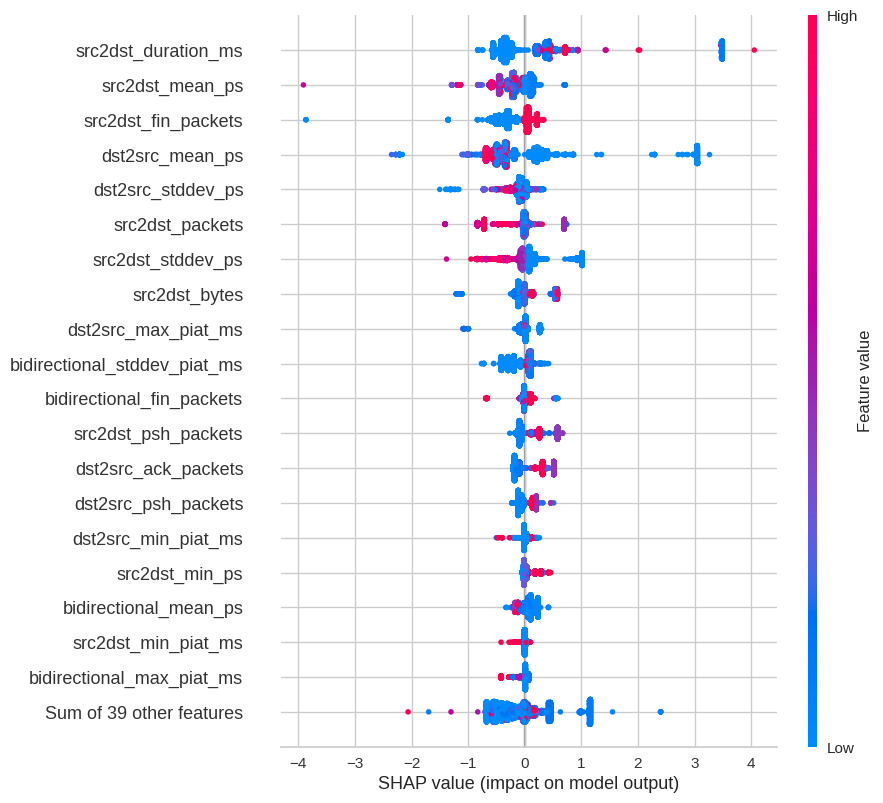

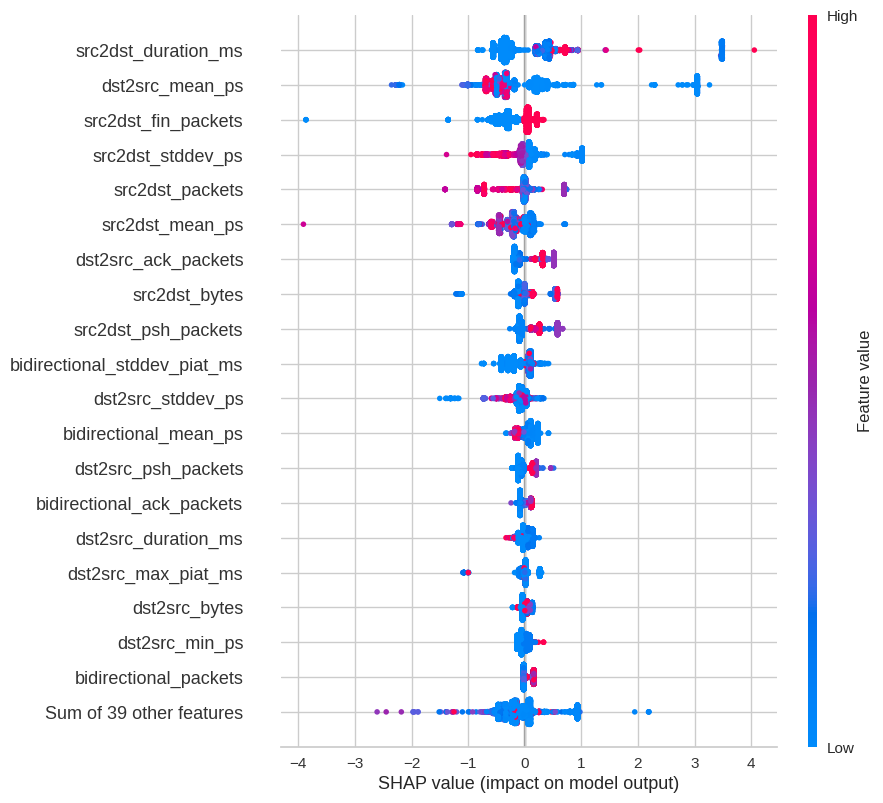

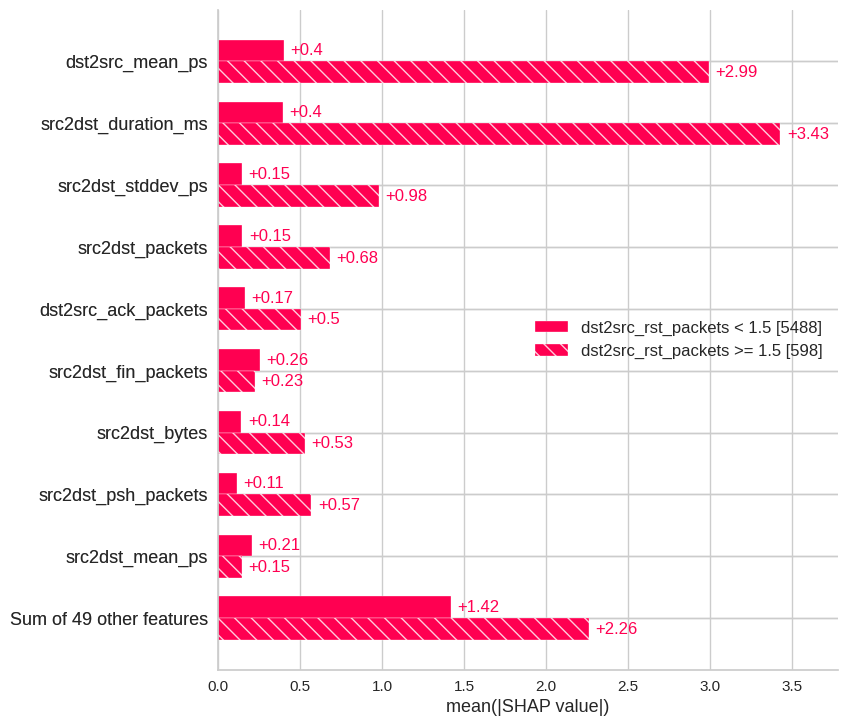

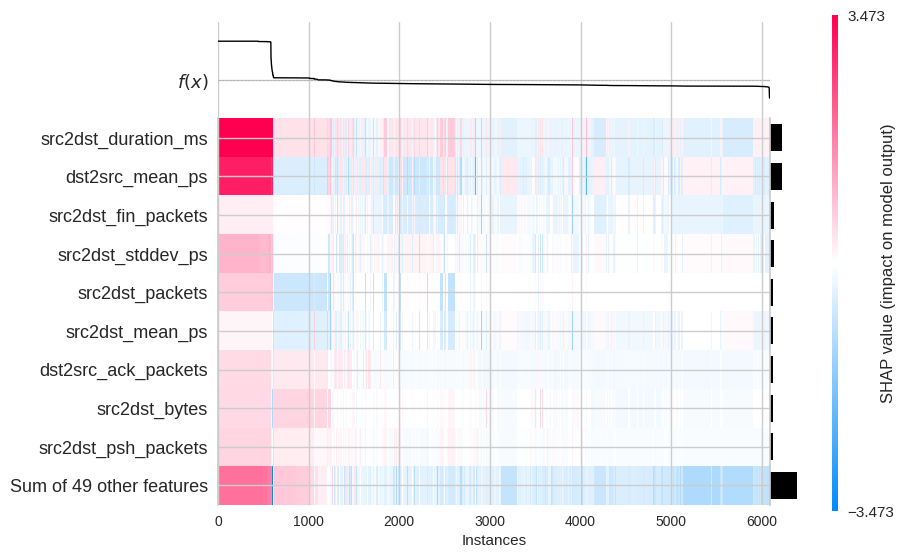

In [ ]:
make_plot(7)

## Heartbleed shap

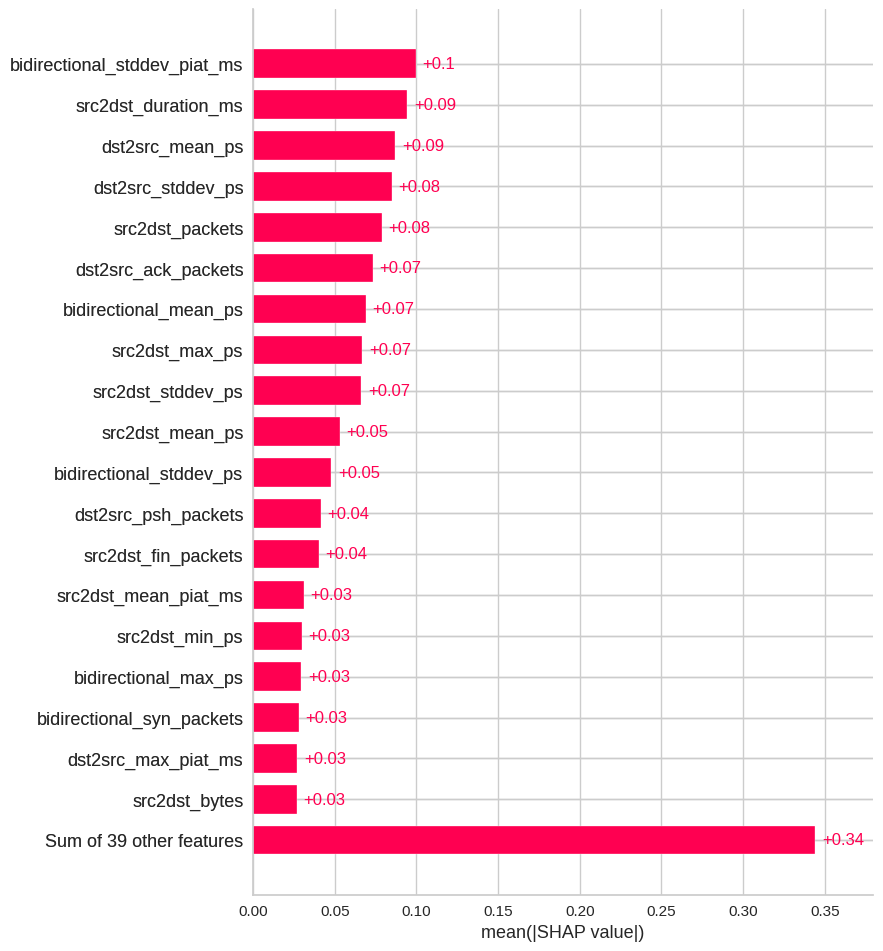

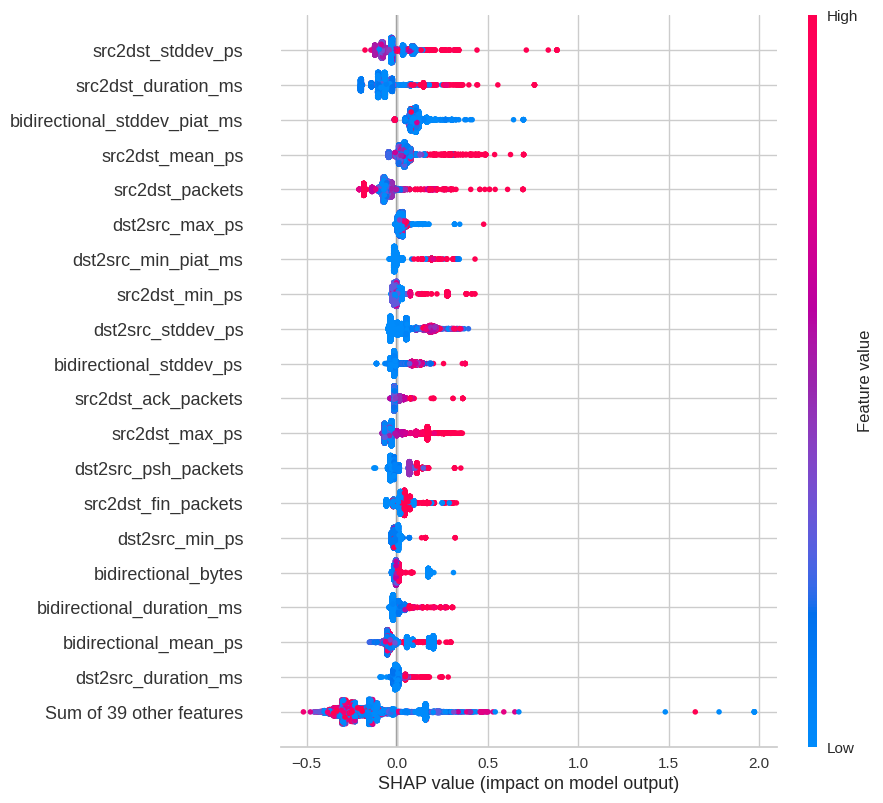

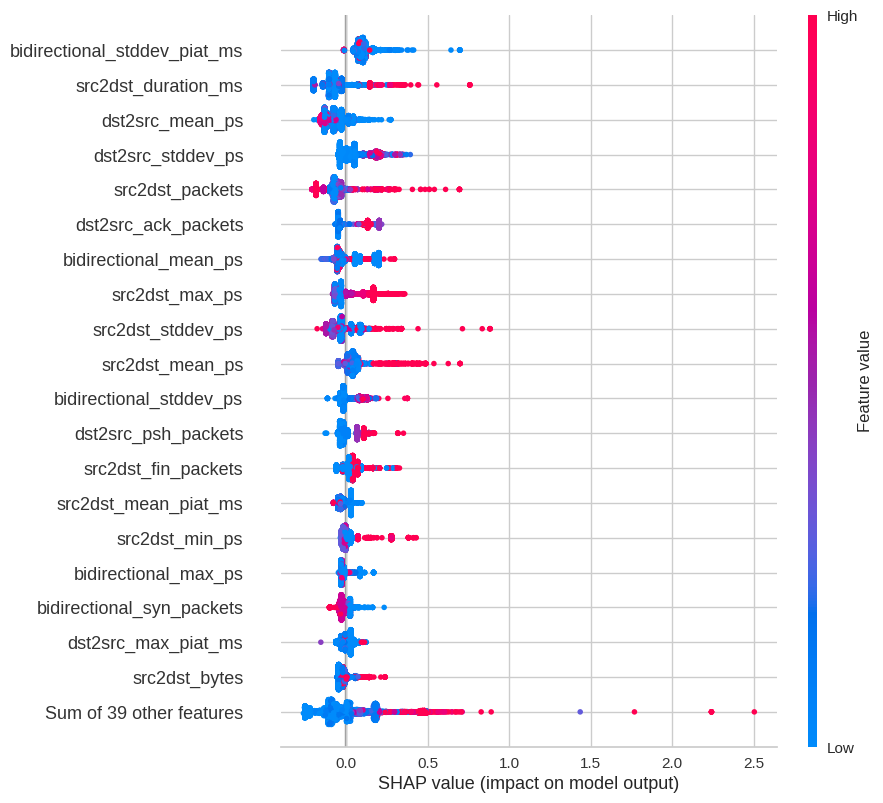

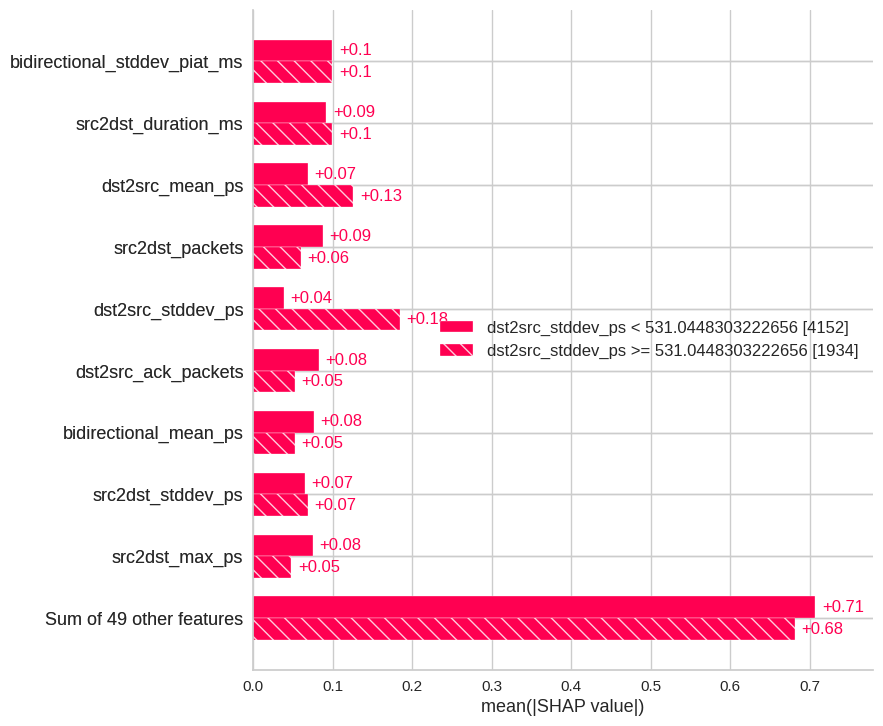

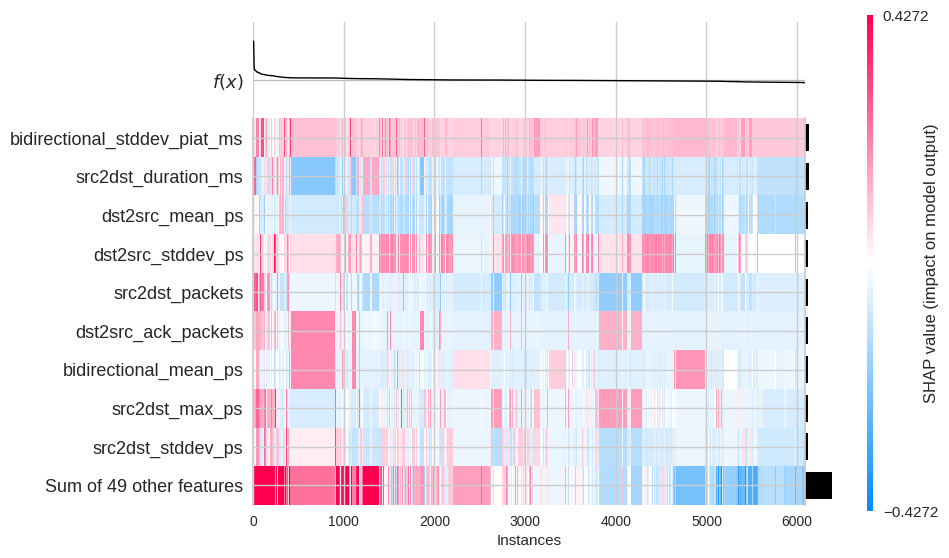

In [ ]:
make_plot(8)

## Infiltration shap

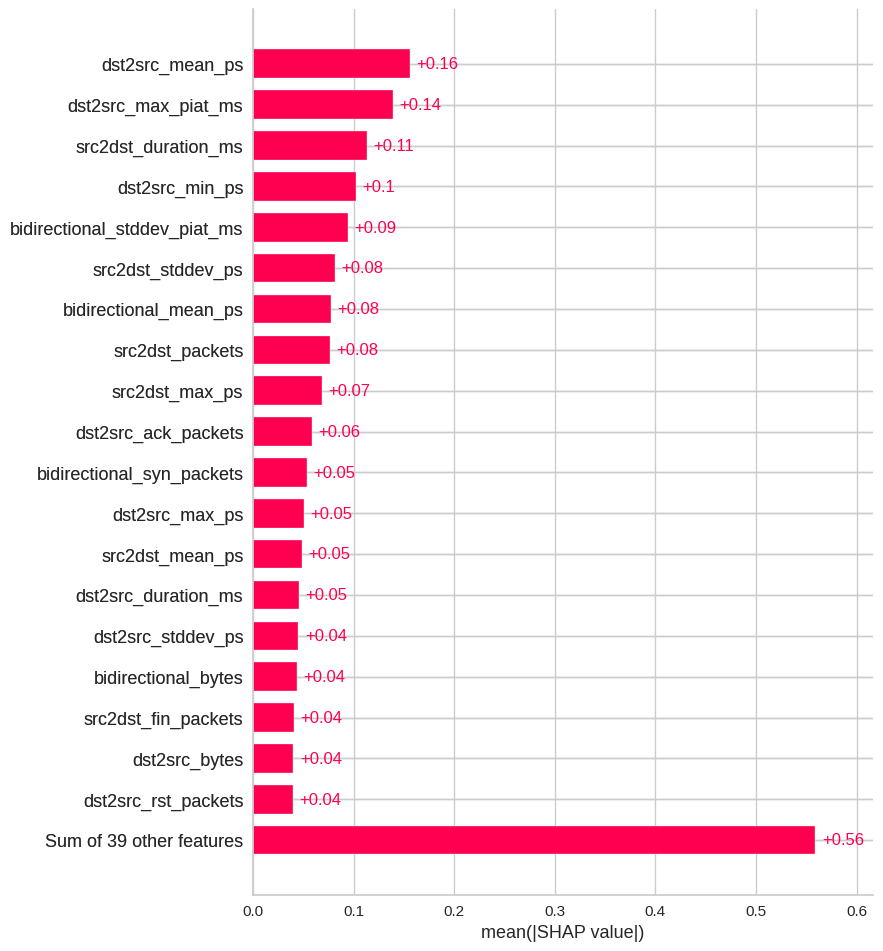

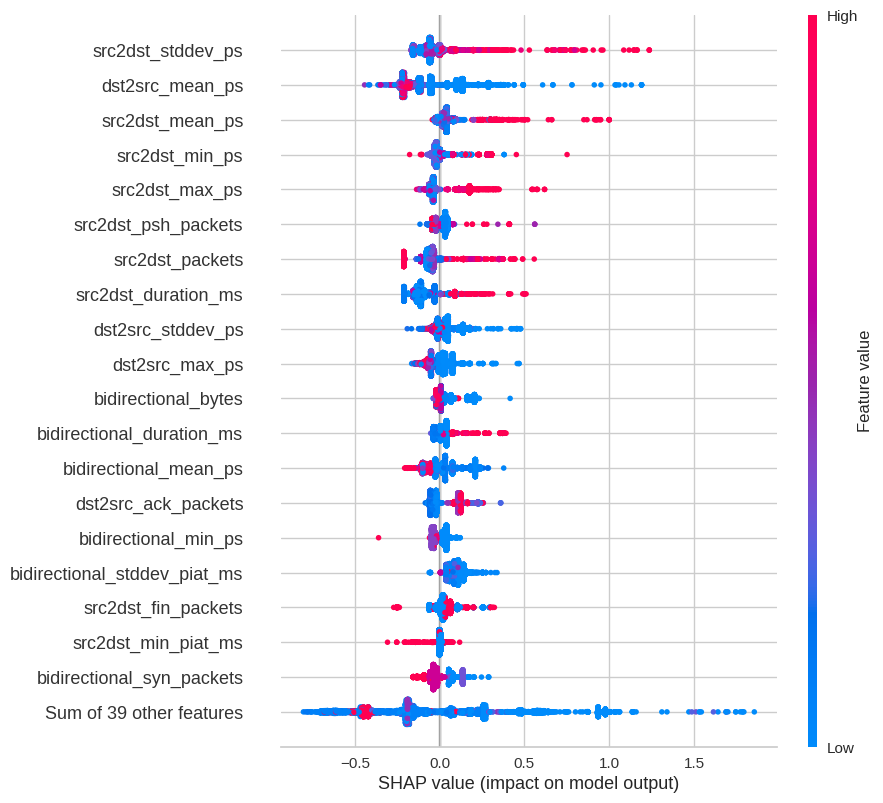

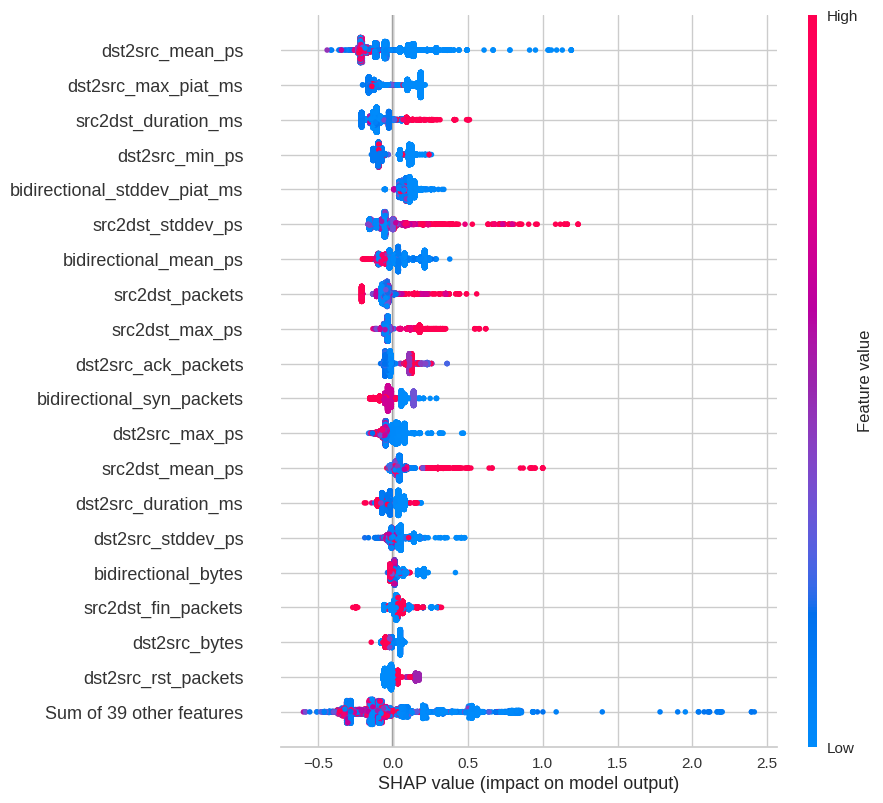

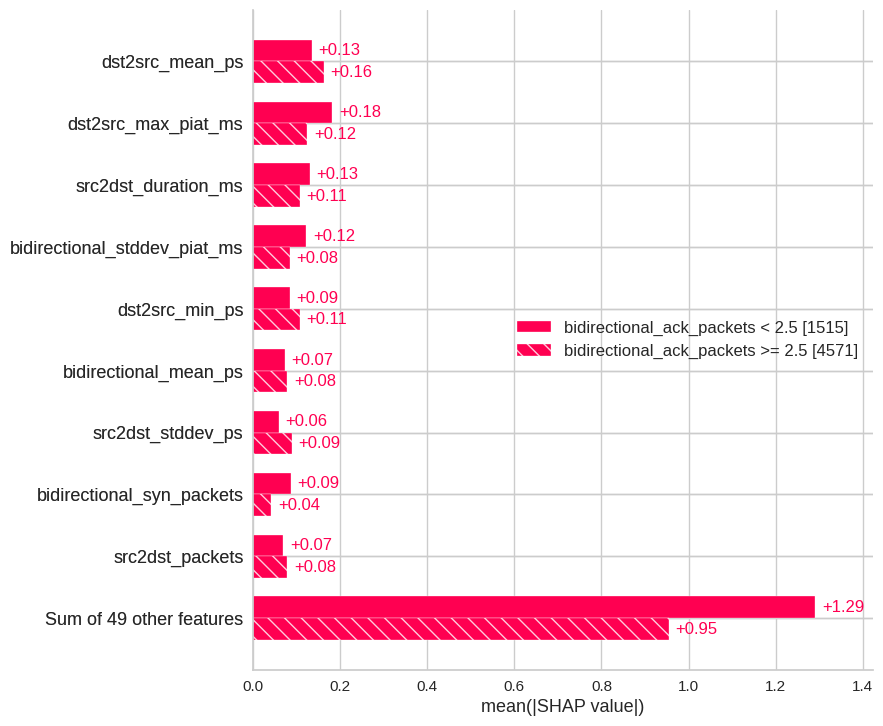

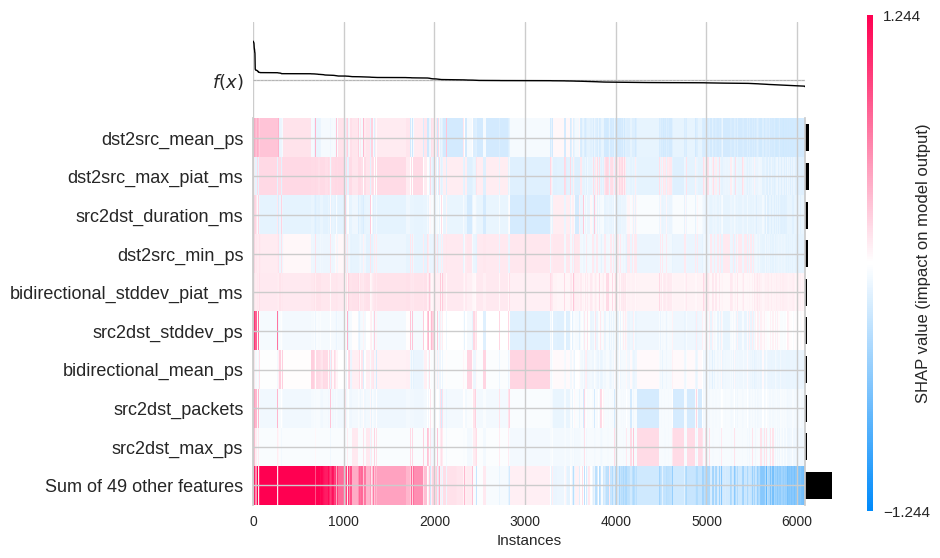

In [ ]:
make_plot(9)

## PortScan shap

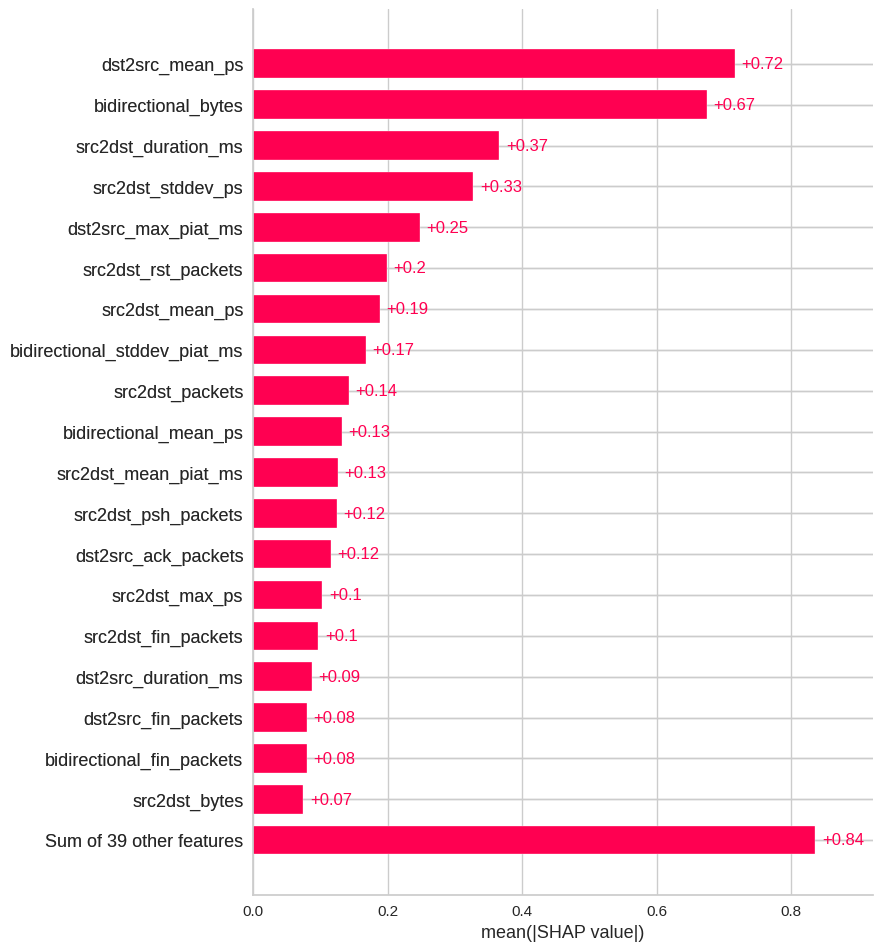

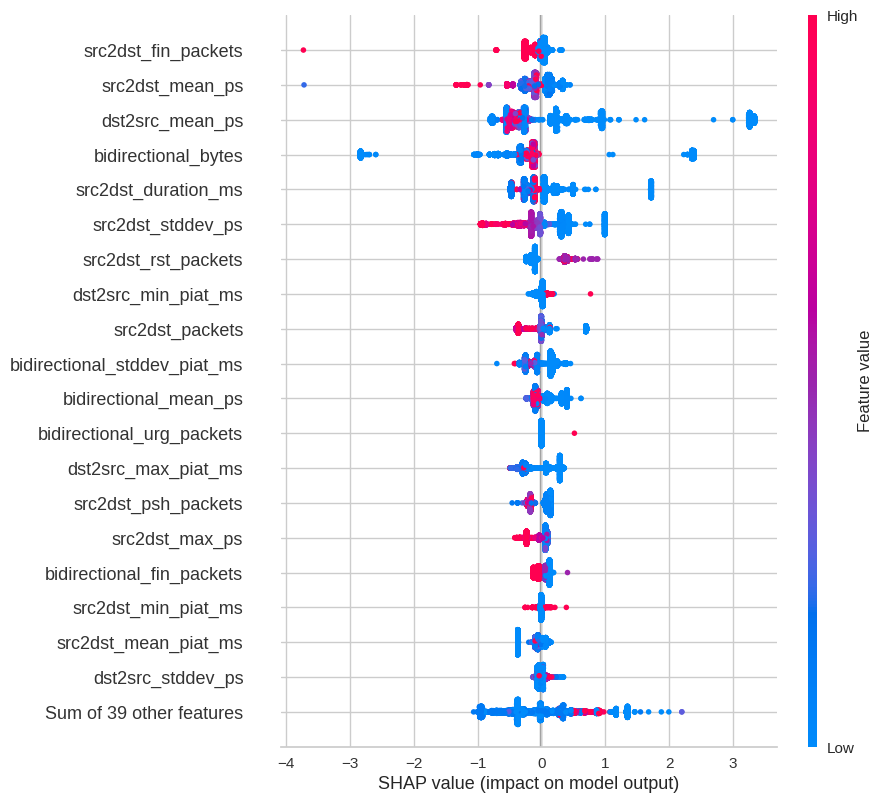

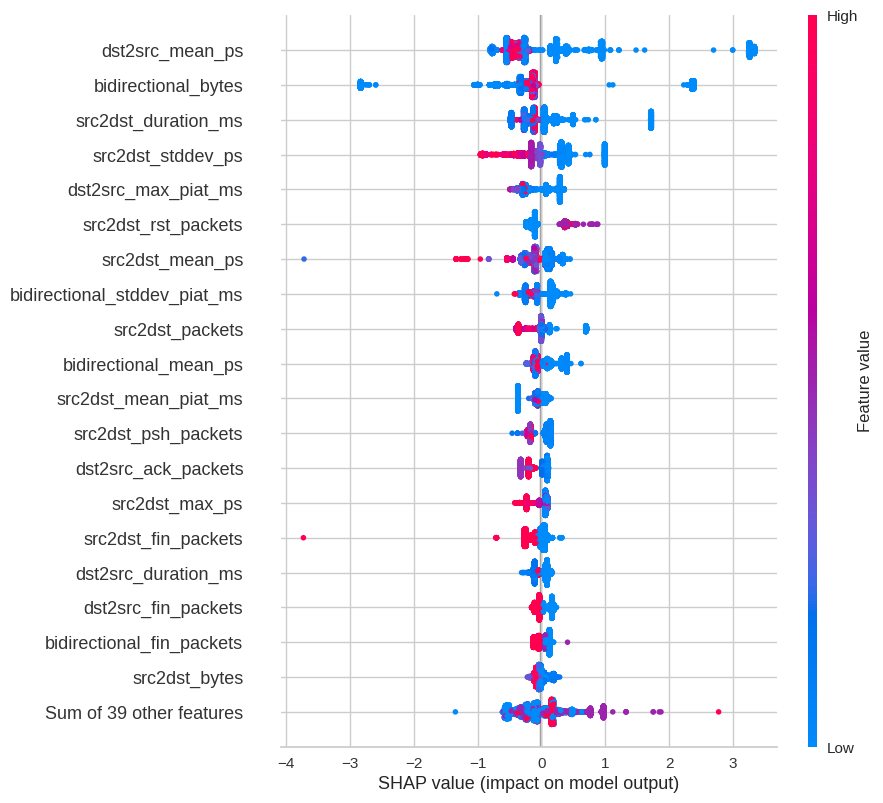

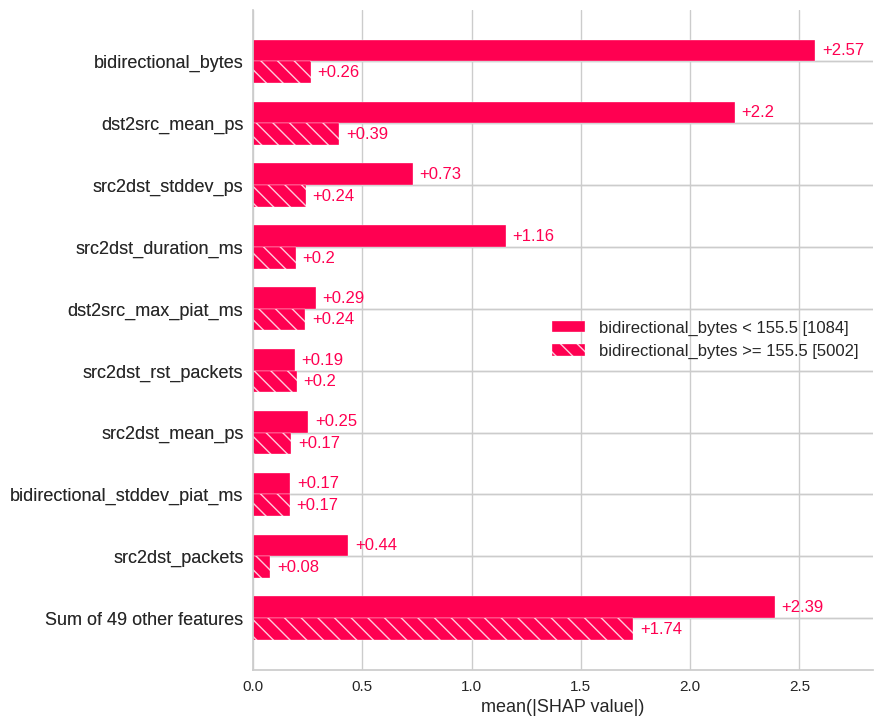

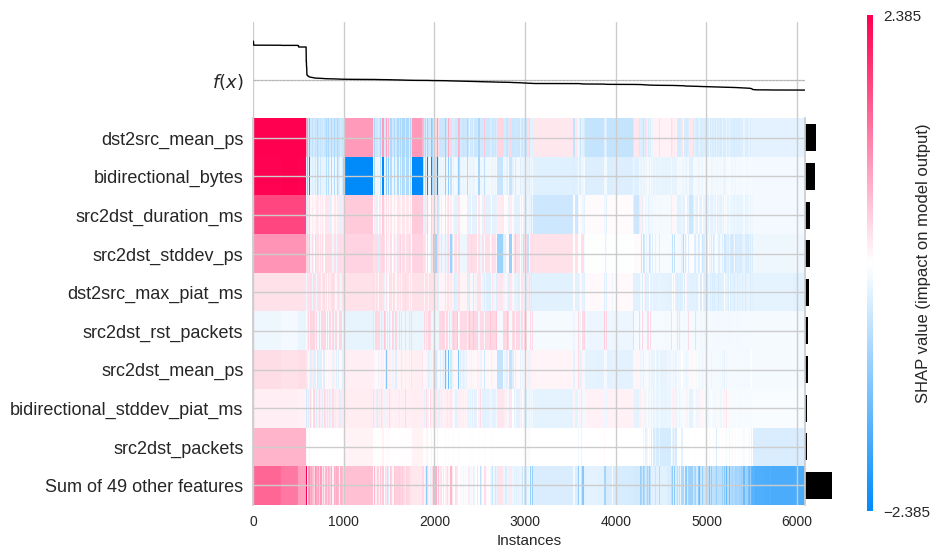

In [ ]:
make_plot(10)

## SSH-Patator shap

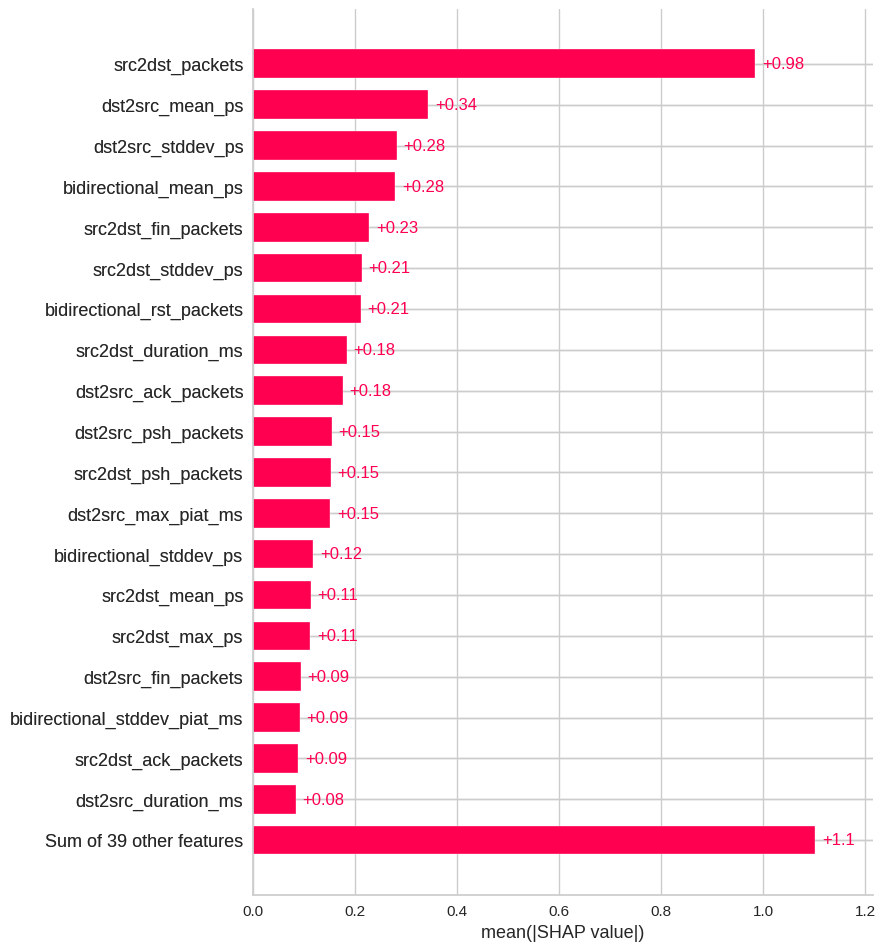

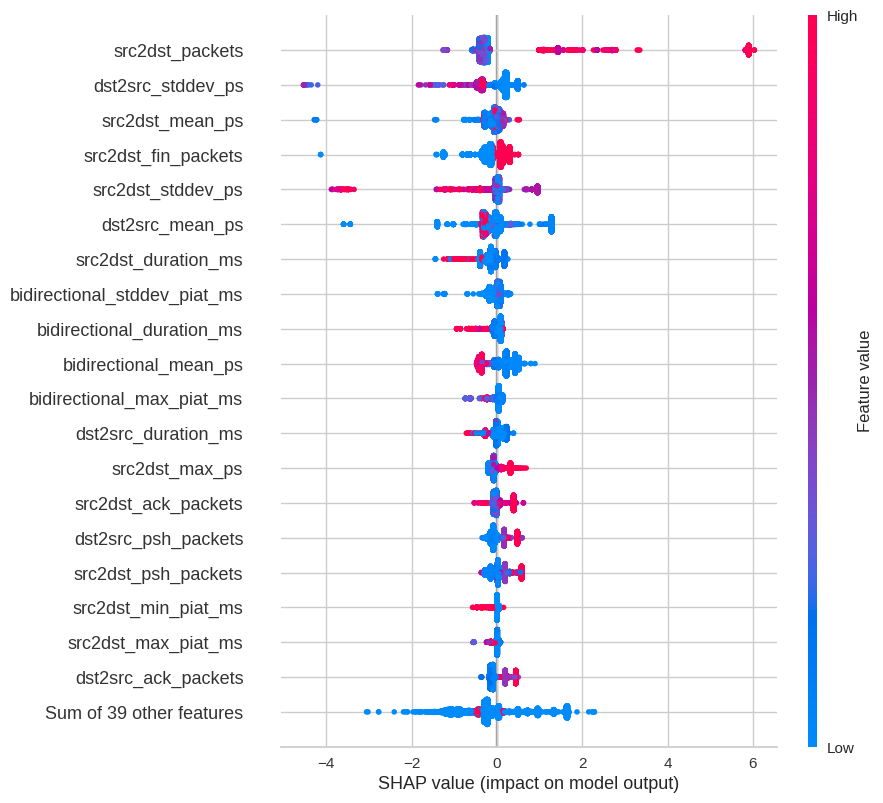

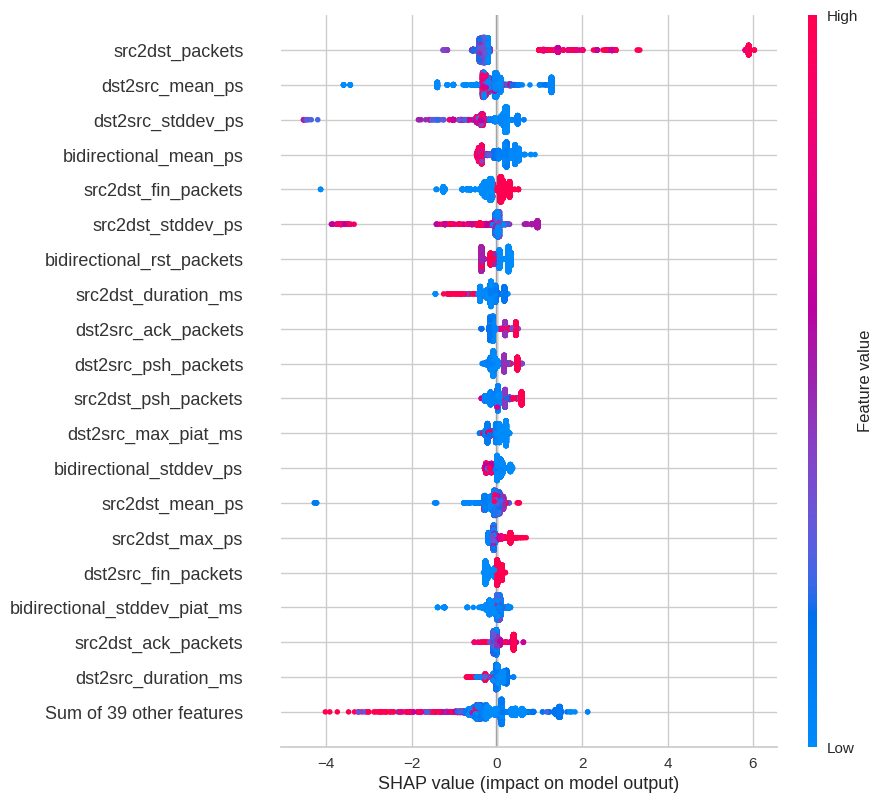

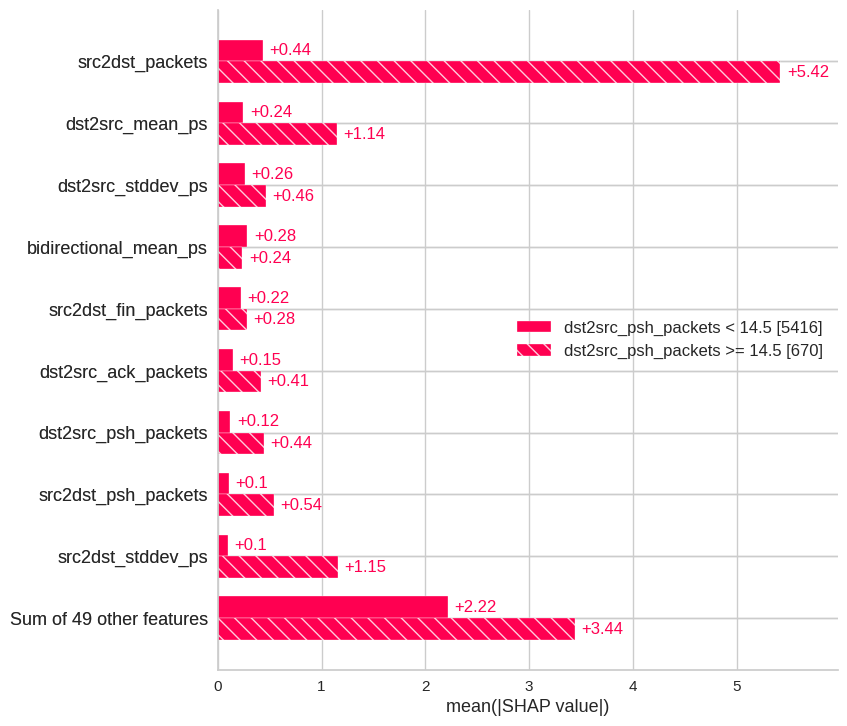

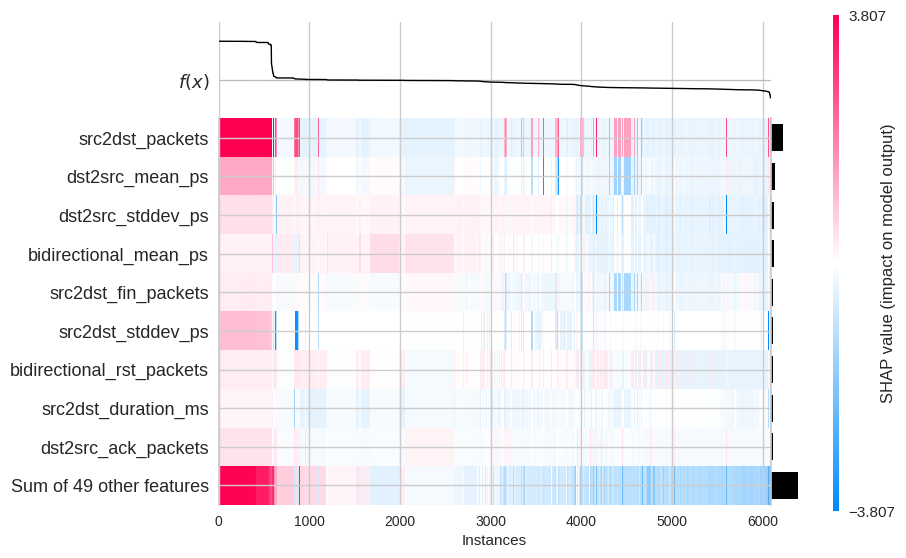

In [ ]:
make_plot(11)

## Web Attack - Brute Force shap

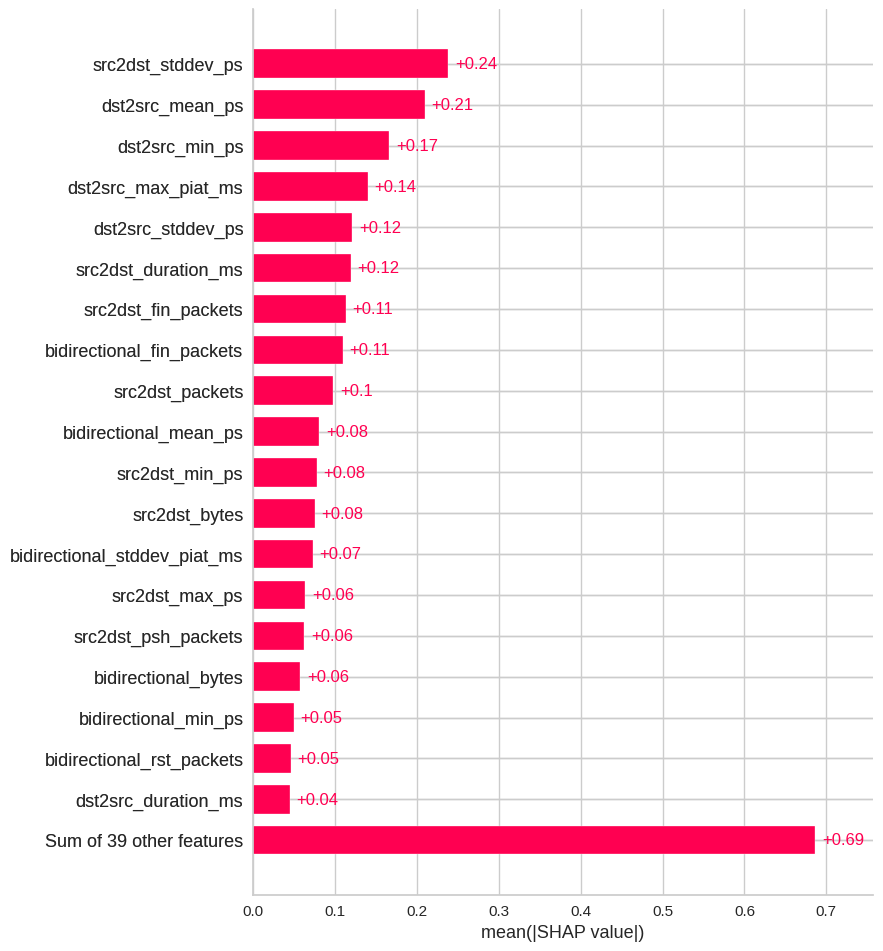

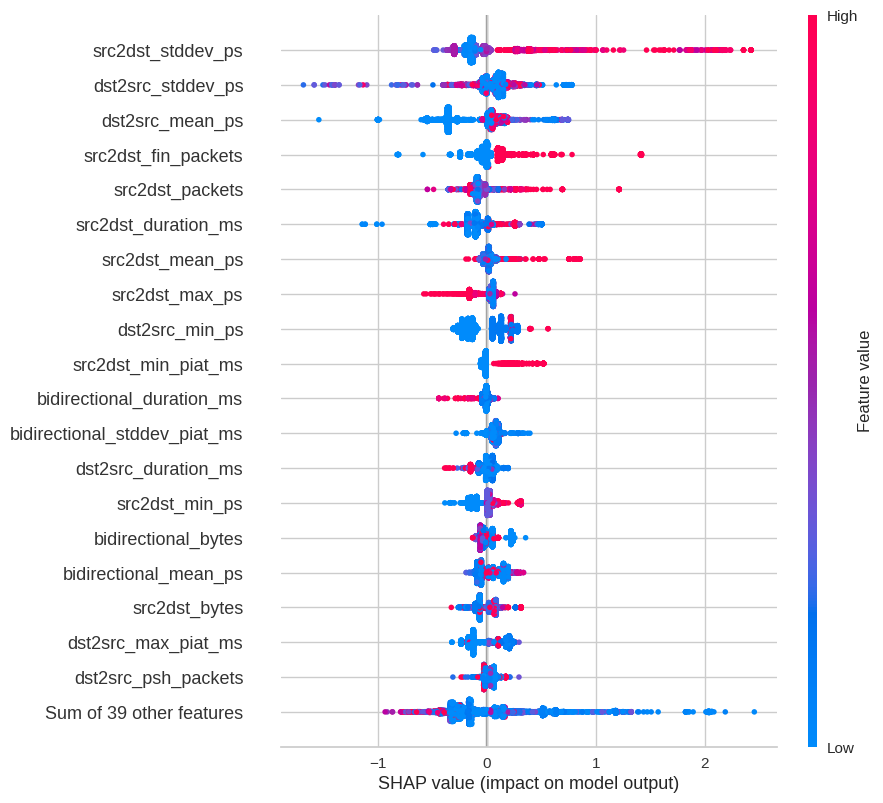

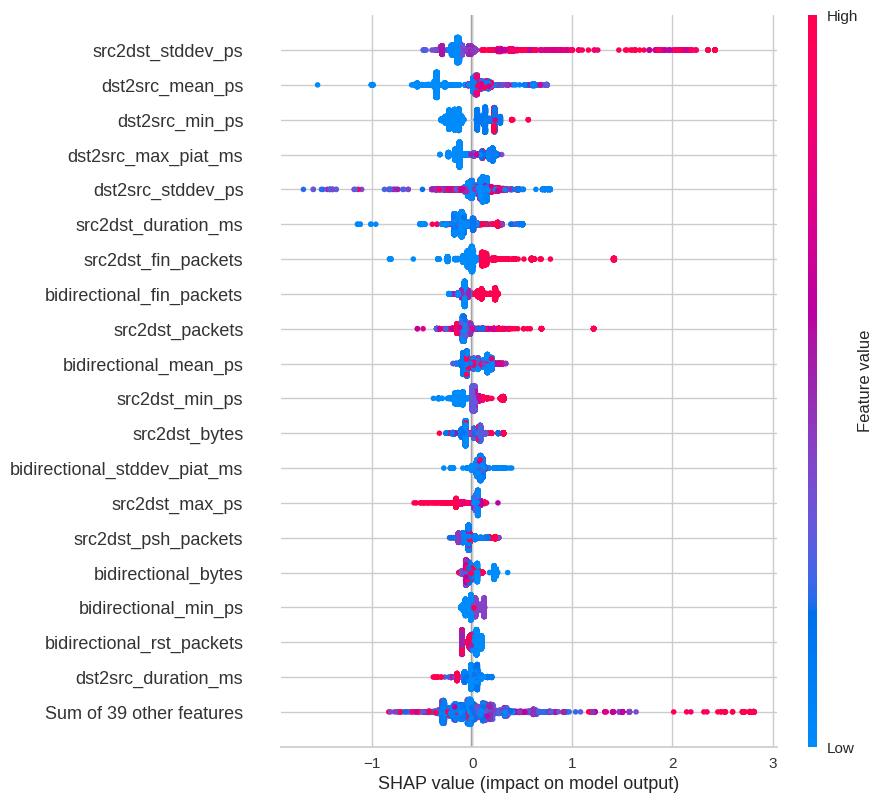

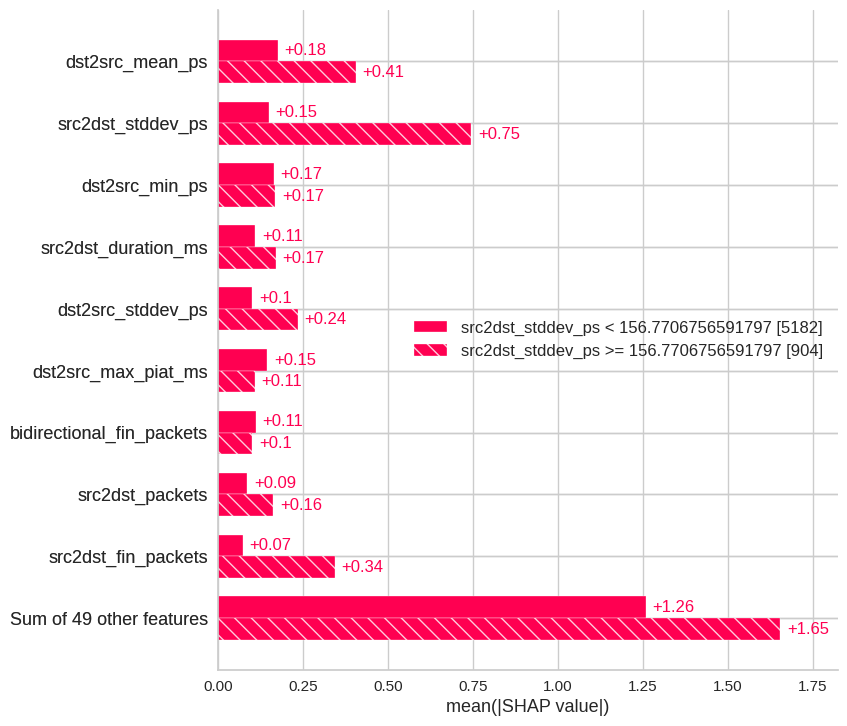

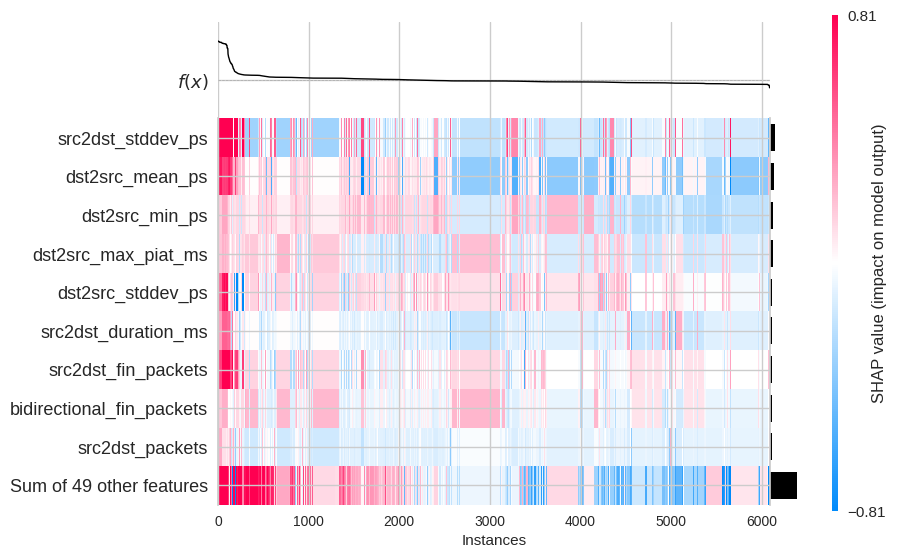

In [ ]:
make_plot(12)

## Web Attack - Sql Injection shap

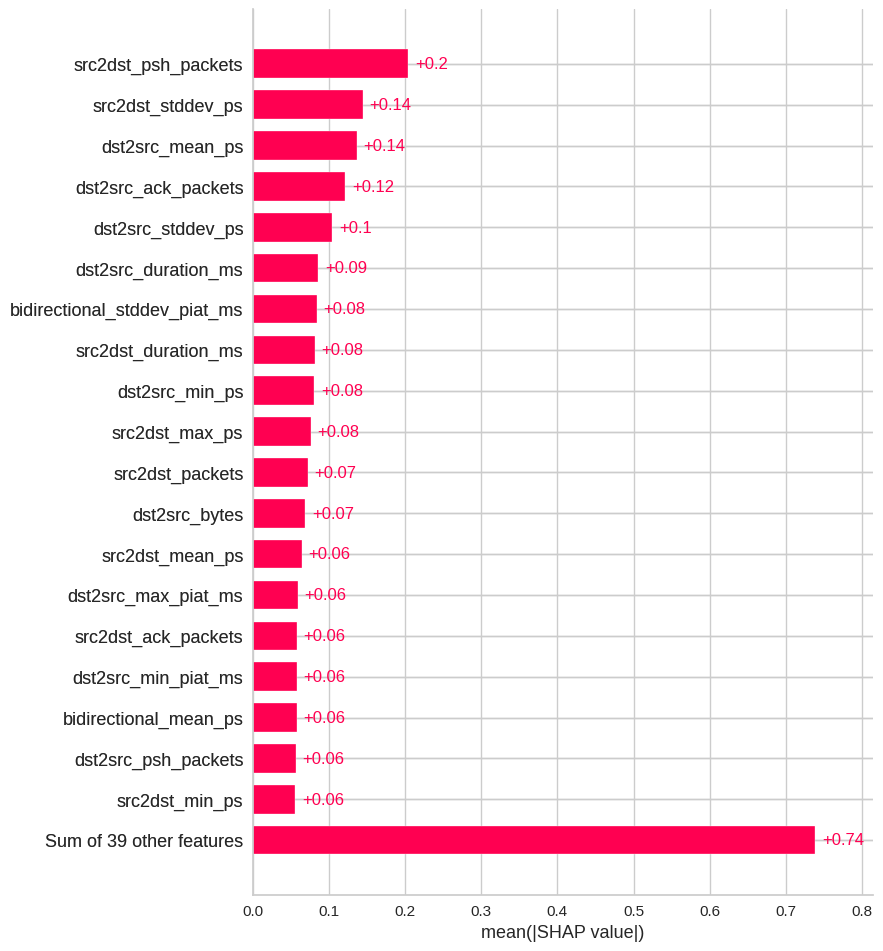

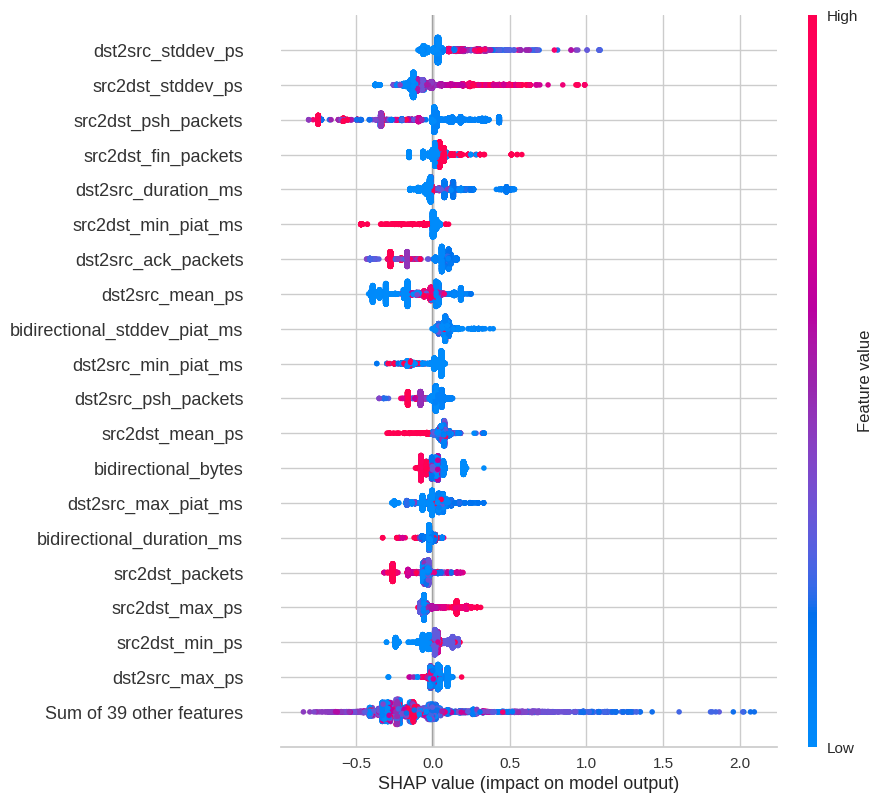

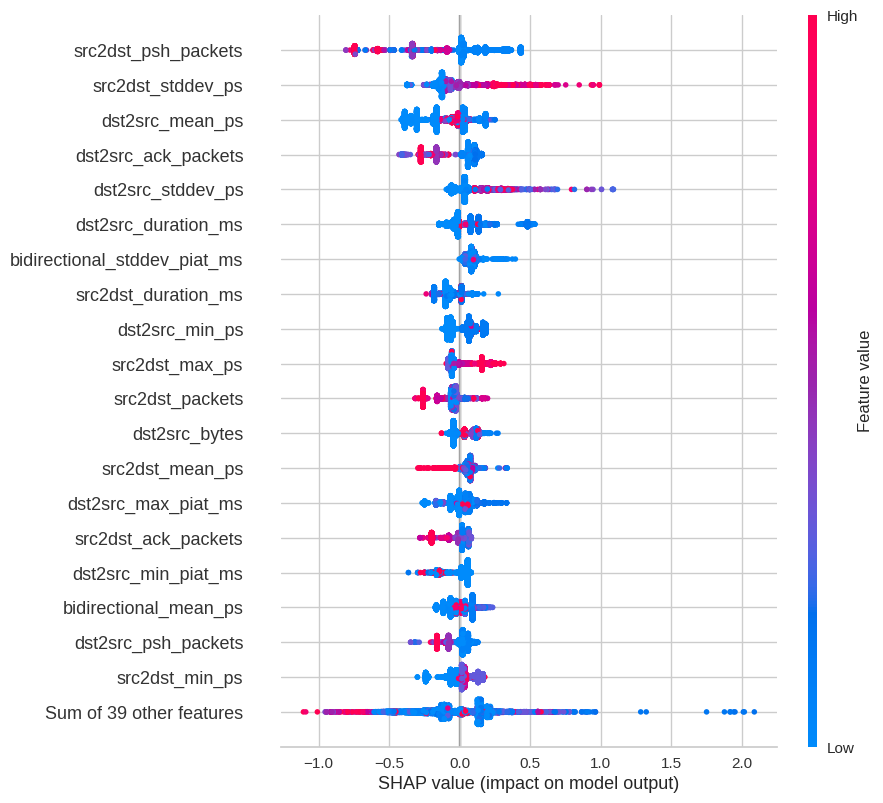

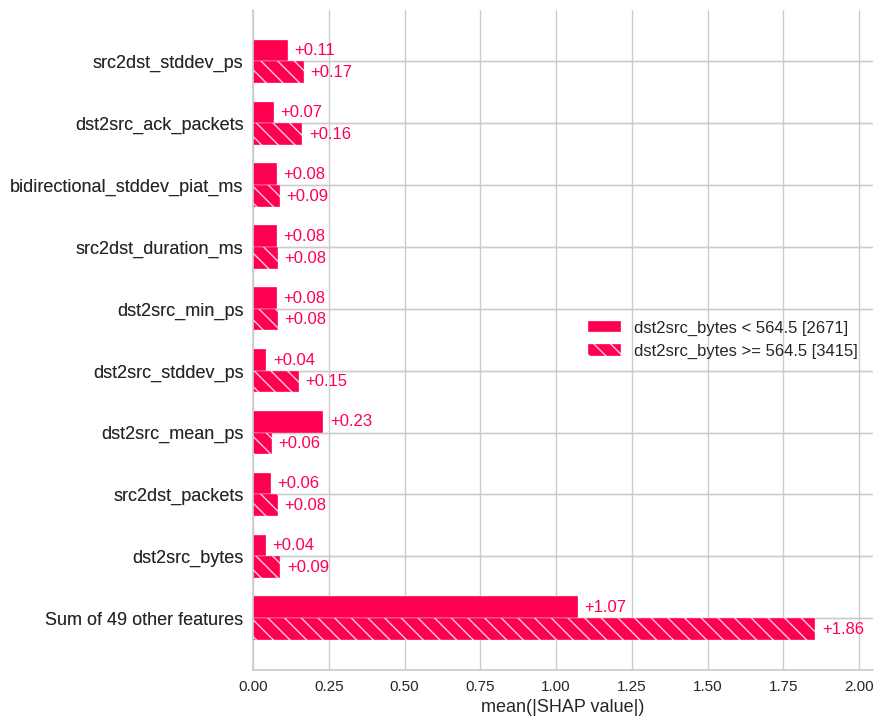

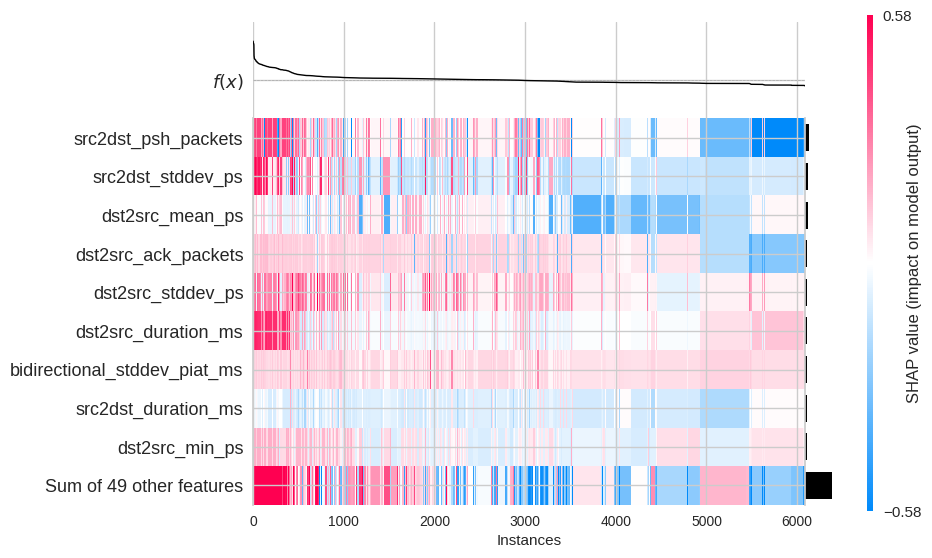

In [ ]:
make_plot(13)

## Web Attack - XSS shap

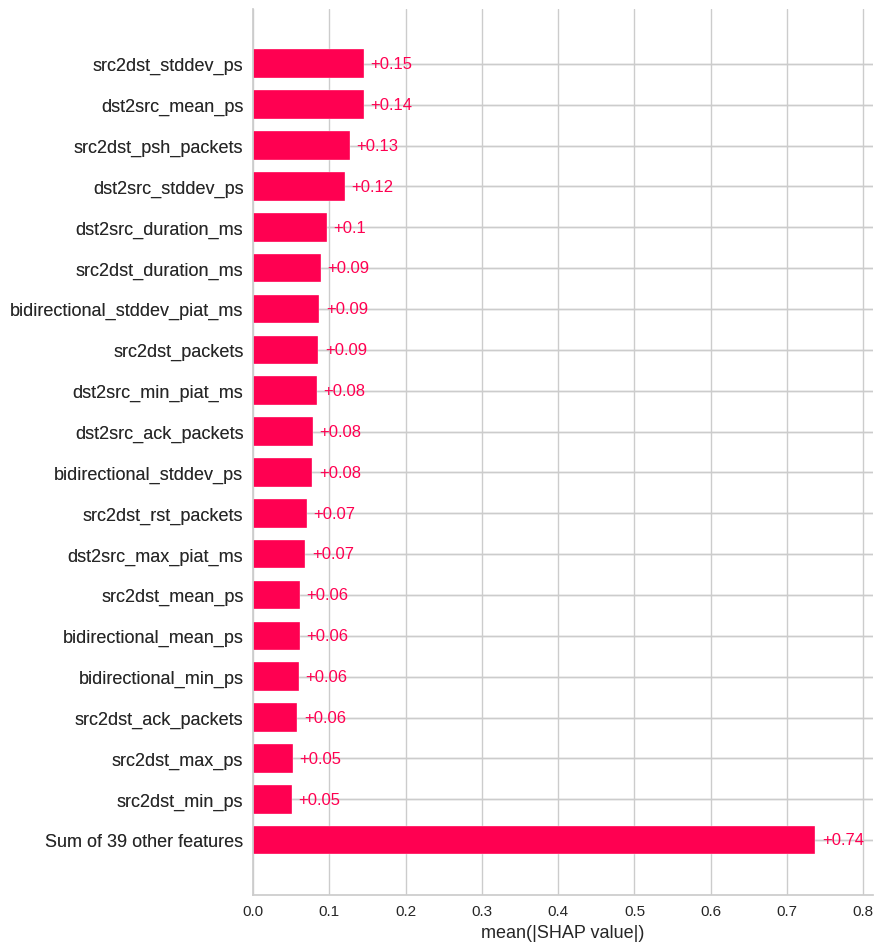

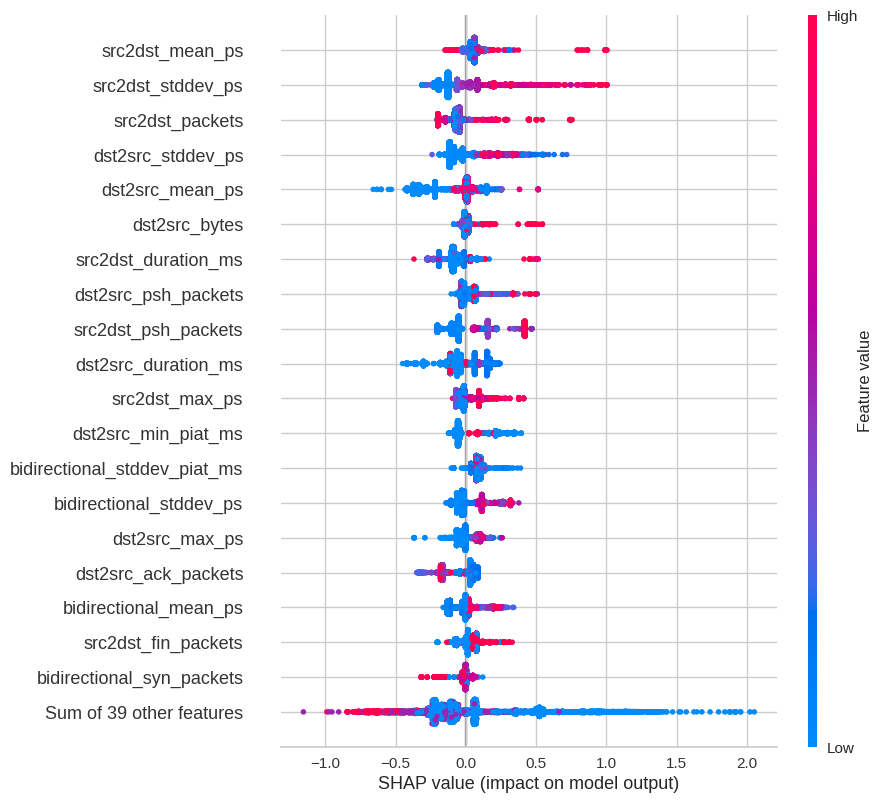

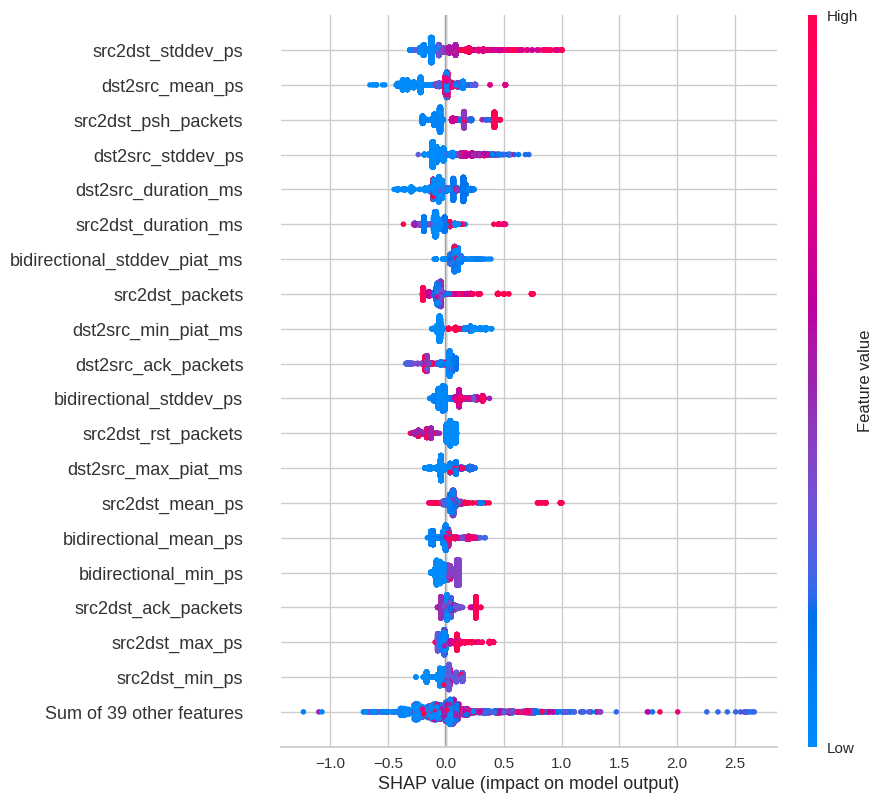

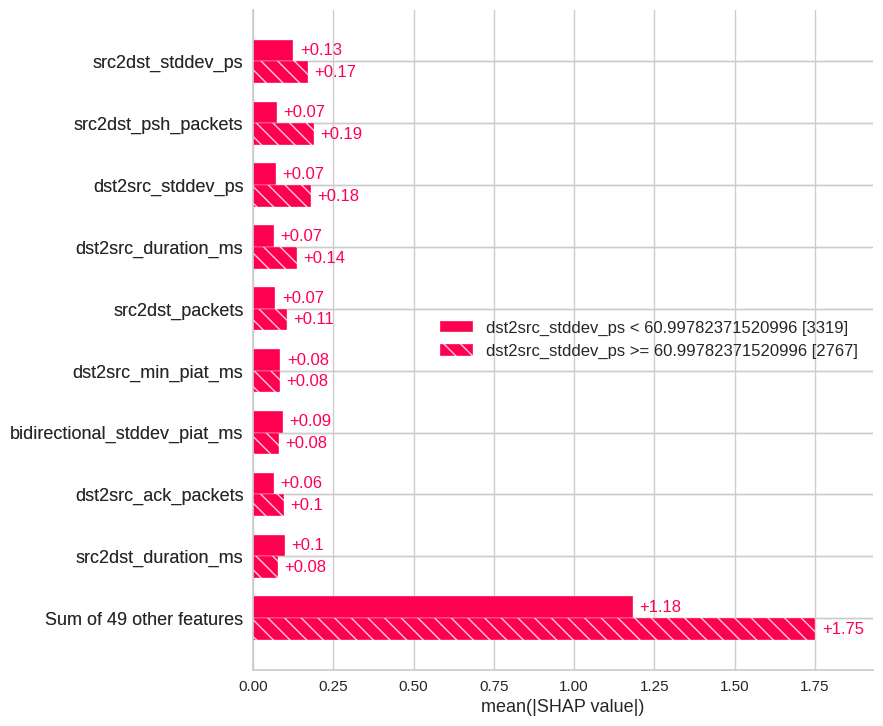

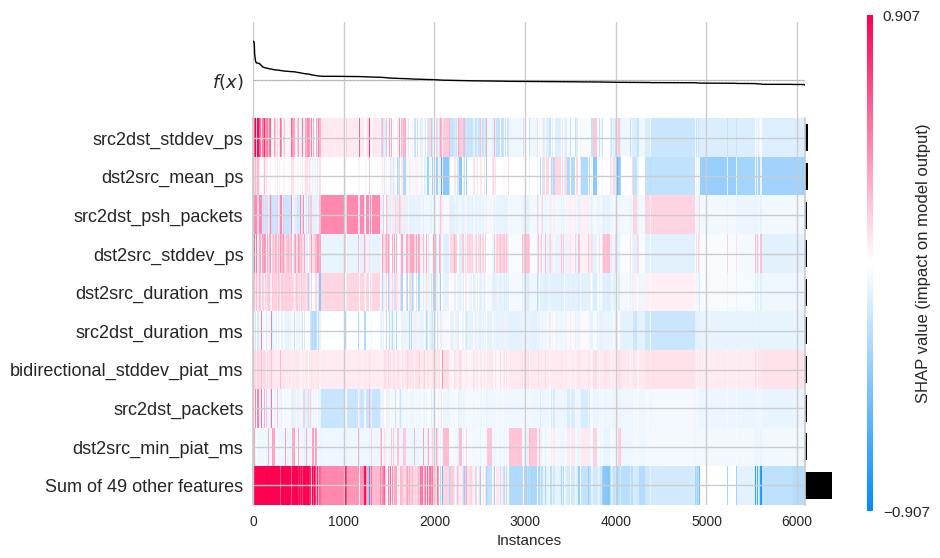

In [ ]:
make_plot(14)

## Overall importance

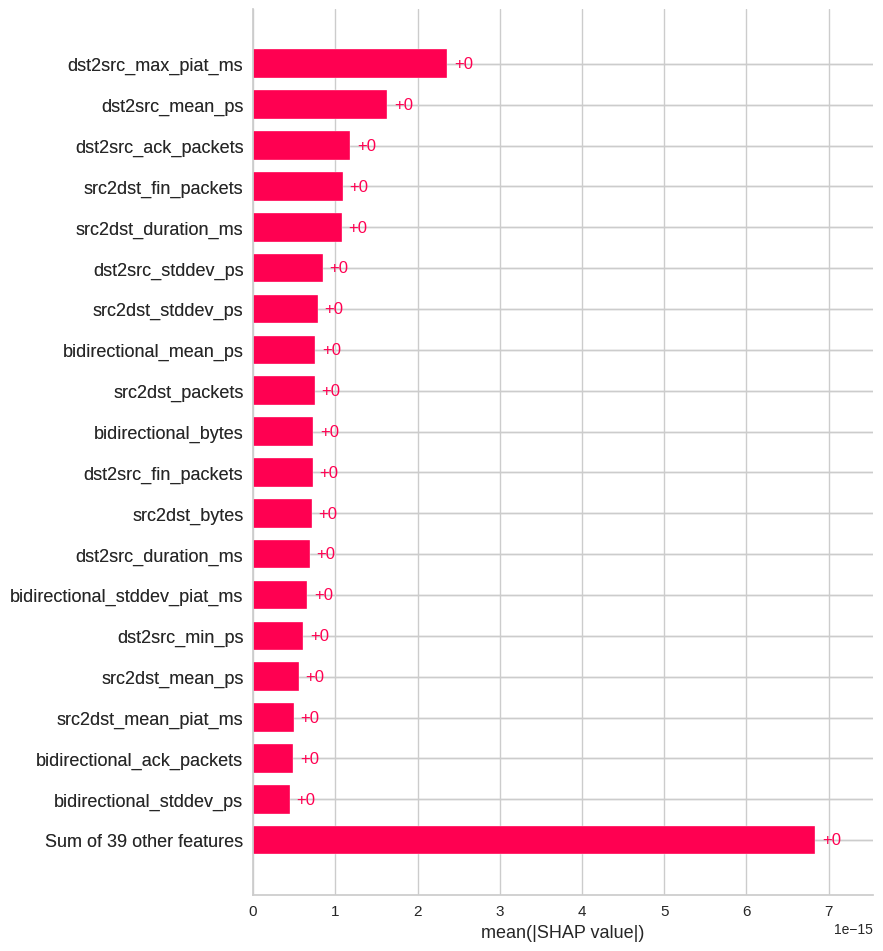

In [ ]:
exp = Explanation(sv.values.mean(2), 
                  sv.base_values.mean(1), 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
plt.show()

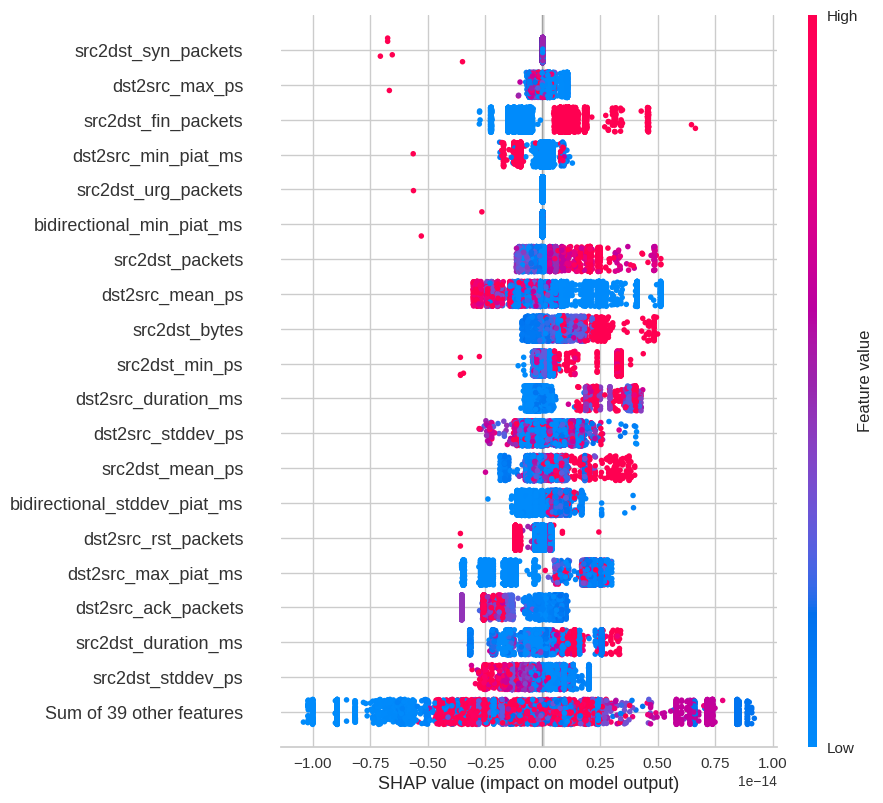

In [ ]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

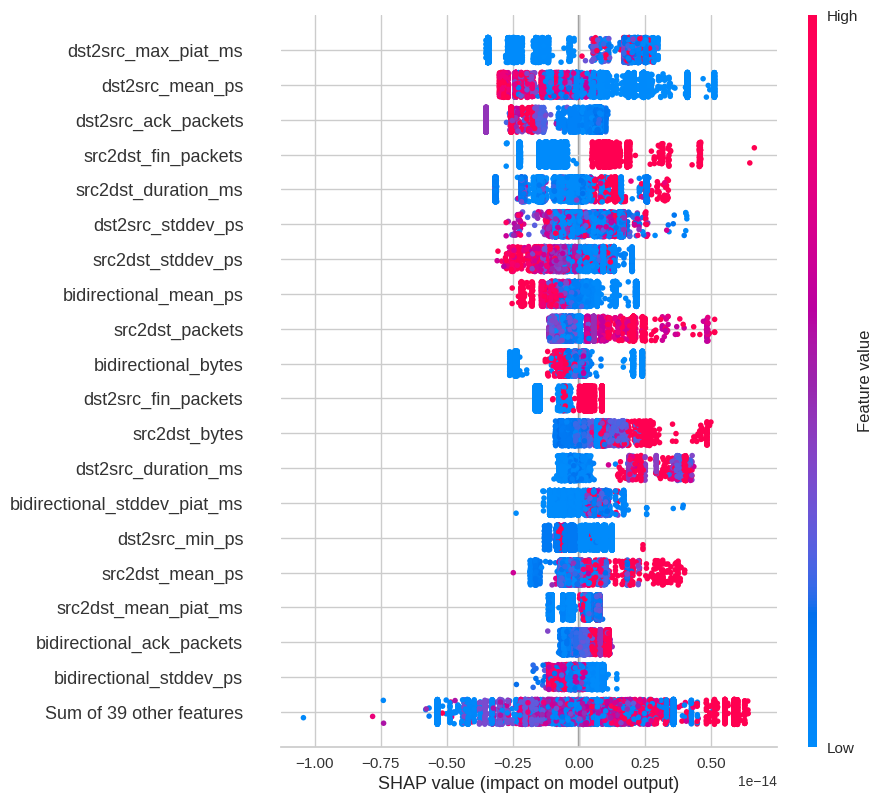

In [ ]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## Zero day test

In [ ]:
classes = sorted(pd.unique(ds['label']).tolist())

In [ ]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'Bot']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 0.3891156	total: 163ms	remaining: 6.34s
1:	learn: 0.2029882	total: 348ms	remaining: 6.62s
2:	learn: 0.1587570	total: 537ms	remaining: 6.62s
3:	learn: 0.1283621	total: 721ms	remaining: 6.49s
4:	learn: 0.0971643	total: 906ms	remaining: 6.34s
5:	learn: 0.0820559	total: 1.09s	remaining: 6.19s
6:	learn: 0.0730096	total: 1.28s	remaining: 6.03s
7:	learn: 0.0659766	total: 1.47s	remaining: 5.88s
8:	learn: 0.0590206	total: 1.67s	remaining: 5.74s
9:	learn: 0.0548614	total: 1.89s	remaining: 5.66s
10:	learn: 0.0521803	total: 2.07s	remaining: 5.46s
11:	learn: 0.0505510	total: 2.17s	remaining: 5.06s
12:	learn: 0.0482355	total: 2.36s	remaining: 4.9s
13:	learn: 0.0468793	total: 2.56s	remaining: 4.75s
14:	learn: 0.0440203	total: 2.76s	remaining: 4.6s
15:	learn: 0.0430553	total: 2.95s	remaining: 4.43s
16:	learn: 0.0404484	total: 3.14s	remaining: 4.25s
17:	learn: 0.0395570	total: 3.33s	remaining: 4.07s
18:	learn: 0.0374963	total: 3.52s	remaining: 3.9s
19:	learn: 0.0365211	total: 3.73s	remaining:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.996179,0.889619
1,PRECISION,0.996248,0.836438
2,RECALL,0.996179,0.889619
3,F1 SCORE,0.996171,0.855535


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


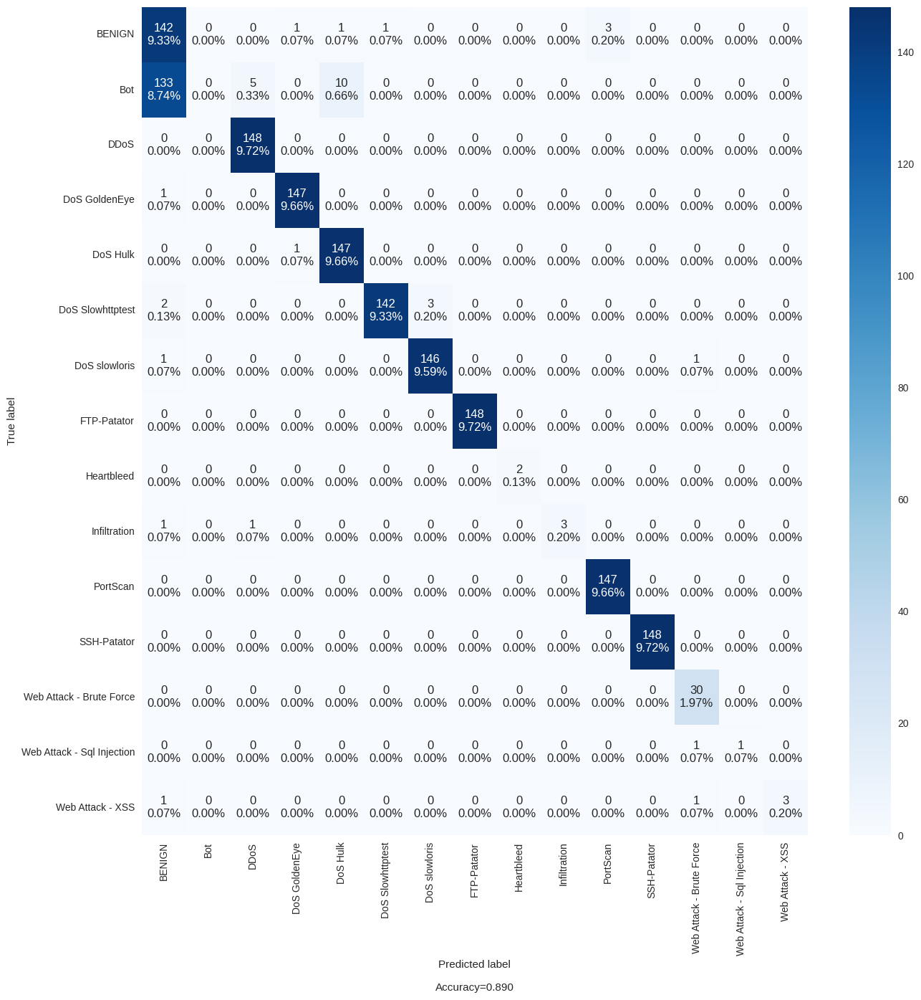

In [ ]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [ ]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'DDoS']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 0.3181032	total: 162ms	remaining: 6.3s
1:	learn: 0.1623503	total: 343ms	remaining: 6.52s
2:	learn: 0.1276388	total: 558ms	remaining: 6.88s
3:	learn: 0.1066415	total: 755ms	remaining: 6.79s
4:	learn: 0.0916533	total: 946ms	remaining: 6.62s
5:	learn: 0.0794262	total: 1.13s	remaining: 6.43s
6:	learn: 0.0721292	total: 1.32s	remaining: 6.23s
7:	learn: 0.0648452	total: 1.51s	remaining: 6.06s
8:	learn: 0.0623302	total: 1.53s	remaining: 5.27s
9:	learn: 0.0580707	total: 1.75s	remaining: 5.27s
10:	learn: 0.0549321	total: 1.95s	remaining: 5.15s
11:	learn: 0.0540585	total: 1.97s	remaining: 4.59s
12:	learn: 0.0521622	total: 2.16s	remaining: 4.48s
13:	learn: 0.0507303	total: 2.21s	remaining: 4.1s
14:	learn: 0.0485565	total: 2.4s	remaining: 4s
15:	learn: 0.0467322	total: 2.6s	remaining: 3.89s
16:	learn: 0.0435124	total: 2.79s	remaining: 3.77s
17:	learn: 0.0433601	total: 2.98s	remaining: 3.64s
18:	learn: 0.0431660	total: 3.16s	remaining: 3.5s
19:	learn: 0.0406233	total: 3.35s	remaining: 3.35

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.994723,0.891590
1,PRECISION,0.994766,0.842912
2,RECALL,0.994723,0.891590
3,F1 SCORE,0.994705,0.858920


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


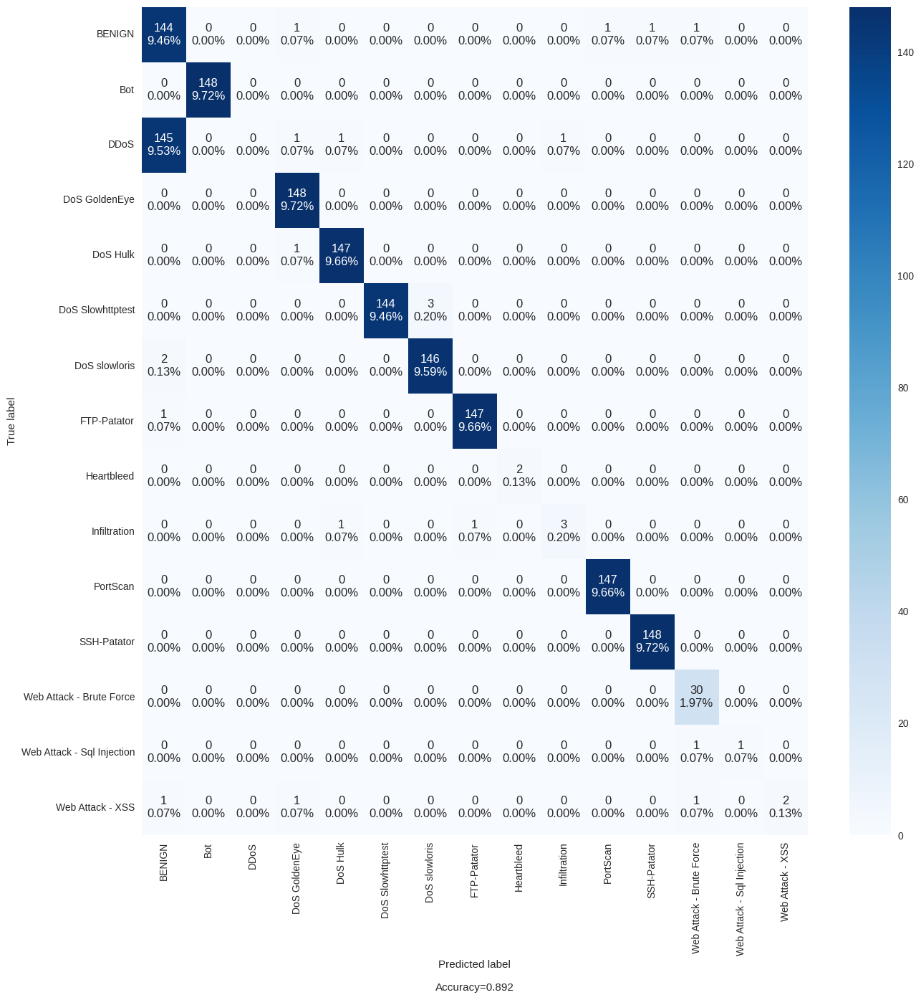

In [ ]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [ ]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'DoS GoldenEye']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 0.3151449	total: 171ms	remaining: 6.67s
1:	learn: 0.3455632	total: 368ms	remaining: 6.98s
2:	learn: 0.1911556	total: 556ms	remaining: 6.86s
3:	learn: 0.1381739	total: 747ms	remaining: 6.72s
4:	learn: 0.1127168	total: 932ms	remaining: 6.53s
5:	learn: 0.0929751	total: 1.13s	remaining: 6.38s
6:	learn: 0.0791601	total: 1.32s	remaining: 6.21s
7:	learn: 0.0693252	total: 1.52s	remaining: 6.08s
8:	learn: 0.0621499	total: 1.72s	remaining: 5.91s
9:	learn: 0.0590063	total: 1.81s	remaining: 5.44s
10:	learn: 0.0556132	total: 1.92s	remaining: 5.05s
11:	learn: 0.0500920	total: 2.13s	remaining: 4.97s
12:	learn: 0.0490097	total: 2.32s	remaining: 4.82s
13:	learn: 0.0459979	total: 2.51s	remaining: 4.65s
14:	learn: 0.0425684	total: 2.69s	remaining: 4.49s
15:	learn: 0.0413231	total: 2.93s	remaining: 4.4s
16:	learn: 0.0395974	total: 3.12s	remaining: 4.22s
17:	learn: 0.0381592	total: 3.32s	remaining: 4.05s
18:	learn: 0.0356226	total: 3.51s	remaining: 3.88s
19:	learn: 0.0335023	total: 3.7s	remaining

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.996543,0.893561
1,PRECISION,0.996623,0.849807
2,RECALL,0.996543,0.893561
3,F1 SCORE,0.996544,0.867536


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


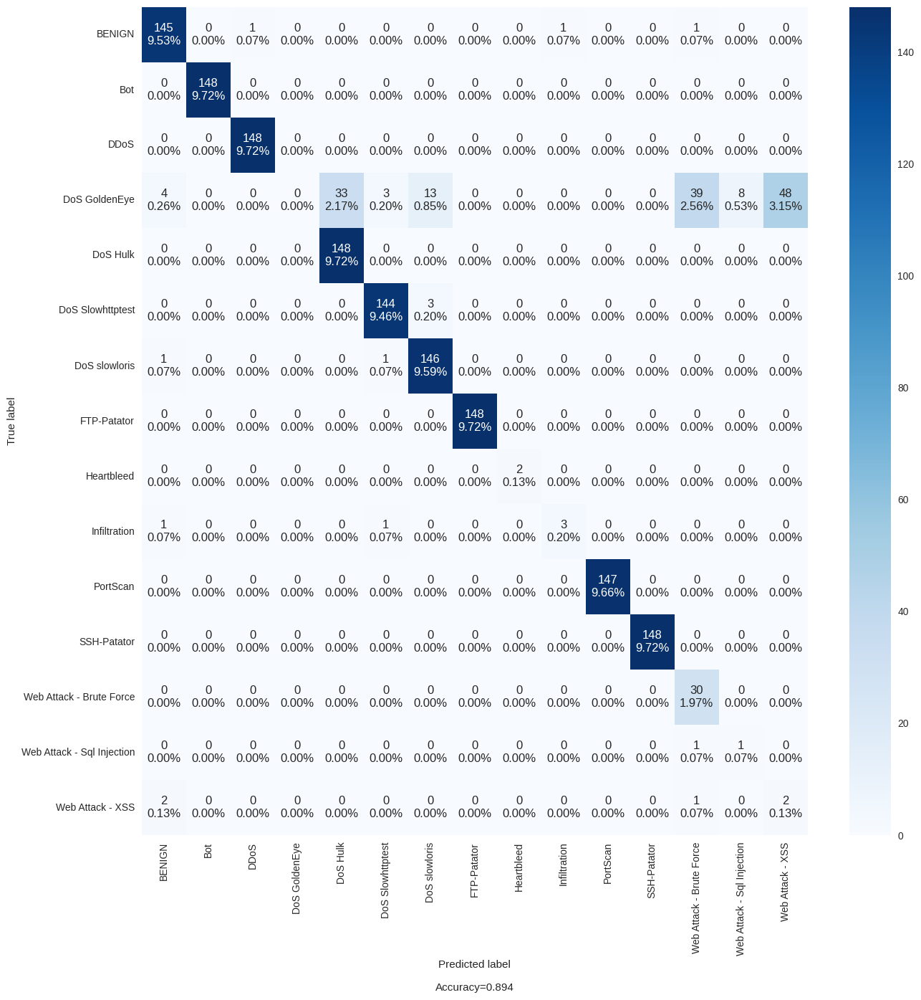

In [ ]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [ ]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'DoS Hulk']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 0.4145688	total: 159ms	remaining: 6.18s
1:	learn: 0.2687215	total: 340ms	remaining: 6.46s
2:	learn: 0.1631432	total: 532ms	remaining: 6.56s
3:	learn: 0.1285103	total: 722ms	remaining: 6.5s
4:	learn: 0.1088324	total: 916ms	remaining: 6.41s
5:	learn: 0.0992639	total: 1.11s	remaining: 6.28s
6:	learn: 0.0829754	total: 1.3s	remaining: 6.13s
7:	learn: 0.0727686	total: 1.49s	remaining: 5.96s
8:	learn: 0.0659360	total: 1.68s	remaining: 5.79s
9:	learn: 0.0602013	total: 1.88s	remaining: 5.64s
10:	learn: 0.0565188	total: 2.07s	remaining: 5.45s
11:	learn: 0.0526945	total: 2.26s	remaining: 5.27s
12:	learn: 0.0512698	total: 2.45s	remaining: 5.1s
13:	learn: 0.0497692	total: 2.64s	remaining: 4.91s
14:	learn: 0.0465201	total: 2.87s	remaining: 4.78s
15:	learn: 0.0432955	total: 3.08s	remaining: 4.62s
16:	learn: 0.0430066	total: 3.3s	remaining: 4.46s
17:	learn: 0.0421738	total: 3.49s	remaining: 4.27s
18:	learn: 0.0416231	total: 3.69s	remaining: 4.07s
19:	learn: 0.0405081	total: 3.88s	remaining: 

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.995997,0.890276
1,PRECISION,0.996068,0.841563
2,RECALL,0.995997,0.890276
3,F1 SCORE,0.995993,0.857709


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


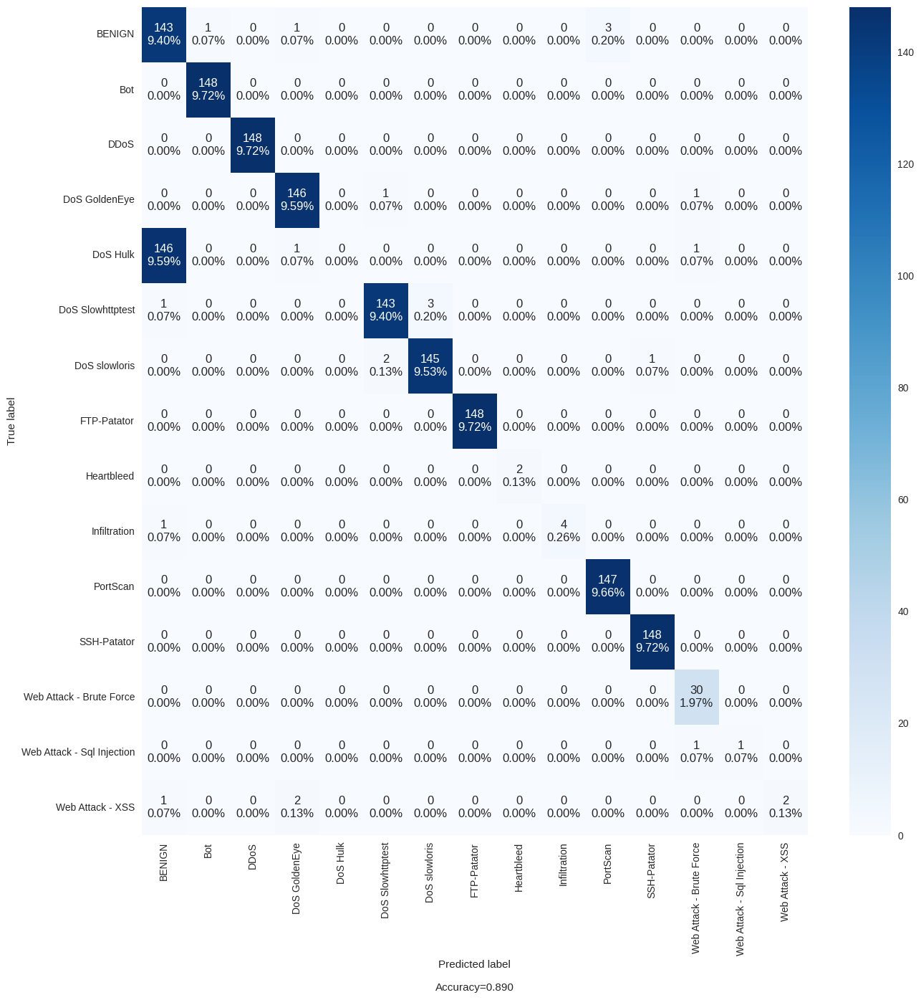

In [ ]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [ ]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'DoS Slowhttptest']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 0.2943321	total: 160ms	remaining: 6.26s
1:	learn: 0.2082069	total: 343ms	remaining: 6.52s
2:	learn: 0.1447788	total: 535ms	remaining: 6.6s
3:	learn: 0.1081778	total: 720ms	remaining: 6.48s
4:	learn: 0.0897290	total: 912ms	remaining: 6.39s
5:	learn: 0.0747680	total: 1.1s	remaining: 6.24s
6:	learn: 0.0624601	total: 1.29s	remaining: 6.08s
7:	learn: 0.0537251	total: 1.47s	remaining: 5.89s
8:	learn: 0.0454814	total: 1.66s	remaining: 5.72s
9:	learn: 0.0413178	total: 1.85s	remaining: 5.56s
10:	learn: 0.0378585	total: 2.04s	remaining: 5.38s
11:	learn: 0.0341748	total: 2.23s	remaining: 5.19s
12:	learn: 0.0311331	total: 2.42s	remaining: 5.04s
13:	learn: 0.0291214	total: 2.65s	remaining: 4.91s
14:	learn: 0.0273233	total: 2.84s	remaining: 4.73s
15:	learn: 0.0258790	total: 3.02s	remaining: 4.53s
16:	learn: 0.0238562	total: 3.21s	remaining: 4.34s
17:	learn: 0.0229553	total: 3.4s	remaining: 4.16s
18:	learn: 0.0219183	total: 3.5s	remaining: 3.87s
19:	learn: 0.0198735	total: 3.69s	remaining: 

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.999090,0.893561
1,PRECISION,0.999089,0.832184
2,RECALL,0.999090,0.893561
3,F1 SCORE,0.999084,0.855664


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


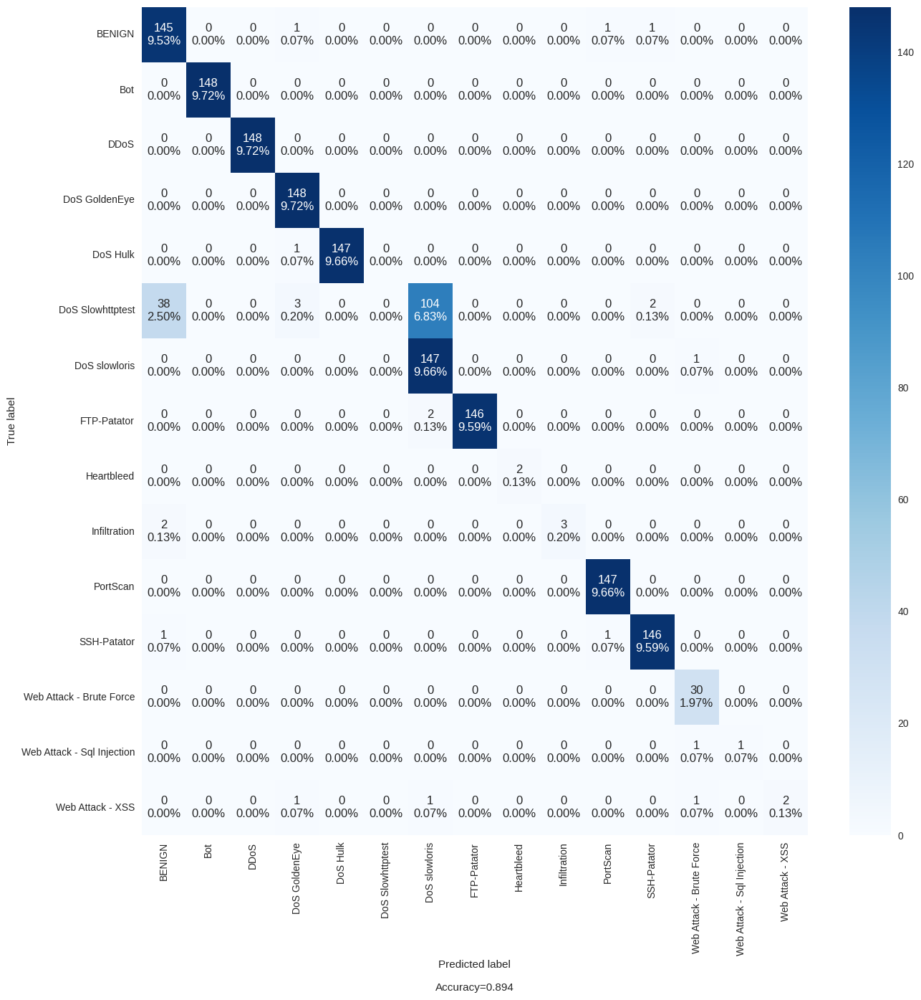

In [ ]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [ ]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'DoS slowloris']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 0.2084500	total: 158ms	remaining: 6.15s
1:	learn: 0.1542431	total: 369ms	remaining: 7s
2:	learn: 0.1181412	total: 564ms	remaining: 6.95s
3:	learn: 0.0910344	total: 751ms	remaining: 6.76s
4:	learn: 0.0762485	total: 939ms	remaining: 6.58s
5:	learn: 0.0628154	total: 1.13s	remaining: 6.39s
6:	learn: 0.0536109	total: 1.32s	remaining: 6.22s
7:	learn: 0.0465280	total: 1.51s	remaining: 6.03s
8:	learn: 0.0423952	total: 1.71s	remaining: 5.88s
9:	learn: 0.0388979	total: 1.91s	remaining: 5.74s
10:	learn: 0.0344209	total: 2.11s	remaining: 5.55s
11:	learn: 0.0326023	total: 2.33s	remaining: 5.44s
12:	learn: 0.0301503	total: 2.52s	remaining: 5.24s
13:	learn: 0.0283240	total: 2.71s	remaining: 5.03s
14:	learn: 0.0267429	total: 2.9s	remaining: 4.84s
15:	learn: 0.0255864	total: 3.09s	remaining: 4.64s
16:	learn: 0.0254330	total: 3.28s	remaining: 4.44s
17:	learn: 0.0236399	total: 3.47s	remaining: 4.24s
18:	learn: 0.0228421	total: 3.66s	remaining: 4.04s
19:	learn: 0.0207899	total: 3.85s	remaining: 

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.998908,0.893561
1,PRECISION,0.998915,0.841297
2,RECALL,0.998908,0.893561
3,F1 SCORE,0.998904,0.859438


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


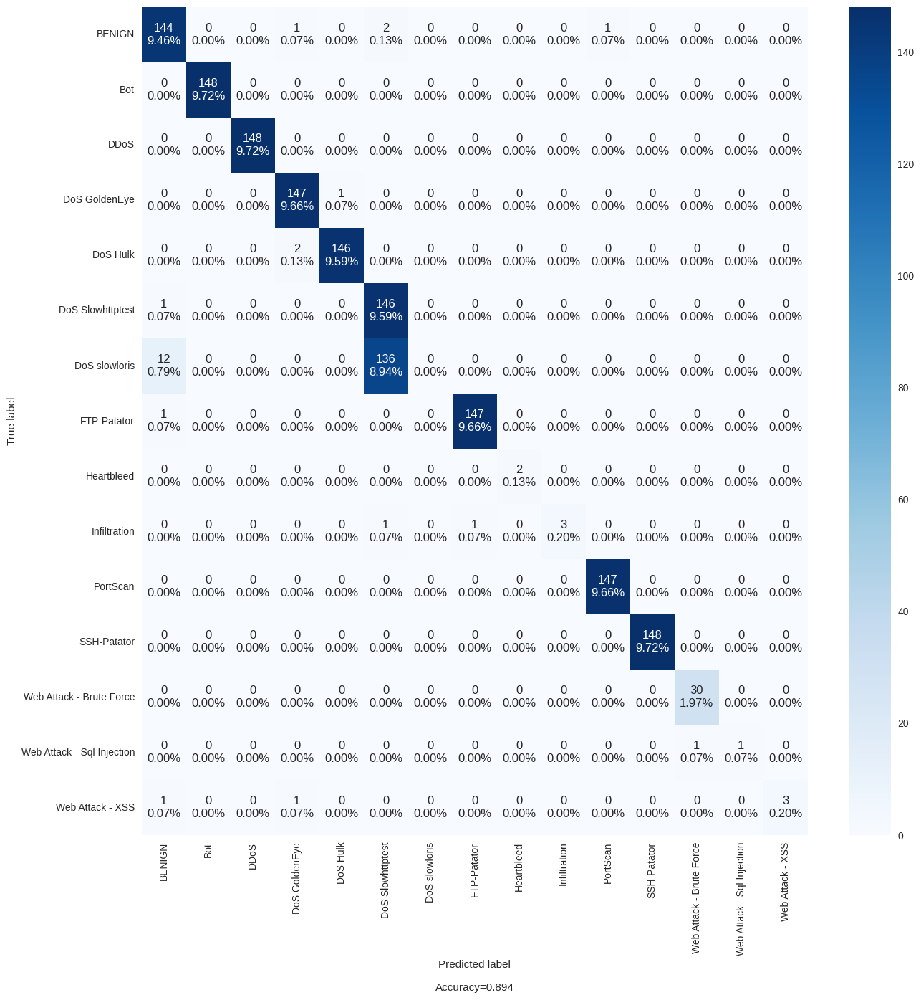

In [ ]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [ ]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'FTP-Patator']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 0.4236209	total: 164ms	remaining: 6.38s
1:	learn: 0.2394140	total: 351ms	remaining: 6.66s
2:	learn: 0.1605551	total: 545ms	remaining: 6.72s
3:	learn: 0.1279719	total: 733ms	remaining: 6.6s
4:	learn: 0.1068808	total: 925ms	remaining: 6.47s
5:	learn: 0.0886392	total: 1.11s	remaining: 6.32s
6:	learn: 0.0783261	total: 1.33s	remaining: 6.26s
7:	learn: 0.0730241	total: 1.54s	remaining: 6.16s
8:	learn: 0.0655003	total: 1.77s	remaining: 6.1s
9:	learn: 0.0599727	total: 1.97s	remaining: 5.89s
10:	learn: 0.0576770	total: 1.99s	remaining: 5.25s
11:	learn: 0.0524759	total: 2.19s	remaining: 5.1s
12:	learn: 0.0491318	total: 2.39s	remaining: 4.96s
13:	learn: 0.0465245	total: 2.6s	remaining: 4.83s
14:	learn: 0.0441600	total: 2.79s	remaining: 4.65s
15:	learn: 0.0435337	total: 2.98s	remaining: 4.47s
16:	learn: 0.0429185	total: 3.17s	remaining: 4.29s
17:	learn: 0.0407473	total: 3.38s	remaining: 4.13s
18:	learn: 0.0390829	total: 3.57s	remaining: 3.95s
19:	learn: 0.0379065	total: 3.77s	remaining: 

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.995087,0.890276
1,PRECISION,0.995153,0.842580
2,RECALL,0.995087,0.890276
3,F1 SCORE,0.995082,0.858274


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


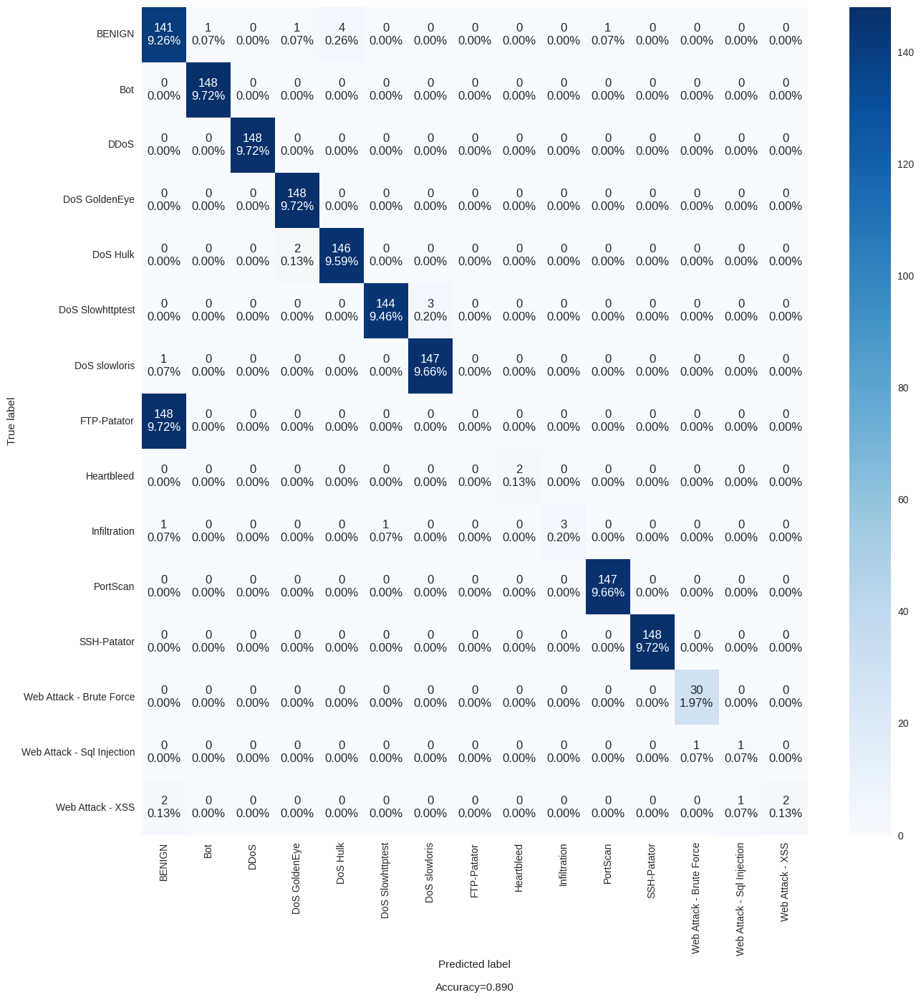

In [ ]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [ ]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'Heartbleed']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 0.3981873	total: 166ms	remaining: 6.48s
1:	learn: 0.1970951	total: 353ms	remaining: 6.71s
2:	learn: 0.1620806	total: 550ms	remaining: 6.78s
3:	learn: 0.1277499	total: 744ms	remaining: 6.69s
4:	learn: 0.1072961	total: 938ms	remaining: 6.57s
5:	learn: 0.0850637	total: 1.13s	remaining: 6.4s
6:	learn: 0.0744532	total: 1.32s	remaining: 6.23s
7:	learn: 0.0655143	total: 1.52s	remaining: 6.07s
8:	learn: 0.0588250	total: 1.72s	remaining: 5.91s
9:	learn: 0.0537067	total: 1.91s	remaining: 5.74s
10:	learn: 0.0497002	total: 2.12s	remaining: 5.58s
11:	learn: 0.0467707	total: 2.34s	remaining: 5.45s
12:	learn: 0.0435324	total: 2.54s	remaining: 5.28s
13:	learn: 0.0420236	total: 2.73s	remaining: 5.08s
14:	learn: 0.0394749	total: 2.93s	remaining: 4.89s
15:	learn: 0.0383851	total: 3.13s	remaining: 4.7s
16:	learn: 0.0371980	total: 3.34s	remaining: 4.52s
17:	learn: 0.0370572	total: 3.55s	remaining: 4.34s
18:	learn: 0.0351831	total: 3.75s	remaining: 4.15s
19:	learn: 0.0346721	total: 3.96s	remaining

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.996380,0.986202
1,PRECISION,0.996451,0.984637
2,RECALL,0.996380,0.986202
3,F1 SCORE,0.996371,0.984850


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


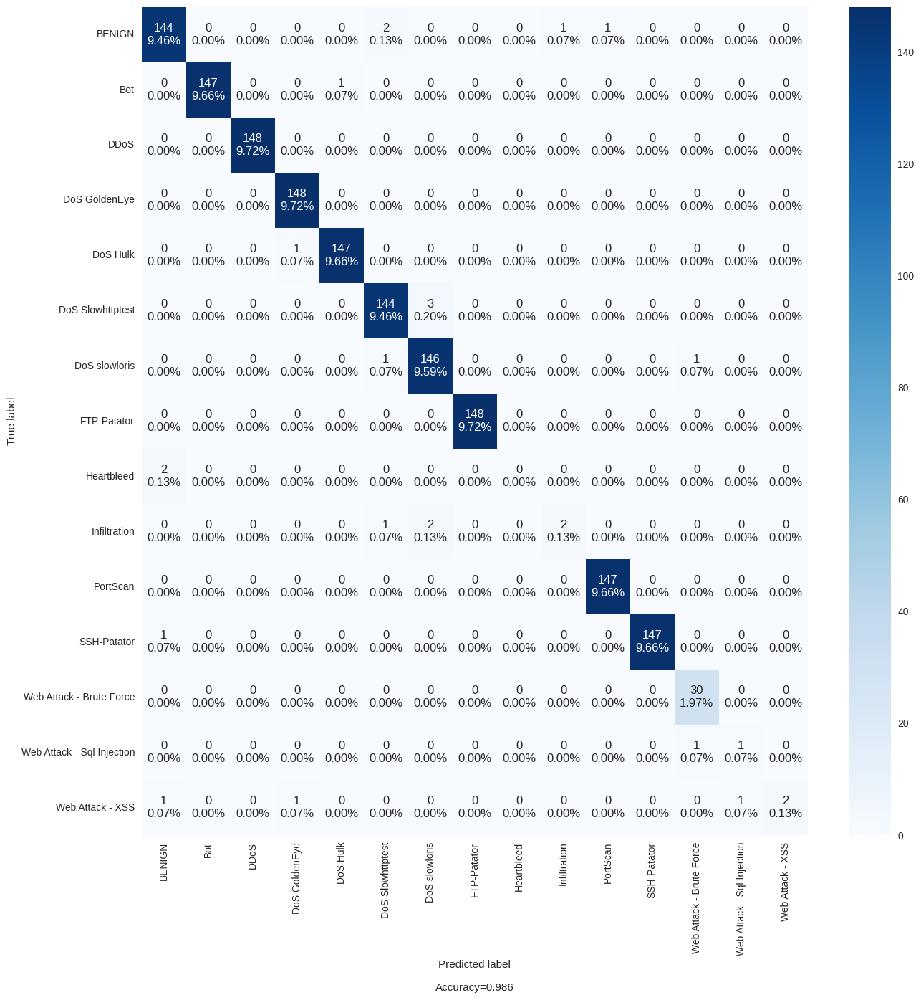

In [ ]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [ ]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'Infiltration']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 0.3818050	total: 190ms	remaining: 7.4s
1:	learn: 0.1996689	total: 382ms	remaining: 7.27s
2:	learn: 0.1391926	total: 585ms	remaining: 7.21s
3:	learn: 0.1136192	total: 790ms	remaining: 7.11s
4:	learn: 0.0948191	total: 994ms	remaining: 6.96s
5:	learn: 0.0796809	total: 1.22s	remaining: 6.92s
6:	learn: 0.0703753	total: 1.42s	remaining: 6.69s
7:	learn: 0.0639774	total: 1.63s	remaining: 6.52s
8:	learn: 0.0577892	total: 1.83s	remaining: 6.3s
9:	learn: 0.0534578	total: 2.04s	remaining: 6.13s
10:	learn: 0.0499618	total: 2.24s	remaining: 5.92s
11:	learn: 0.0469414	total: 2.45s	remaining: 5.71s
12:	learn: 0.0447553	total: 2.66s	remaining: 5.52s
13:	learn: 0.0434957	total: 2.89s	remaining: 5.36s
14:	learn: 0.0404497	total: 3.1s	remaining: 5.18s
15:	learn: 0.0389269	total: 3.32s	remaining: 4.98s
16:	learn: 0.0370298	total: 3.54s	remaining: 4.79s
17:	learn: 0.0350268	total: 3.77s	remaining: 4.61s
18:	learn: 0.0337680	total: 4.05s	remaining: 4.48s
19:	learn: 0.0320082	total: 4.28s	remaining:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.996207,0.987516
1,PRECISION,0.996274,0.984366
2,RECALL,0.996207,0.987516
3,F1 SCORE,0.996190,0.985633


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


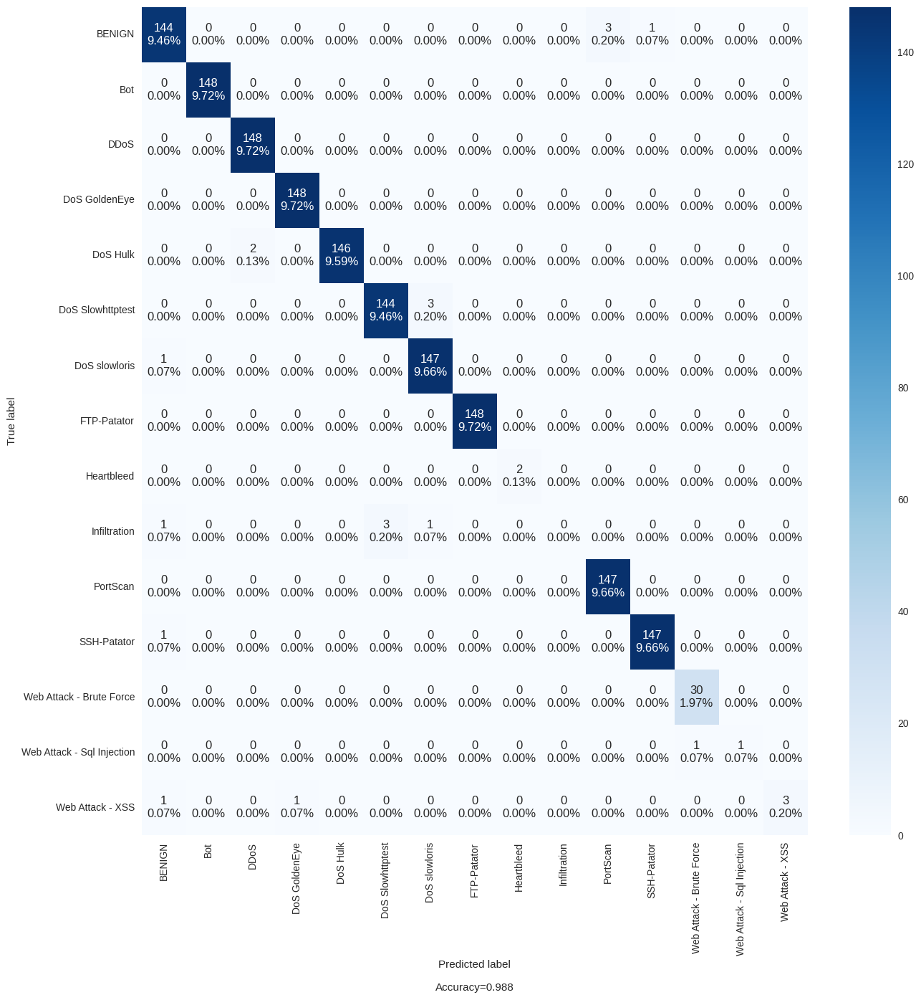

In [ ]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [ ]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'PortScan']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 0.4005794	total: 198ms	remaining: 7.72s
1:	learn: 0.2115085	total: 405ms	remaining: 7.7s
2:	learn: 0.1520184	total: 622ms	remaining: 7.67s
3:	learn: 0.1276394	total: 837ms	remaining: 7.53s
4:	learn: 0.1142973	total: 1.06s	remaining: 7.43s
5:	learn: 0.0959899	total: 1.29s	remaining: 7.33s
6:	learn: 0.0825531	total: 1.53s	remaining: 7.24s
7:	learn: 0.0716285	total: 1.77s	remaining: 7.1s
8:	learn: 0.0665441	total: 2.01s	remaining: 6.93s
9:	learn: 0.0590806	total: 2.24s	remaining: 6.72s
10:	learn: 0.0542103	total: 2.49s	remaining: 6.58s
11:	learn: 0.0491500	total: 2.76s	remaining: 6.44s
12:	learn: 0.0458307	total: 3.02s	remaining: 6.28s
13:	learn: 0.0425640	total: 3.26s	remaining: 6.06s
14:	learn: 0.0413039	total: 3.5s	remaining: 5.84s
15:	learn: 0.0396444	total: 3.73s	remaining: 5.6s
16:	learn: 0.0378849	total: 3.96s	remaining: 5.37s
17:	learn: 0.0363145	total: 4.2s	remaining: 5.13s
18:	learn: 0.0340033	total: 4.43s	remaining: 4.9s
19:	learn: 0.0326170	total: 4.66s	remaining: 4.

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.996360,0.890276
1,PRECISION,0.996428,0.843428
2,RECALL,0.996360,0.890276
3,F1 SCORE,0.996355,0.858746


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


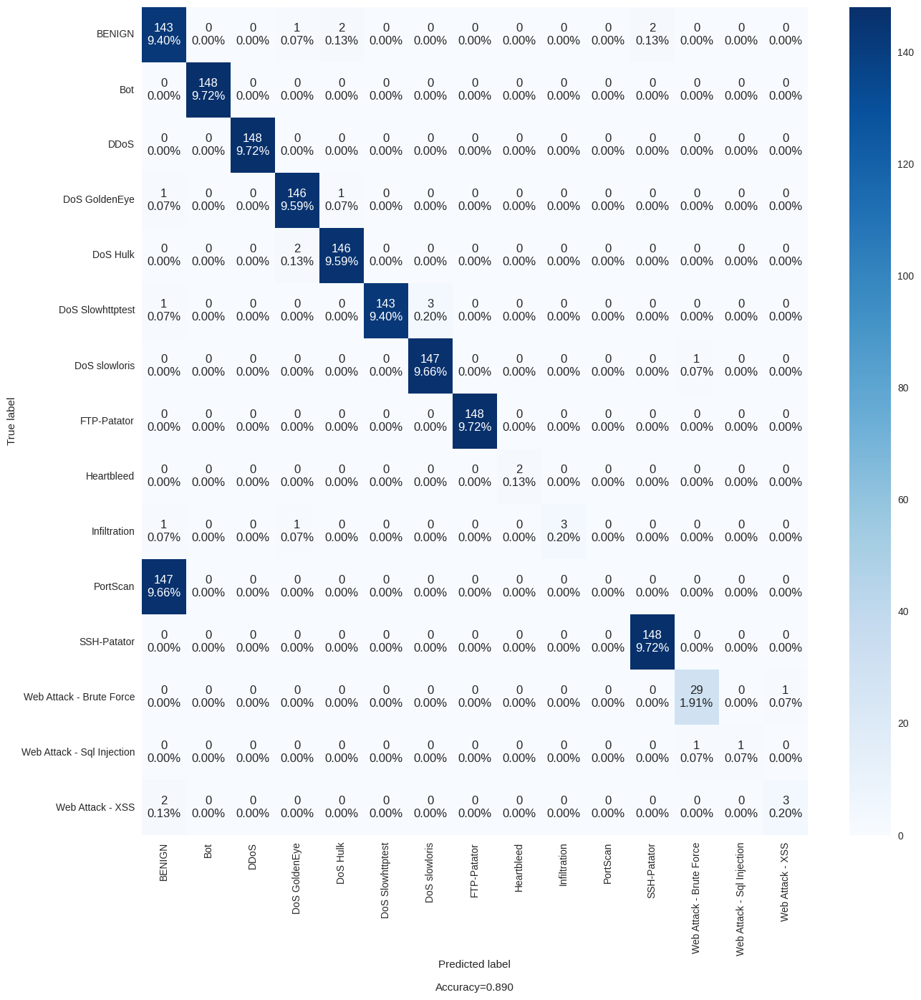

In [ ]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [ ]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'SSH-Patator']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 0.3160007	total: 200ms	remaining: 7.78s
1:	learn: 0.2637416	total: 405ms	remaining: 7.69s
2:	learn: 0.1561924	total: 620ms	remaining: 7.64s
3:	learn: 0.1236505	total: 831ms	remaining: 7.48s
4:	learn: 0.1031351	total: 1.06s	remaining: 7.39s
5:	learn: 0.0870149	total: 1.28s	remaining: 7.27s
6:	learn: 0.0769498	total: 1.56s	remaining: 7.34s
7:	learn: 0.0705849	total: 1.68s	remaining: 6.74s
8:	learn: 0.0640441	total: 1.97s	remaining: 6.77s
9:	learn: 0.0622444	total: 2.2s	remaining: 6.61s
10:	learn: 0.0571107	total: 2.43s	remaining: 6.41s
11:	learn: 0.0554048	total: 2.65s	remaining: 6.2s
12:	learn: 0.0525868	total: 2.89s	remaining: 6.01s
13:	learn: 0.0476241	total: 3.12s	remaining: 5.8s
14:	learn: 0.0456596	total: 3.35s	remaining: 5.58s
15:	learn: 0.0443134	total: 3.58s	remaining: 5.37s
16:	learn: 0.0432241	total: 3.81s	remaining: 5.15s
17:	learn: 0.0414942	total: 4.04s	remaining: 4.94s
18:	learn: 0.0403133	total: 4.27s	remaining: 4.72s
19:	learn: 0.0400197	total: 4.39s	remaining:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.994723,0.890276
1,PRECISION,0.994783,0.842466
2,RECALL,0.994723,0.890276
3,F1 SCORE,0.994714,0.858566


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


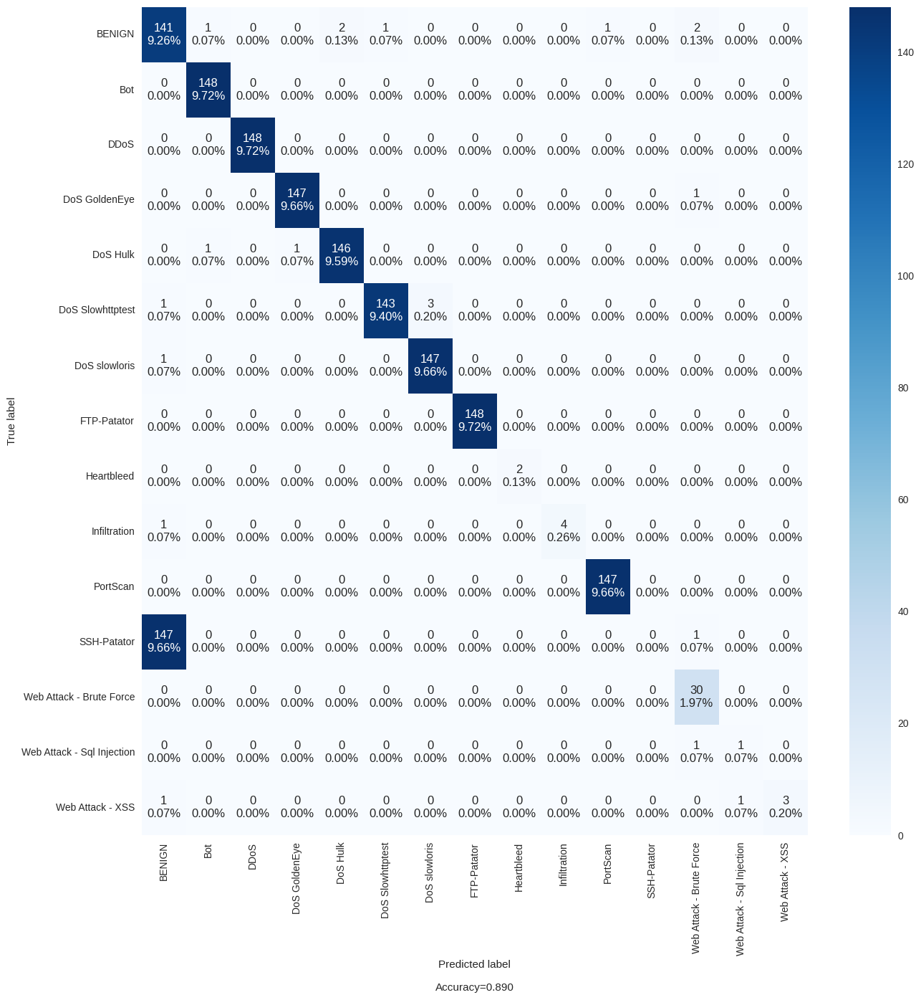

In [ ]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [ ]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'Web Attack - Brute Force']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 0.4116925	total: 203ms	remaining: 7.92s
1:	learn: 0.2014348	total: 409ms	remaining: 7.78s
2:	learn: 0.1480184	total: 623ms	remaining: 7.68s
3:	learn: 0.1280451	total: 860ms	remaining: 7.74s
4:	learn: 0.1139921	total: 1.14s	remaining: 7.96s
5:	learn: 0.0970399	total: 1.39s	remaining: 7.87s
6:	learn: 0.0855098	total: 1.62s	remaining: 7.65s
7:	learn: 0.0704890	total: 1.85s	remaining: 7.4s
8:	learn: 0.0616808	total: 2.08s	remaining: 7.16s
9:	learn: 0.0561115	total: 2.31s	remaining: 6.93s
10:	learn: 0.0518101	total: 2.54s	remaining: 6.7s
11:	learn: 0.0464084	total: 2.77s	remaining: 6.47s
12:	learn: 0.0444273	total: 3.01s	remaining: 6.26s
13:	learn: 0.0420557	total: 3.24s	remaining: 6.01s
14:	learn: 0.0397338	total: 3.47s	remaining: 5.78s
15:	learn: 0.0368728	total: 3.7s	remaining: 5.54s
16:	learn: 0.0348356	total: 3.93s	remaining: 5.32s
17:	learn: 0.0330815	total: 4.17s	remaining: 5.09s
18:	learn: 0.0312412	total: 4.39s	remaining: 4.86s
19:	learn: 0.0310559	total: 4.61s	remaining:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.996815,0.967148
1,PRECISION,0.996877,0.951556
2,RECALL,0.996815,0.967148
3,F1 SCORE,0.996812,0.957874


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


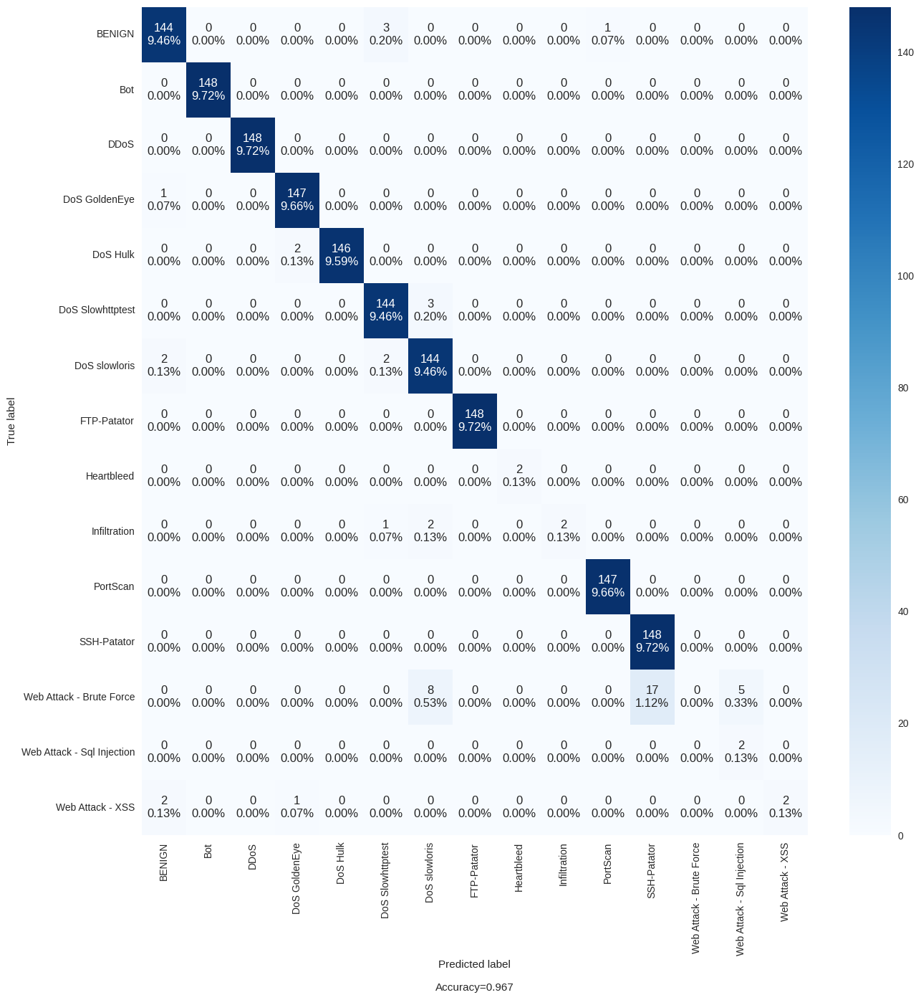

In [ ]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [ ]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'Web Attack - Sql Injection']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 0.2820636	total: 208ms	remaining: 8.12s
1:	learn: 0.2122418	total: 440ms	remaining: 8.35s
2:	learn: 0.1600871	total: 681ms	remaining: 8.4s
3:	learn: 0.1261735	total: 902ms	remaining: 8.12s
4:	learn: 0.1046361	total: 1.12s	remaining: 7.86s
5:	learn: 0.0832382	total: 1.35s	remaining: 7.64s
6:	learn: 0.0753610	total: 1.58s	remaining: 7.45s
7:	learn: 0.0676687	total: 1.81s	remaining: 7.26s
8:	learn: 0.0602702	total: 2.04s	remaining: 7.04s
9:	learn: 0.0570340	total: 2.27s	remaining: 6.82s
10:	learn: 0.0522630	total: 2.5s	remaining: 6.59s
11:	learn: 0.0499848	total: 2.73s	remaining: 6.37s
12:	learn: 0.0481235	total: 2.97s	remaining: 6.16s
13:	learn: 0.0439779	total: 3.19s	remaining: 5.93s
14:	learn: 0.0424178	total: 3.43s	remaining: 5.71s
15:	learn: 0.0403275	total: 3.66s	remaining: 5.49s
16:	learn: 0.0390291	total: 3.9s	remaining: 5.27s
17:	learn: 0.0361374	total: 4.13s	remaining: 5.04s
18:	learn: 0.0341704	total: 4.36s	remaining: 4.82s
19:	learn: 0.0339768	total: 4.59s	remaining:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.995721,0.988830
1,PRECISION,0.995792,0.987546
2,RECALL,0.995721,0.988830
3,F1 SCORE,0.995717,0.988041


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


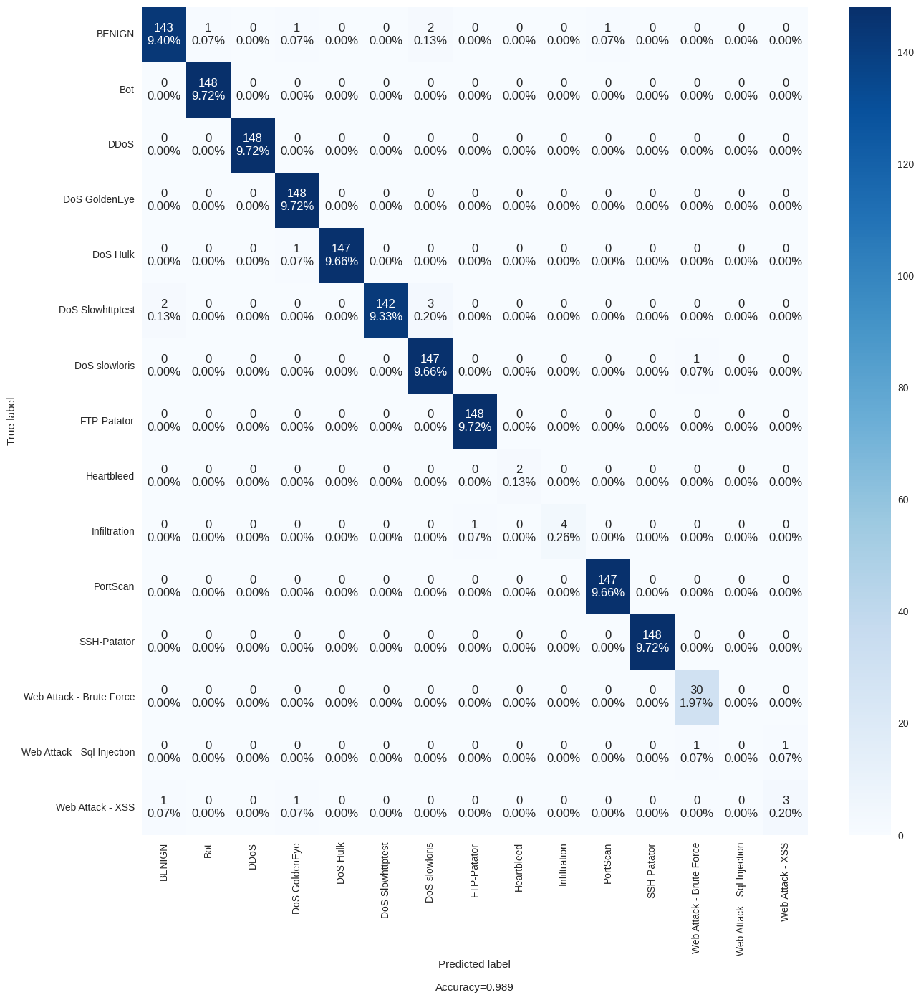

In [ ]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [ ]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'Web Attack - XSS']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 0.3084730	total: 209ms	remaining: 8.13s
1:	learn: 0.1546587	total: 425ms	remaining: 8.08s
2:	learn: 0.1152058	total: 635ms	remaining: 7.83s
3:	learn: 0.0939787	total: 858ms	remaining: 7.72s
4:	learn: 0.0833473	total: 1.1s	remaining: 7.69s
5:	learn: 0.0742542	total: 1.33s	remaining: 7.52s
6:	learn: 0.0639958	total: 1.55s	remaining: 7.31s
7:	learn: 0.0592021	total: 1.78s	remaining: 7.14s
8:	learn: 0.0547709	total: 2.07s	remaining: 7.12s
9:	learn: 0.0525422	total: 2.3s	remaining: 6.91s
10:	learn: 0.0482587	total: 2.53s	remaining: 6.66s
11:	learn: 0.0446417	total: 2.76s	remaining: 6.43s
12:	learn: 0.0417288	total: 2.99s	remaining: 6.21s
13:	learn: 0.0396056	total: 3.23s	remaining: 5.99s
14:	learn: 0.0370891	total: 3.45s	remaining: 5.75s
15:	learn: 0.0355300	total: 3.67s	remaining: 5.51s
16:	learn: 0.0338516	total: 3.92s	remaining: 5.3s
17:	learn: 0.0332335	total: 4.18s	remaining: 5.11s
18:	learn: 0.0324765	total: 4.42s	remaining: 4.88s
19:	learn: 0.0312612	total: 4.65s	remaining:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.996702,0.984231
1,PRECISION,0.996763,0.981317
2,RECALL,0.996702,0.984231
3,F1 SCORE,0.996697,0.982234


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


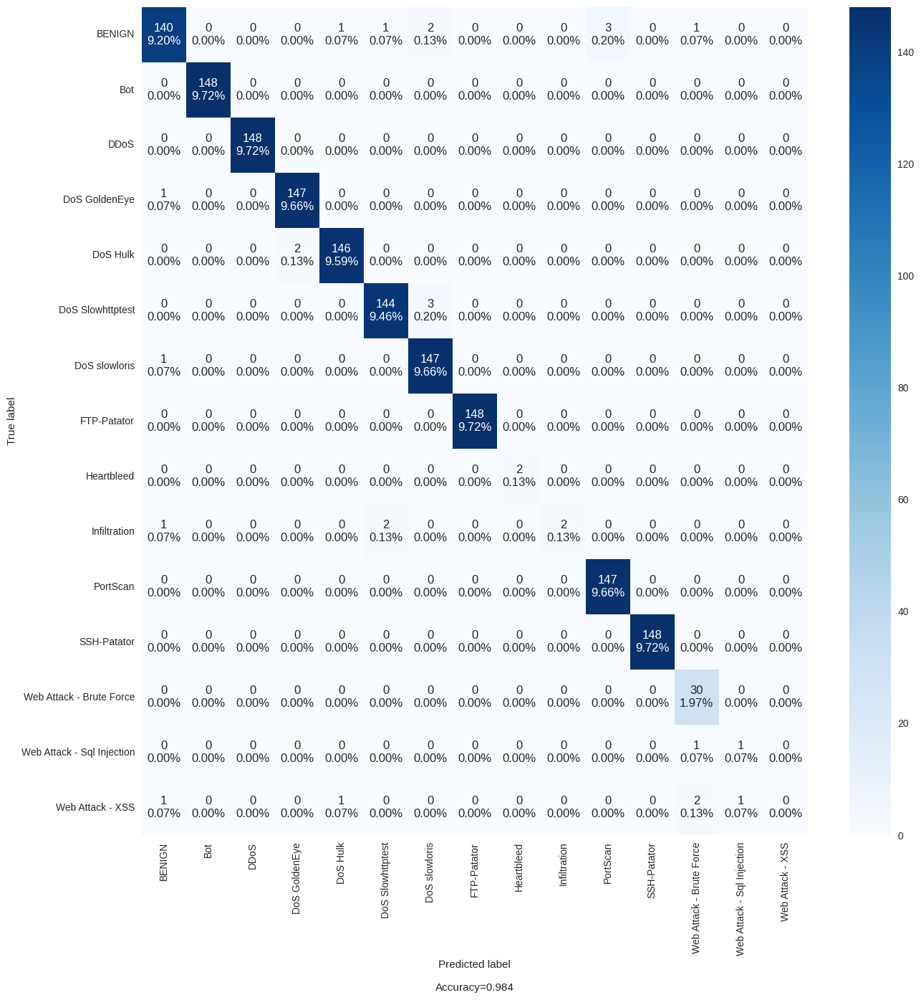

In [ ]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))